# Evaluation of models on test data

In [1]:
import util
import plotting
import evaluation
import preprocessing

import numpy as np
import pandas as pd
from skimage.color import label2rgb
from skimage import filters, measure, segmentation

import matplotlib.pyplot as plt
plt.rc('xtick', labelsize=18)
plt.rc('ytick', labelsize=18)
plt.rc('axes', labelsize=20)
plt.rc('legend', fontsize=18)

from tqdm import tqdm
import tensorflow as tf

In [2]:
#Define GPU device where the code will run on
gpu = tf.config.list_physical_devices('GPU')[0]
print(gpu)
tf.config.experimental.set_memory_growth(gpu, True)
gpu = tf.device('GPU:0/')

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


## Data and models directories

In [4]:
#base_dir = 'H:/Santi/'
base_dir = 'H:/Santi/'
data_path = base_dir+'Data/' 
model_path = base_dir+'Models/' 

## No preprocessing, different batch sizes

In [7]:
#Inputs
input_data = util.load_h5(data_path, 'Mito')
print('Inputs'+':', input_data.shape)

#Outputs
output_data = util.load_h5(data_path, 'Proc')
print('Outputs:', output_data.shape)

labels = util.load_h5(data_path, 'labels')
print('Labels:', labels.shape)


Loading //lebsrv2.epfl.ch/LEB_SHARED/SHARED/_Scientific projects/MitoSplit-Net/Data/Mito.h5
Converting to array
Inputs: (37000, 128, 128)

Loading //lebsrv2.epfl.ch/LEB_SHARED/SHARED/_Scientific projects/MitoSplit-Net/Data/Proc.h5
Converting to array
Outputs: (37000, 128, 128)

Loading //lebsrv2.epfl.ch/LEB_SHARED/SHARED/_Scientific projects/MitoSplit-Net/Data/labels.h5
Converting to array
Labels: (37000, 128, 128)


In [71]:
folder_name = util.get_filename(model_path, 'ref_f8')
idx_sort = np.argsort([int(model_name.split('_b')[-1]) for model_name in folder_name])
folder_name = [folder_name[i] for i in idx_sort]
nb_models = len(folder_name)

model = util.load_model(model_path, ['model']*nb_models, folder_name, as_type=dict)
history = util.load_pkl(model_path, ['history']*nb_models, folder_name, as_type=dict)
frames_test = util.load_pkl(model_path, ['frames_test']*nb_models, folder_name, as_type=dict)


Loading H:/Santi/Models/ref_f8_c9_b8/model.h5

Loading H:/Santi/Models/ref_f8_c9_b16/model.h5

Loading H:/Santi/Models/ref_f8_c9_b32/model.h5

Loading H:/Santi/Models/ref_f8_c9_b256/model.h5
Done.

Loading H:/Santi/Models/ref_f8_c9_b8/history

Loading H:/Santi/Models/ref_f8_c9_b16/history

Loading H:/Santi/Models/ref_f8_c9_b32/history

Loading H:/Santi/Models/ref_f8_c9_b256/history
Done.

Loading H:/Santi/Models/ref_f8_c9_b8/frames_test

Loading H:/Santi/Models/ref_f8_c9_b16/frames_test

Loading H:/Santi/Models/ref_f8_c9_b32/frames_test

Loading H:/Santi/Models/ref_f8_c9_b256/frames_test
Done.


In [72]:
input_test, output_test, pred_output_test = {}, {}, {}
labels_test, pred_labels_test = {}, {}
otsu_threshold = {}

for model_name in tqdm(model, total=len(model)):
  print('\nModel: %s'%model_name)
  input_test[model_name] = input_data[frames_test[model_name]]
  output_test[model_name] = output_data[frames_test[model_name]]
  labels_test[model_name] = labels[frames_test[model_name]]

  pred_output_test[model_name] = evaluation.predict(input_test[model_name], model[model_name])
  otsu_threshold[model_name] = filters.threshold_otsu(pred_output_test[model_name])
  pred_labels_test[model_name] = evaluation.label(pred_output_test[model_name], threshold=otsu_threshold[model_name]) 

del output_data, labels, input_data

  0%|                                                                        | 0/4 [00:00<?, ?it/s]


Model: ref_f8_c9_b8


 25%|████████████████                                                | 1/4 [00:06<00:20,  6.94s/it]


Model: ref_f8_c9_b16


 50%|████████████████████████████████                                | 2/4 [00:13<00:13,  6.78s/it]


Model: ref_f8_c9_b32


 75%|████████████████████████████████████████████████                | 3/4 [00:20<00:06,  6.88s/it]


Model: ref_f8_c9_b256


100%|████████████████████████████████████████████████████████████████| 4/4 [00:27<00:00,  6.82s/it]


H:/Santi/Figures/ref_examples.pdf


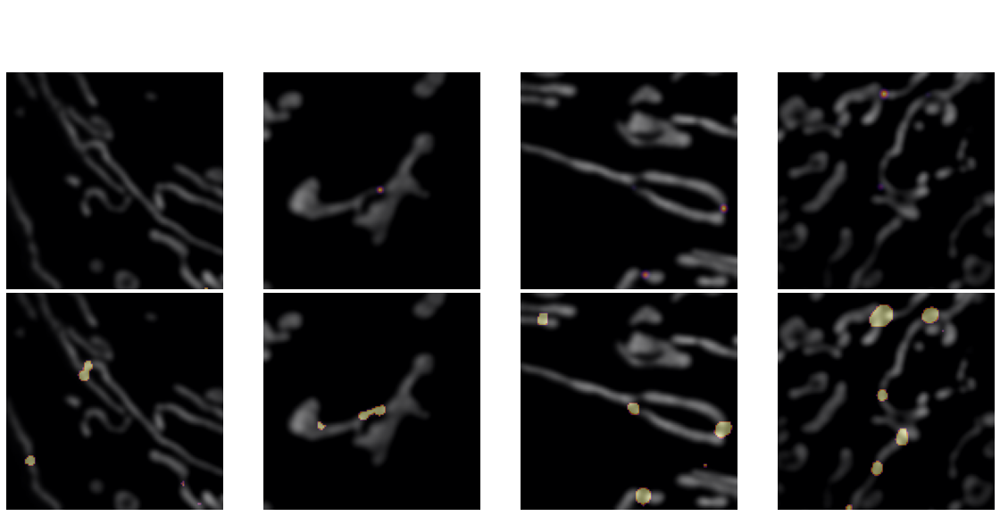

In [78]:
title = 'ref_examples'
filename = base_dir+'Figures/'+title+'.pdf'
print(filename)

title_size = 36

fig, axes = plt.subplots(2, nb_models, figsize=(4*nb_models, 8))
fig.suptitle('Batch size', size=title_size, color='white')
for model_name, b, i in zip(folder_name, [8, 16, 32, 256], range(nb_models)):
  frame = np.random.choice(np.where(np.any(np.any(output_test[model_name]>0, axis=-1), axis=-1))[0])
  mask = pred_output_test[model_name][frame]>otsu_threshold[model_name]
  plotting.plot_merge(input_test[model_name][frame], output_test[model_name][frame], title='', ax=axes[0, i])
  plotting.plot_merge(input_test[model_name][frame], pred_output_test[model_name][frame]*mask, title='', ax=axes[1, i])
  axes[0, i].set_title(b, size=title_size, color='white')
  
fig.tight_layout(pad=0)
fig.subplots_adjust(wspace=0, hspace=0.02, top=0.85)
plt.show()
#fig.savefig(filename)

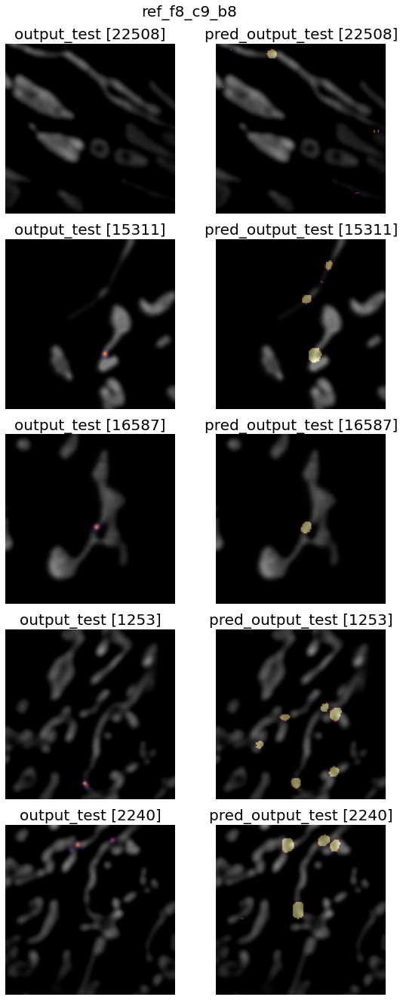

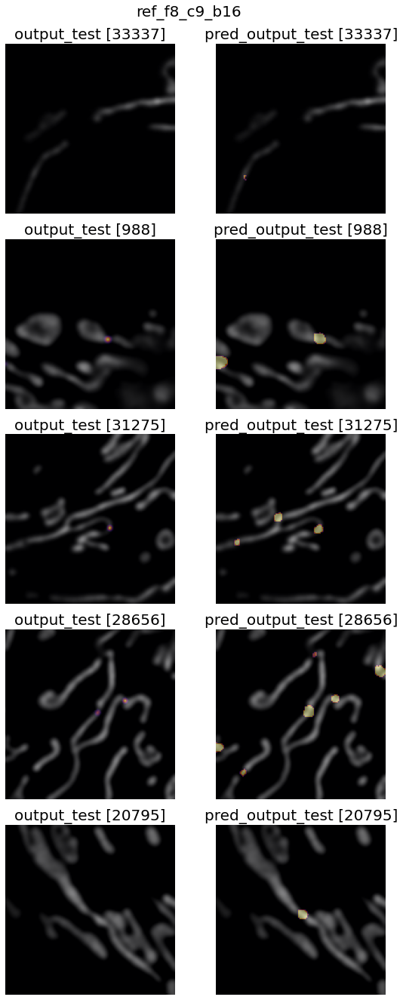

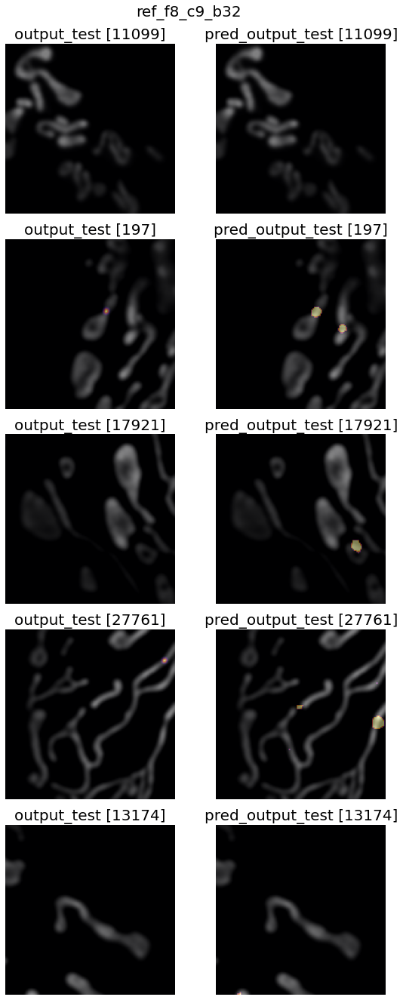

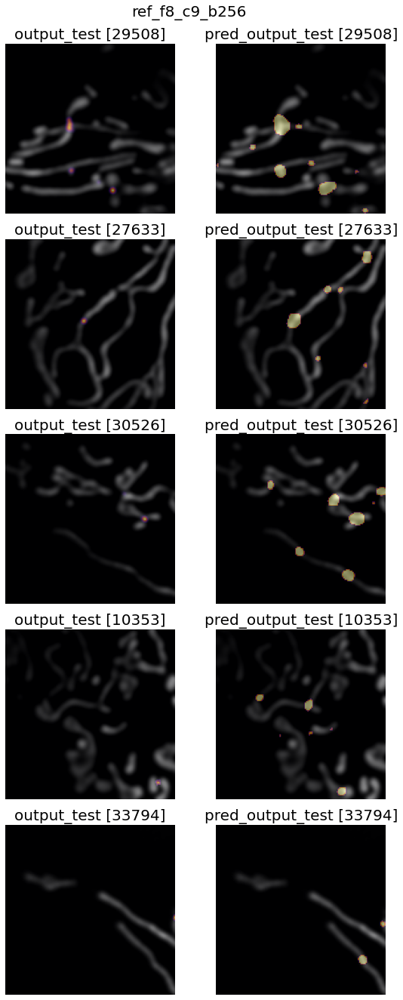

In [22]:
for model_name in folder_name:
  mask = pred_output_test[model_name]>otsu_threshold[model_name]
  plotting.plot_outputs(input_test[model_name], output_test[model_name], 
                        pred_output_test[model_name]*mask, frames_test[model_name], 
                        nb_examples=5, title=model_name, cmap=['gray', 'inferno'])
  plt.show()
  print('\n')

In [23]:
thresholds = np.linspace(0, 1, 50, endpoint=True)
metrics = util.load_pkl(model_path, ['metrics']*len(model), folder_name, as_type=dict)


Loading H:/Santi/Models/ref_f8_c9_b8/metrics

Loading H:/Santi/Models/ref_f8_c9_b16/metrics

Loading H:/Santi/Models/ref_f8_c9_b32/metrics

Loading H:/Santi/Models/ref_f8_c9_b256/metrics
Done.


### All metrics

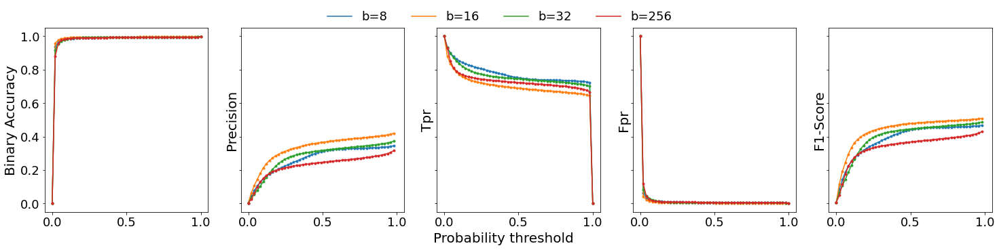

In [24]:
nb_metrics = len(metrics[folder_name[0]])
colors = plt.cm.get_cmap('tab10')(range(nb_metrics))

fig, axes = plt.subplots(1, nb_metrics, figsize=(5*nb_metrics, 5), sharex=True, sharey=True)

for model_name, color in zip(folder_name, colors):
  for metric_name, ax in zip(metrics[model_name], axes):
    ax.plot(thresholds, metrics[model_name][metric_name], 'o-', markersize=3, color=color)
    ax.set_ylabel(metric_name.title())
fig.text(0.5, 0, 'Probability threshold', fontsize=20, ha='center')
fig.legend([plt.plot([], color=color)[0] for color in colors], ['b='+model_name.split('_b')[-1] for model_name in folder_name], 
           loc='upper center', ncol=4, framealpha=0)
plt.show()

### metricAtMaxThreshold

In [25]:
metricsAtMaxThreshold = pd.DataFrame({model_name: {metric_name: metrics[model_name][metric_name][-2]  for metric_name in metrics[model_name]} \
                                      for model_name in folder_name})
metricsAtMaxThreshold

,ref_f8_c9_b8,ref_f8_c9_b16,ref_f8_c9_b32,ref_f8_c9_b256
binary accuracy,0.994731,0.996018,0.995367,0.994197
precision,0.345865,0.419817,0.372975,0.316267
TPR,0.723543,0.645070,0.700927,0.667311
FPR,0.004397,0.002857,0.003707,0.004731
F1-score,0.468013,0.508620,0.486875,0.429144


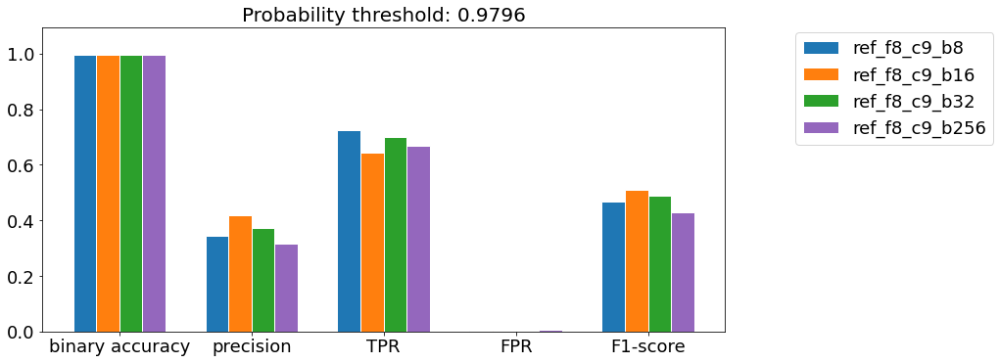

In [26]:
ax = plotting.plot_metrics_comparison(metricsAtMaxThreshold, xscale=2.5, yscale=1.1)
ax.set_title('Probability threshold: %.4f'%thresholds[-2], size=20)
plt.show()

### ROC and Precision-Recall curves


Fraction of positives
{'ref_f8_c9_b8': 0.003203017776076858, 'ref_f8_c9_b16': 0.0031948110219594595, 'ref_f8_c9_b32': 0.003136093552048142, 'ref_f8_c9_b256': 0.0032687130489864867}


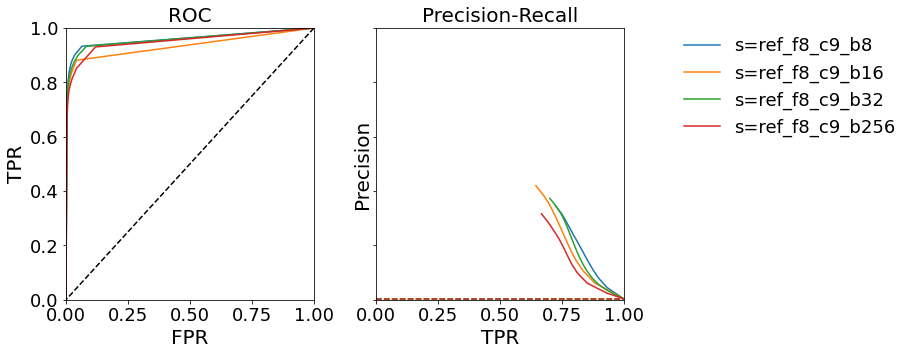

In [27]:
plotting.plot_performance_curves(metrics, output_test, colors=colors)
plt.show()

### Precision-Recall AUC

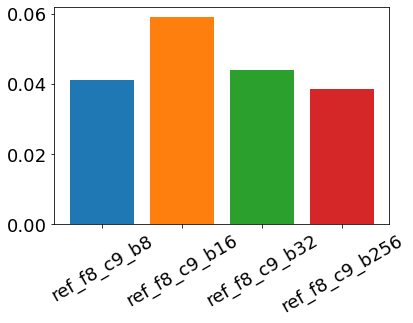

In [28]:
AUC = evaluation.get_AUC(metrics)
xticks = range(len(AUC))

fig, ax = plt.subplots()
ax.bar(xticks, list(AUC.values()), color=colors)
ax.set_xticks(xticks)
ax.set_xticklabels(list(AUC.keys()), rotation=30)
plt.show()

### Labels binary overlap

In [7]:
folder_name = util.get_filename(model_path, 'ref_f8')
idx_sort = np.argsort([int(model_name.split('_b')[-1]) for model_name in folder_name])
folder_name = [folder_name[i] for i in idx_sort]
nb_models = len(folder_name)

colors = plt.cm.get_cmap('tab10')(range(nb_models))

In [8]:
fissionStats = util.load_pkl(model_path, 'ref_fissionStats')


Loading H:/Santi/Models/ref_fissionStats


H:/Santi/Figures/ref_fissionStats.png


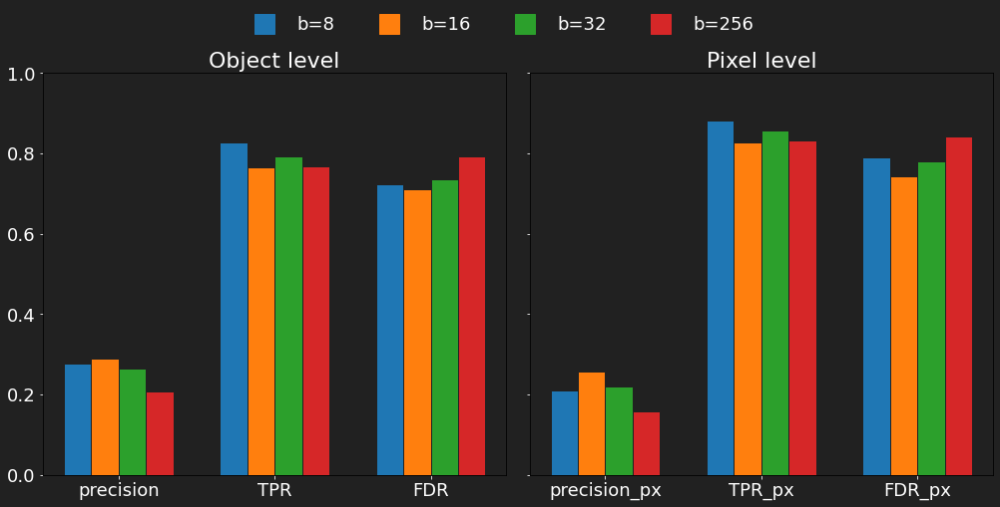

In [9]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'ref_fissionStats'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

colors = plt.cm.get_cmap('tab10')(range(nb_models))
fig, axes = plt.subplots(1, 2, figsize=(7*2, 7), sharey=True)

fig.set_facecolor(facecolor)  

plotting.plot_metrics_comparison(fissionStats.loc[['precision', 'TPR', 'FDR']], xscale=2, color=colors, ax=axes[0], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)  
plotting.plot_metrics_comparison(fissionStats.loc[['precision_px', 'TPR_px', 'FDR_px']], xscale=2, color=colors, ax=axes[1], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)

for ax, title in zip(axes, ['Object level', 'Pixel level']):
  ax.set_title(title, size=22, color='white')
  ax.set_facecolor(facecolor)
  ax.tick_params(axis='x', colors='white')
  ax.tick_params(axis='y', colors='white')

legend = fig.legend([plt.plot([], marker='s', ls='none', markersize=20, color=color)[0] for color in colors], ['b='+model_name.split('_b')[-1] for model_name in folder_name],
                    loc='upper center', facecolor=facecolor, labelcolor='white', framealpha=1, ncol=nb_models)
frame = legend.get_frame()
frame.set_color(facecolor)

plt.tight_layout(pad=0)
fig.subplots_adjust(wspace=0.05, top=0.85, right=0.98)

#plt.show()
fig.savefig(filename)

### Detection match

In [25]:
det_match = util.load_pkl(model_path, 'ref_det_match')


Loading H:/Santi/Models/ref_det_match


H:/Santi/Figures/ref_det_match.png


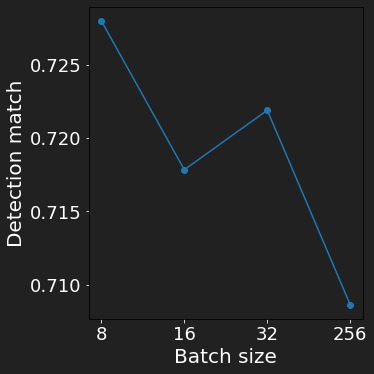

In [26]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'ref_det_match'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

fig, ax = plt.subplots(figsize=(5, 5))
fig.set_facecolor(facecolor)
ax.set_facecolor(facecolor)

ax.plot(det_match, 'o-')
ax.set_xticks(range(len(det_match)))
ax.set_xticklabels([8, 16, 32, 256])
ax.set_xlabel('Batch size', color='white')
ax.set_ylabel('Detection match', color='white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

plt.tight_layout(pad=0)
#plt.show()
fig.savefig(filename)

## MitoProc, different batch sizes

In [35]:
#Inputs
input_data = util.load_h5(data_path, 'MitoProc')
print('Inputs'+':', input_data.shape)

#Outputs
output_data = util.load_h5(data_path, 'Proc')
print('Outputs:', output_data.shape)

labels = util.load_h5(data_path, 'labels')
print('Labels:', labels.shape)


Loading H:/Santi/Data/MitoProc.h5
Converting to array
Inputs: (37000, 128, 128)

Loading H:/Santi/Data/Proc.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/labels.h5
Converting to array
Labels: (37000, 128, 128)


In [36]:
folder_name = util.get_filename(model_path, 'mp')
folder_name = [model_name for model_name in folder_name if '_s' not in model_name]
idx_sort = np.argsort([int(model_name.split('_b')[-1]) for model_name in folder_name])
folder_name = [folder_name[i] for i in idx_sort]
nb_models = len(folder_name)

model = util.load_model(model_path, ['model']*nb_models, folder_name, as_type=dict)
history = util.load_pkl(model_path, ['history']*nb_models, folder_name, as_type=dict)
frames_test = util.load_pkl(model_path, ['frames_test']*nb_models, folder_name, as_type=dict)


Loading H:/Santi/Models/mp_f8_c9_b8/model.h5

Loading H:/Santi/Models/mp_f8_c9_b16/model.h5

Loading H:/Santi/Models/mp_f8_c9_b32/model.h5

Loading H:/Santi/Models/mp_f8_c9_b256/model.h5
Done.

Loading H:/Santi/Models/mp_f8_c9_b8/history

Loading H:/Santi/Models/mp_f8_c9_b16/history

Loading H:/Santi/Models/mp_f8_c9_b32/history

Loading H:/Santi/Models/mp_f8_c9_b256/history
Done.

Loading H:/Santi/Models/mp_f8_c9_b8/frames_test

Loading H:/Santi/Models/mp_f8_c9_b16/frames_test

Loading H:/Santi/Models/mp_f8_c9_b32/frames_test

Loading H:/Santi/Models/mp_f8_c9_b256/frames_test
Done.


In [37]:
input_test, output_test, pred_output_test = {}, {}, {}
labels_test, pred_labels_test = {}, {}
otsu_threshold = {}

for model_name in tqdm(model, total=len(model)):
  print('\nModel: %s'%model_name)
  input_test[model_name] = input_data[frames_test[model_name]]
  output_test[model_name] = output_data[frames_test[model_name]]
  labels_test[model_name] = labels[frames_test[model_name]]
  
  pred_output_test[model_name] = evaluation.predict(input_test[model_name], model[model_name])
  otsu_threshold[model_name] = filters.threshold_otsu(pred_output_test[model_name])
  pred_labels_test[model_name] = evaluation.label(pred_output_test[model_name], threshold=otsu_threshold[model_name]) 

del output_data, labels, input_data

  0%|                                                                        | 0/4 [00:00<?, ?it/s]


Model: mp_f8_c9_b8


 25%|████████████████                                                | 1/4 [00:06<00:20,  6.76s/it]


Model: mp_f8_c9_b16


 50%|████████████████████████████████                                | 2/4 [00:13<00:13,  6.69s/it]


Model: mp_f8_c9_b32


 75%|████████████████████████████████████████████████                | 3/4 [00:20<00:06,  6.73s/it]


Model: mp_f8_c9_b256


100%|████████████████████████████████████████████████████████████████| 4/4 [00:27<00:00,  6.87s/it]


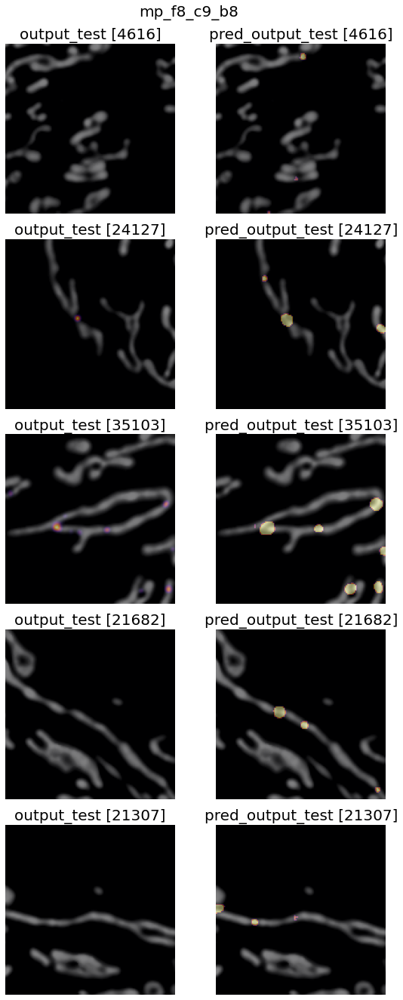

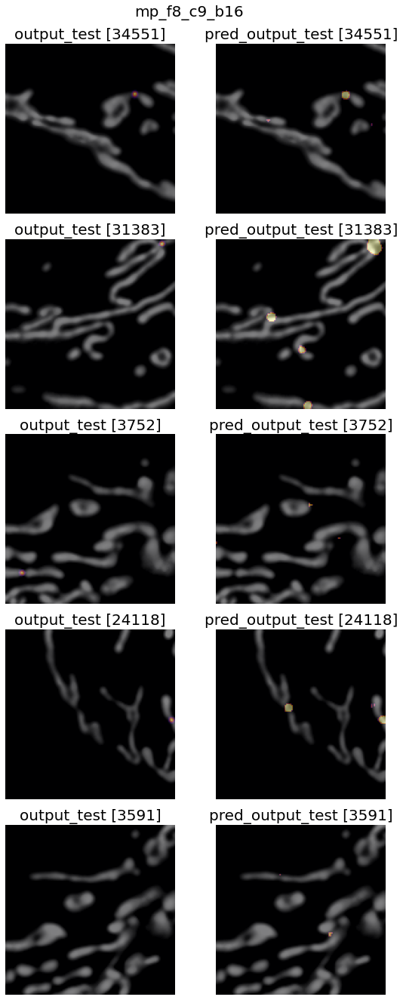

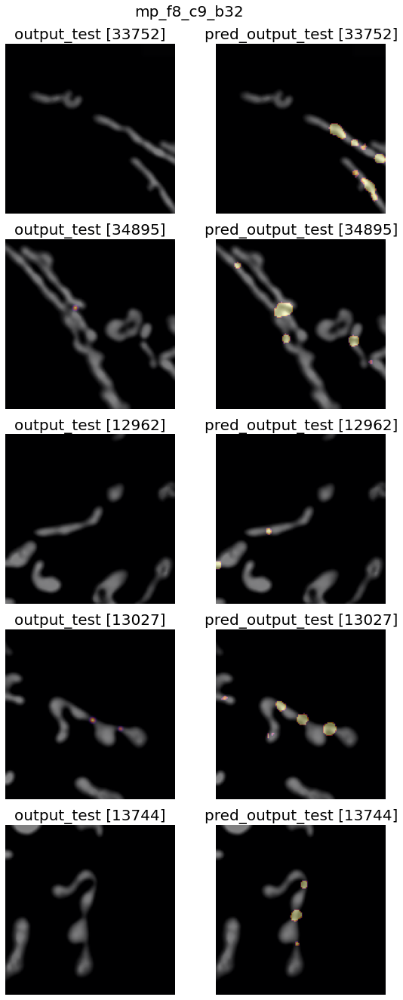

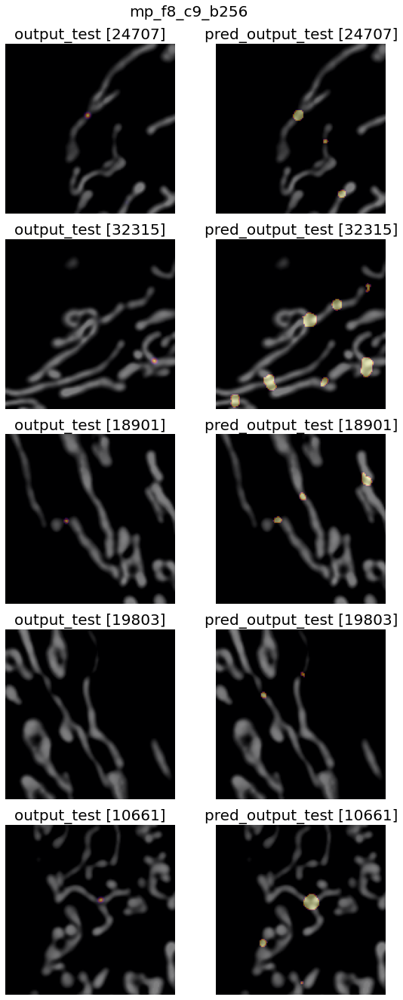

In [38]:
for model_name in folder_name:
  mask = pred_output_test[model_name]>otsu_threshold[model_name]
  plotting.plot_outputs(input_test[model_name], output_test[model_name], 
                        pred_output_test[model_name]*mask, frames_test[model_name], 
                        nb_examples=5, title=model_name, cmap=['gray', 'inferno'])
  plt.show()
  print('\n')

In [39]:
thresholds = np.linspace(0, 1, 50, endpoint=True)
metrics = util.load_pkl(model_path, ['metrics']*len(folder_name), folder_name, as_type=dict)


Loading H:/Santi/Models/mp_f8_c9_b8/metrics

Loading H:/Santi/Models/mp_f8_c9_b16/metrics

Loading H:/Santi/Models/mp_f8_c9_b32/metrics

Loading H:/Santi/Models/mp_f8_c9_b256/metrics
Done.


### All metrics

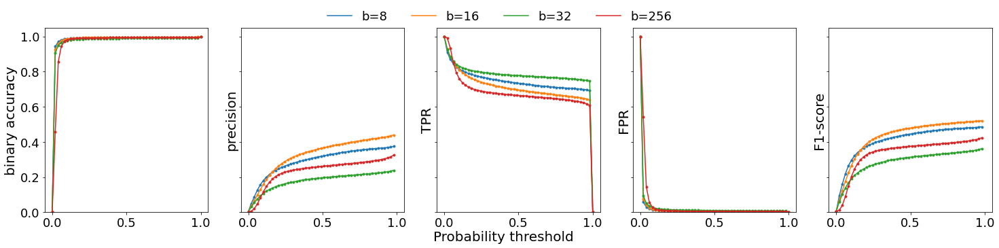

In [40]:
nb_metrics = len(metrics[folder_name[0]])
colors = plt.cm.get_cmap('tab10')(range(nb_metrics))

fig, axes = plt.subplots(1, nb_metrics, figsize=(5*nb_metrics, 5), sharex=True, sharey=True)

for model_name, color in zip(folder_name, colors):
  for metric_name, ax in zip(metrics[model_name], axes):
    ax.plot(thresholds, metrics[model_name][metric_name], 'o-', markersize=3, color=color)
    ax.set_ylabel(metric_name)
    ax.set_ylim([0, 1.05])
fig.text(0.5, 0.01, 'Probability threshold', fontsize=20, ha='center')
fig.legend([plt.plot([], color=color)[0] for color in colors], ['b='+model_name.split('_b')[-1] for model_name in folder_name], 
           loc='upper center', ncol=4, framealpha=0)

plt.show()

### metricAtMaxThreshold

In [41]:
metricsAtMaxThreshold = pd.DataFrame({model_name: {metric_name: metrics[model_name][metric_name][-2]  for metric_name in metrics[model_name]} \
                                      for model_name in folder_name})
metricsAtMaxThreshold

,mp_f8_c9_b8,mp_f8_c9_b16,mp_f8_c9_b32,mp_f8_c9_b256
binary accuracy,0.995174,0.996322,0.991400,0.994677
precision,0.374470,0.439567,0.238522,0.324960
TPR,0.693245,0.639223,0.745263,0.607050
FPR,0.003828,0.002557,0.007793,0.004072
F1-score,0.486271,0.520919,0.361383,0.423315


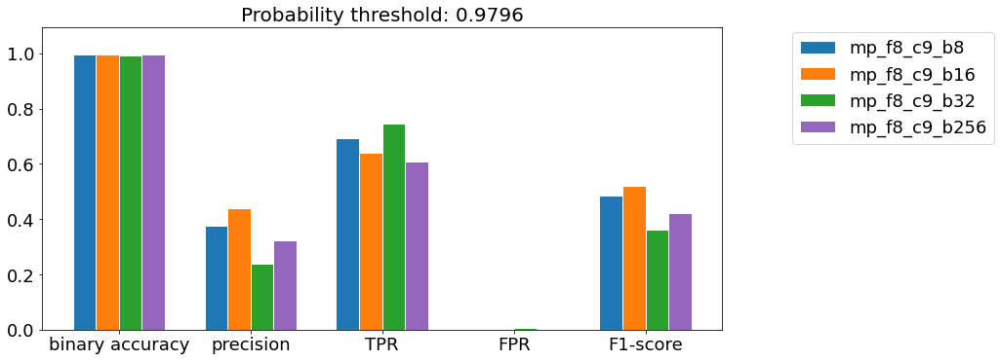

In [42]:
ax = plotting.plot_metrics_comparison(metricsAtMaxThreshold, xscale=2.5, yscale=1.1)
ax.set_title('Probability threshold: %.4f'%thresholds[-2], size=20)
plt.show()

### ROC and Precision-Recall curves


Fraction of positives
{'mp_f8_c9_b8': 0.0032943890545819258, 'mp_f8_c9_b16': 0.003128216717694257, 'mp_f8_c9_b32': 0.0032648447397592905, 'mp_f8_c9_b256': 0.003218532252956081}


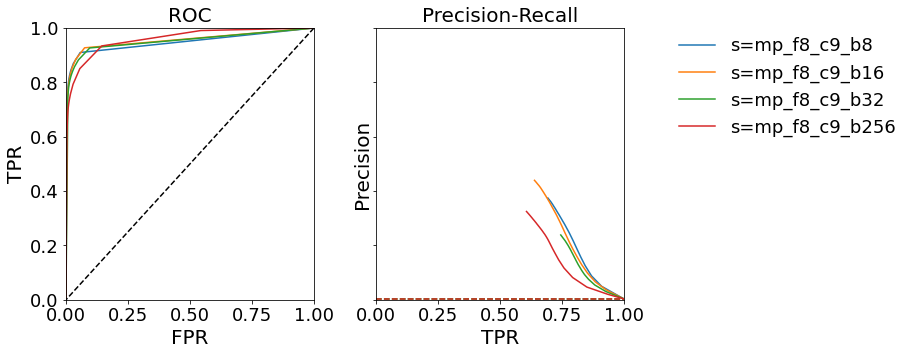

In [43]:
plotting.plot_performance_curves(metrics, output_test, colors=colors)
plt.show()

### Precision-Recall AUC

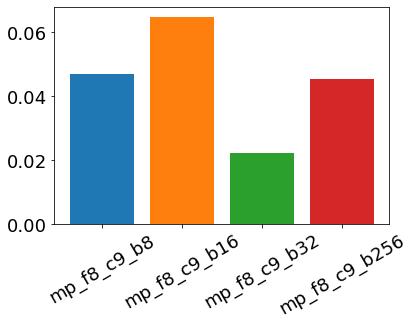

In [44]:
AUC = evaluation.get_AUC(metrics)
xticks = range(len(AUC))

fig, ax = plt.subplots()
ax.bar(xticks, list(AUC.values()), color=colors)
ax.set_xticks(xticks)
ax.set_xticklabels(list(AUC.keys()), rotation=30)
plt.show()

### Labels binary overlap

In [45]:
fissionStats = {}
for model_name in labels_test:
  print('\nModel name:', model_name)
  fissionStats[model_name] = evaluation.fissionStatsStack(labels_test[model_name], pred_labels_test[model_name])


Model name: mp_f8_c9_b8


100%|████████████████████████████████████████████████████████| 7400/7400 [00:03<00:00, 2429.23it/s]



Model name: mp_f8_c9_b16


100%|████████████████████████████████████████████████████████| 7400/7400 [00:02<00:00, 2541.96it/s]



Model name: mp_f8_c9_b32


100%|████████████████████████████████████████████████████████| 7400/7400 [00:03<00:00, 2461.58it/s]



Model name: mp_f8_c9_b256


100%|████████████████████████████████████████████████████████| 7400/7400 [00:02<00:00, 2486.40it/s]


In [46]:
fissionStats = pd.DataFrame(fissionStats, index=['TP', 'FP', 'FN', 'TP_px', 'FP_px', 'FN_px']).T
fissionStats['precision'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FP'])
fissionStats['TPR'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FN'])
fissionStats['FDR'] = fissionStats['FP']/(fissionStats['TP']+fissionStats['FP'])

fissionStats['precision_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])
fissionStats['TPR_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FN_px'])
fissionStats['FDR_px'] = fissionStats['FP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])

fissionStats = fissionStats.T

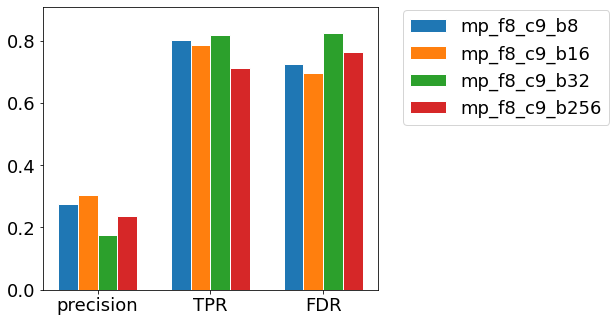

In [47]:
plotting.plot_metrics_comparison(fissionStats.loc[['precision', 'TPR', 'FDR']], xscale=2, color=colors)
plt.show()

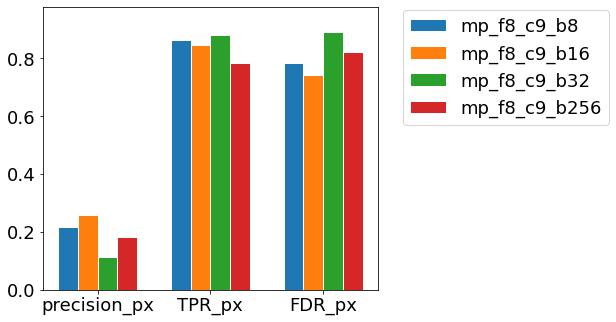

In [48]:
plotting.plot_metrics_comparison(fissionStats.loc[['precision_px', 'TPR_px', 'FDR_px']], xscale=2, color=colors)
plt.show()

### Detection match

In [49]:
det_match = [evaluation.detection_match(output_test[model_name], pred_output_test[model_name], otsu_threshold[model_name]) for model_name in folder_name]

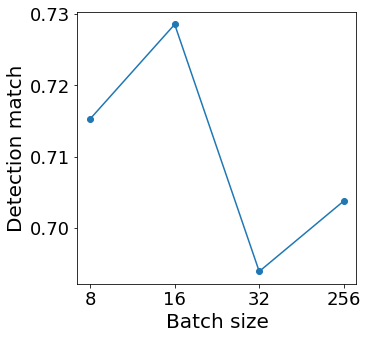

In [50]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.plot(det_match, 'o-')
ax.set_xticks(range(len(det_match)))
ax.set_xticklabels([8, 16, 32, 256])
ax.set(xlabel='Batch size', ylabel='Detection match')
plt.show(9)

## MitoProc vs Mito, batch_size=16

In [51]:
#Inputs
input_data = util.load_h5(data_path, 'Mito')
print('Inputs'+':', input_data.shape)

#Outputs
output_data = util.load_h5(data_path, 'Proc')
print('Outputs:', output_data.shape)

labels = util.load_h5(data_path, 'labels')
print('Labels:', labels.shape)


Loading H:/Santi/Data/Mito.h5
Converting to array
Inputs: (37000, 128, 128)

Loading H:/Santi/Data/Proc.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/labels.h5
Converting to array
Labels: (37000, 128, 128)


In [52]:
batch_size = 16
folder_name = ['ref_f8_c9_b%i'%batch_size, 'mp_f8_c9_b%i'%batch_size]
nb_models = len(folder_name)

model = util.load_model(model_path, ['model']*nb_models, folder_name, as_type=dict)
history = util.load_pkl(model_path, ['history']*nb_models, folder_name, as_type=dict)
frames_test = util.load_pkl(model_path, ['frames_test']*nb_models, folder_name, as_type=dict)


Loading H:/Santi/Models/ref_f8_c9_b16/model.h5

Loading H:/Santi/Models/mp_f8_c9_b16/model.h5
Done.

Loading H:/Santi/Models/ref_f8_c9_b16/history

Loading H:/Santi/Models/mp_f8_c9_b16/history
Done.

Loading H:/Santi/Models/ref_f8_c9_b16/frames_test

Loading H:/Santi/Models/mp_f8_c9_b16/frames_test
Done.


In [53]:
input_test, output_test, pred_output_test = {}, {}, {}
labels_test, pred_labels_test = {}, {}
otsu_threshold = {}

for model_name in tqdm(model, total=len(model)):
  print('\nModel: %s'%model_name)
  input_test[model_name] = input_data[frames_test[model_name]]
  output_test[model_name] = output_data[frames_test[model_name]]
  labels_test[model_name] = labels[frames_test[model_name]]

  pred_output_test[model_name] = evaluation.predict(input_test[model_name], model[model_name])
  otsu_threshold[model_name] = filters.threshold_otsu(pred_output_test[model_name])
  pred_labels_test[model_name] = evaluation.label(pred_output_test[model_name], threshold=otsu_threshold[model_name]) 

del output_data, labels, input_data

  0%|                                                                        | 0/2 [00:00<?, ?it/s]


Model: ref_f8_c9_b16


 50%|████████████████████████████████                                | 1/2 [00:06<00:06,  6.69s/it]


Model: mp_f8_c9_b16


100%|████████████████████████████████████████████████████████████████| 2/2 [00:13<00:00,  6.72s/it]


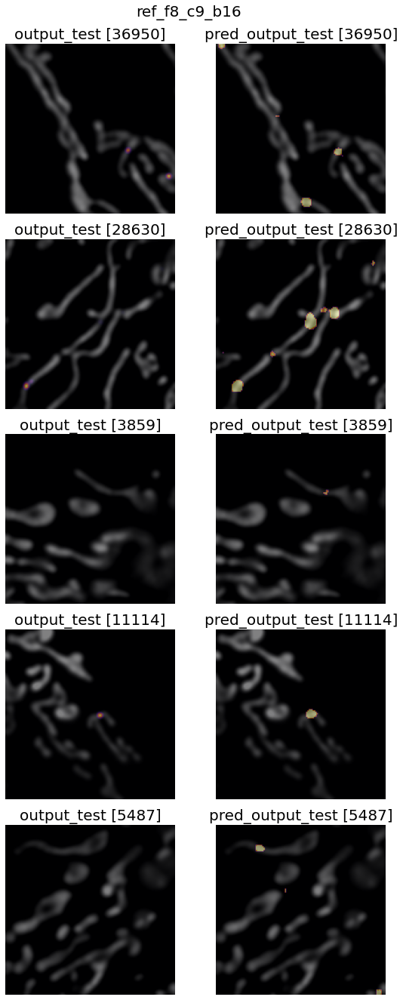

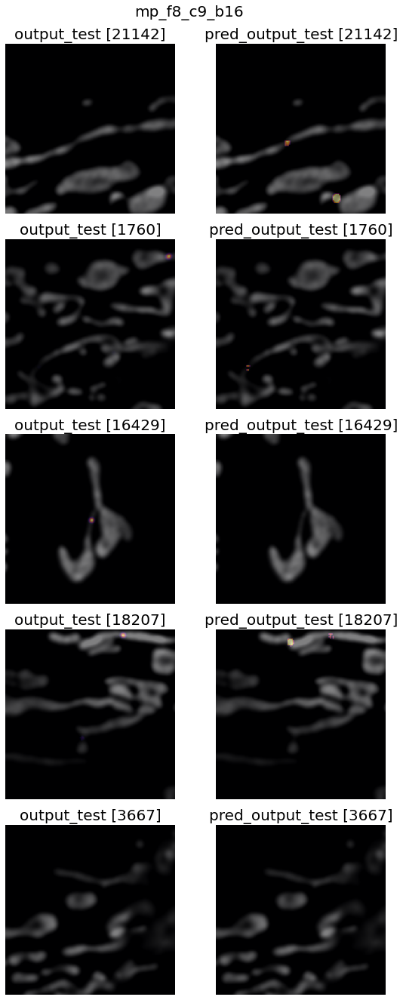

In [54]:
for model_name in folder_name:
  mask = pred_output_test[model_name]>otsu_threshold[model_name]
  plotting.plot_outputs(input_test[model_name], output_test[model_name], 
                        pred_output_test[model_name]*mask, frames_test[model_name], 
                        nb_examples=5, title=model_name, cmap=['gray', 'inferno'])
  plt.show()
  print('\n')

In [55]:
thresholds = np.linspace(0, 1, 50, endpoint=True)
metrics = util.load_pkl(model_path, ['metrics']*len(folder_name), folder_name, as_type=dict)


Loading H:/Santi/Models/ref_f8_c9_b16/metrics

Loading H:/Santi/Models/mp_f8_c9_b16/metrics
Done.


### All metrics

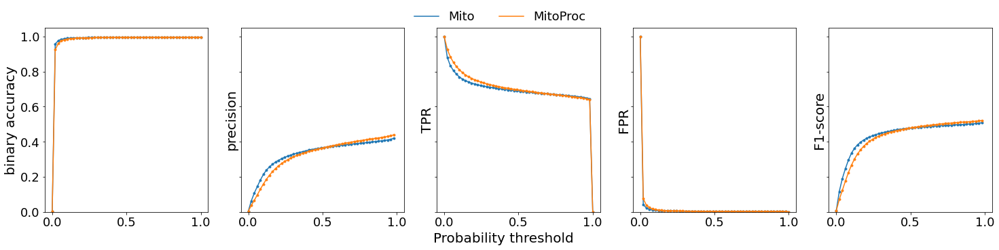

In [56]:
nb_metrics = len(metrics[folder_name[0]])
colors = plt.cm.get_cmap('tab10')(range(nb_metrics))

fig, axes = plt.subplots(1, nb_metrics, figsize=(5*nb_metrics, 5), sharex=True, sharey=True)

for model_name, color in zip(folder_name, colors):
  for metric_name, ax in zip(metrics[model_name], axes):
    ax.plot(thresholds, metrics[model_name][metric_name], 'o-', markersize=3, color=color)
    ax.set_ylabel(metric_name)
    ax.set_ylim([0, 1.05])
fig.text(0.5, 0, 'Probability threshold', fontsize=20, ha='center')
fig.legend([plt.plot([], color=color)[0] for color in colors], ['Mito', 'MitoProc'],
           loc='upper center', ncol=4, framealpha=0)

plt.show()

### metricAtMaxThreshold

In [57]:
metricsAtMaxThreshold = pd.DataFrame({model_name: {metric_name: metrics[model_name][metric_name][-2]  for metric_name in metrics[model_name]} \
                                      for model_name in folder_name})
metricsAtMaxThreshold

,ref_f8_c9_b16,mp_f8_c9_b16
binary accuracy,0.996018,0.996322
precision,0.419817,0.439567
TPR,0.645070,0.639223
FPR,0.002857,0.002557
F1-score,0.508620,0.520919


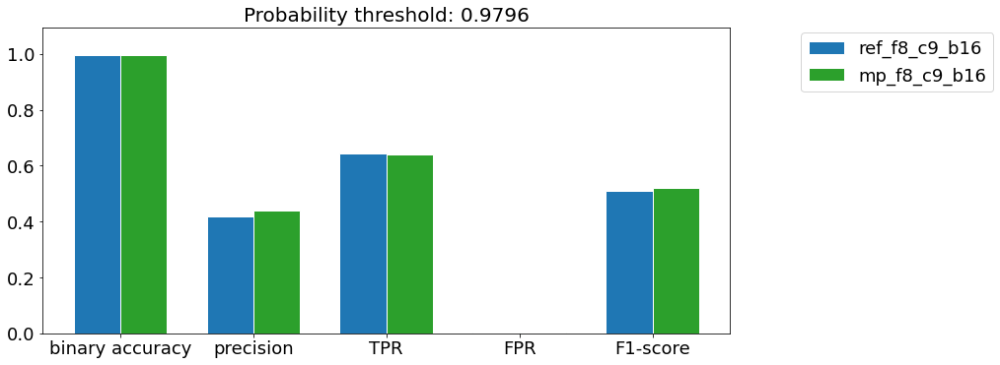

In [58]:
ax = plotting.plot_metrics_comparison(metricsAtMaxThreshold, xscale=2.5, yscale=1.1)
ax.set_title('Probability threshold: %.4f'%thresholds[-2], size=20)
plt.show()

### ROC and Precision-Recall curves


Fraction of positives
{'ref_f8_c9_b16': 0.0031948110219594595, 'mp_f8_c9_b16': 0.003128216717694257}


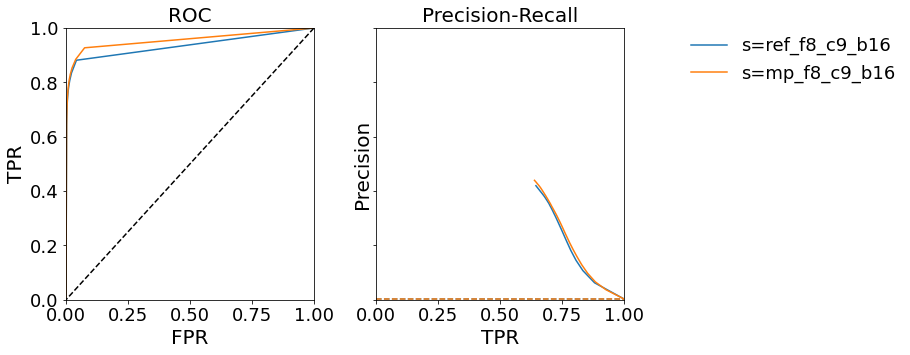

In [59]:
plotting.plot_performance_curves(metrics, output_test, colors=colors)
plt.show()

### Precision-Recall AUC

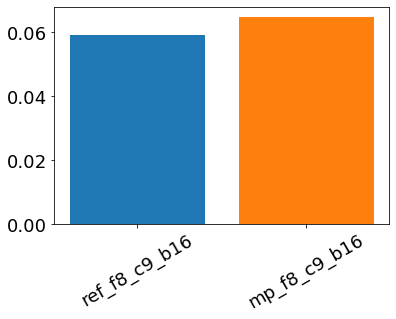

In [60]:
AUC = evaluation.get_AUC(metrics)
xticks = range(len(AUC))

fig, ax = plt.subplots()
ax.bar(xticks, list(AUC.values()), color=colors)
ax.set_xticks(xticks)
ax.set_xticklabels(list(AUC.keys()), rotation=30)
plt.show()

### Labels binary overlap

In [61]:
fissionStats = {}
for model_name in labels_test:
  print('\nModel name:', model_name)
  fissionStats[model_name] = evaluation.fissionStatsStack(labels_test[model_name], pred_labels_test[model_name])


Model name: ref_f8_c9_b16


100%|████████████████████████████████████████████████████████| 7400/7400 [00:02<00:00, 2570.26it/s]



Model name: mp_f8_c9_b16


100%|████████████████████████████████████████████████████████| 7400/7400 [00:02<00:00, 2863.91it/s]


In [62]:
fissionStats = pd.DataFrame(fissionStats, index=['TP', 'FP', 'FN', 'TP_px', 'FP_px', 'FN_px']).T
fissionStats['precision'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FP'])
fissionStats['TPR'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FN'])
fissionStats['FDR'] = fissionStats['FP']/(fissionStats['TP']+fissionStats['FP'])

fissionStats['precision_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])
fissionStats['TPR_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FN_px'])
fissionStats['FDR_px'] = fissionStats['FP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])

fissionStats = fissionStats.T

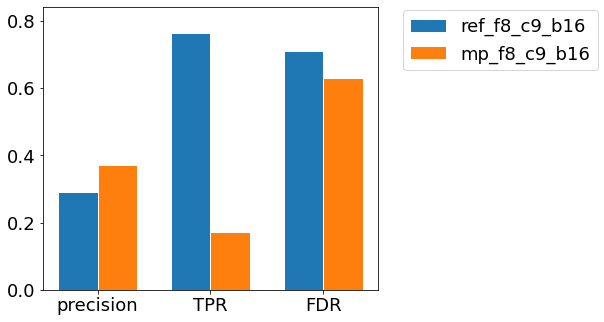

In [63]:
plotting.plot_metrics_comparison(fissionStats.loc[['precision', 'TPR', 'FDR']], xscale=2, color=colors)
plt.show()

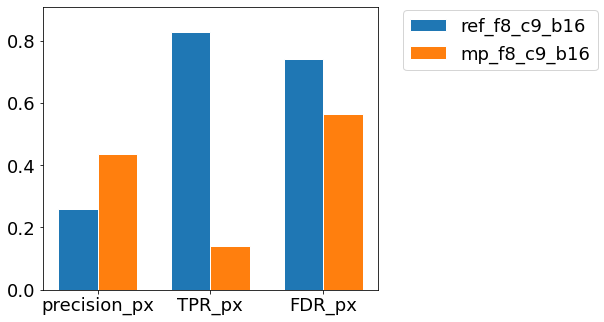

In [64]:
plotting.plot_metrics_comparison(fissionStats.loc[['precision_px', 'TPR_px', 'FDR_px']], xscale=2, color=colors)
plt.show()

### Detection match

In [65]:
det_match = [evaluation.detection_match(output_test[model_name], pred_output_test[model_name], otsu_threshold[model_name]) for model_name in folder_name]

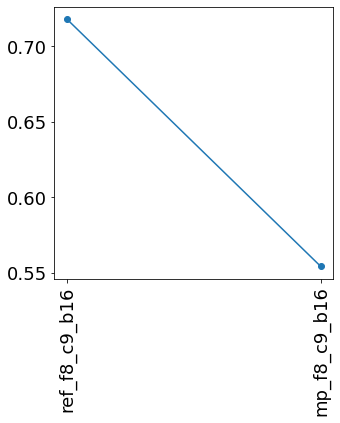

In [66]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.plot(det_match, 'o-')
ax.set_xticks(range(len(det_match)))
ax.set_xticklabels(folder_name, rotation=90)
plt.show(9)

## Mito & WatProc, different spot sizes

### Mode: same

Precision-Recall AUC is 10 times bigger after dilating fissions with a disk-shaped gaussian kernel. The highest mean intensity threshold of 22.2 had the best performance.

In [79]:
#Inputs
input_data = util.load_h5(data_path, 'Mito')
print('Inputs'+':', input_data.shape)

optimal_sigma = util.load_pkl(data_path, 'optimal_sigma')
threshold = util.load_pkl(data_path, 'mean_intensity_threshold')
nb_sigmas = optimal_sigma.shape[0]


Loading H:/Santi/Data/Mito.h5
Converting to array
Inputs: (37000, 128, 128)

Loading H:/Santi/Data/optimal_sigma

Loading H:/Santi/Data/mean_intensity_threshold


In [80]:
#Outputs
folder_name = util.get_filename(model_path, 'wp_f8')
excluded_models = ['mp', 'aug', 'mwp']
folder_name = [model_name for model_name in folder_name if all(keyword not in model_name for keyword in excluded_models)] 
nb_models = len(folder_name)

model = util.load_model(model_path, ['model']*nb_models, folder_name, as_type=dict)
history = util.load_pkl(model_path, ['history']*nb_models, folder_name, as_type=dict)
frames_test = util.load_pkl(model_path, ['frames_test']*nb_models, folder_name, as_type=dict)


Loading H:/Santi/Models/wp_f8_c9_b16_s1.9_t3.5/model.h5

Loading H:/Santi/Models/wp_f8_c9_b16_s2.1_t11.3/model.h5

Loading H:/Santi/Models/wp_f8_c9_b16_s2.2_t16.0/model.h5

Loading H:/Santi/Models/wp_f8_c9_b16_s2.2_t19.1/model.h5

Loading H:/Santi/Models/wp_f8_c9_b16_s2.2_t22.2/model.h5

Loading H:/Santi/Models/wp_f8_c9_b16_s2.4_t34.6/model.h5

Loading H:/Santi/Models/wp_f8_c9_b16_s2.7_t50.1/model.h5
Done.

Loading H:/Santi/Models/wp_f8_c9_b16_s1.9_t3.5/history

Loading H:/Santi/Models/wp_f8_c9_b16_s2.1_t11.3/history

Loading H:/Santi/Models/wp_f8_c9_b16_s2.2_t16.0/history

Loading H:/Santi/Models/wp_f8_c9_b16_s2.2_t19.1/history

Loading H:/Santi/Models/wp_f8_c9_b16_s2.2_t22.2/history

Loading H:/Santi/Models/wp_f8_c9_b16_s2.4_t34.6/history

Loading H:/Santi/Models/wp_f8_c9_b16_s2.7_t50.1/history
Done.

Loading H:/Santi/Models/wp_f8_c9_b16_s1.9_t3.5/frames_test

Loading H:/Santi/Models/wp_f8_c9_b16_s2.1_t11.3/frames_test

Loading H:/Santi/Models/wp_f8_c9_b16_s2.2_t16.0/frames_test

Lo

In [81]:
input_test, output_test, pred_output_test = {}, {}, {}
labels_test, pred_labels_test = {}, {}
otsu_threshold = {}

for model_name, s, t in zip(folder_name, optimal_sigma, threshold):
  print('\nModel: %s'%model_name)
  #Outputs
  output_data = util.load_h5(data_path, 'WatProc_s%.1f_t%.1f'%(s, t))
  print('Outputs:', output_data.shape)
  output_test[model_name] = output_data[frames_test[model_name]]
  del output_data

  #Labels
  labels = util.load_h5(data_path, 'proc_labels_s%.1f_t%.1f'%(s, t))
  print('Labels:', labels.shape)
  labels_test[model_name] = labels[frames_test[model_name]]
  del labels

  input_test[model_name] = input_data[frames_test[model_name]]
  pred_output_test[model_name] = evaluation.predict(input_test[model_name], model[model_name])
  otsu_threshold[model_name] = filters.threshold_otsu(pred_output_test[model_name])
  pred_labels_test[model_name] = evaluation.label(pred_output_test[model_name], threshold=otsu_threshold[model_name]) 

del input_data


Model: wp_f8_c9_b16_s1.9_t3.5

Loading H:/Santi/Data/WatProc_s1.9_t3.5.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s1.9_t3.5.h5
Converting to array
Labels: (37000, 128, 128)

Model: wp_f8_c9_b16_s2.1_t11.3

Loading H:/Santi/Data/WatProc_s2.1_t11.3.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.1_t11.3.h5
Converting to array
Labels: (37000, 128, 128)

Model: wp_f8_c9_b16_s2.2_t16.0

Loading H:/Santi/Data/WatProc_s2.2_t16.0.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.2_t16.0.h5
Converting to array
Labels: (37000, 128, 128)

Model: wp_f8_c9_b16_s2.2_t19.1

Loading H:/Santi/Data/WatProc_s2.2_t19.1.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.2_t19.1.h5
Converting to array
Labels: (37000, 128, 128)

Model: wp_f8_c9_b16_s2.2_t22.2

Loading H:/Santi/Data/WatProc_s2.2_t22.2.h5
Converting to array
Outputs: (37000, 128, 128)

Lo

H:/Santi/Figures/wp_examples.pdf


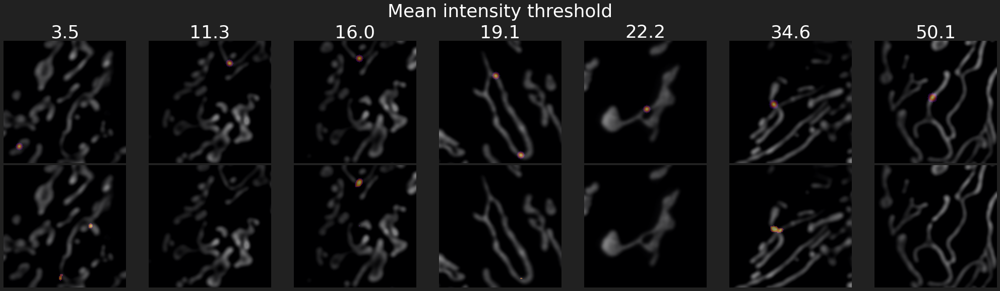

In [84]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'wp_examples'
filename = base_dir+'Figures/'+title+'.pdf'
print(filename)

title_size = 36

fig, axes = plt.subplots(2, nb_models, figsize=(4*nb_models, 8))
fig.suptitle('Mean intensity threshold', size=title_size, color='white')

fig.set_facecolor(facecolor)

for model_name, i in zip(folder_name, range(nb_models)):
  frame = np.random.choice(np.where(np.any(np.any(output_test[model_name]>0, axis=-1), axis=-1))[0])
  mask = pred_output_test[model_name][frame]>otsu_threshold[model_name]
  plotting.plot_merge(input_test[model_name][frame], output_test[model_name][frame], title='', ax=axes[0, i])
  plotting.plot_merge(input_test[model_name][frame], pred_output_test[model_name][frame]*mask, title='', ax=axes[1, i])
  axes[0, i].set_title(threshold[i].round(1), size=title_size, color='white')
  
fig.tight_layout(pad=0)
fig.subplots_adjust(wspace=0, hspace=0.02, top=0.85)
#plt.show()
fig.savefig(filename)

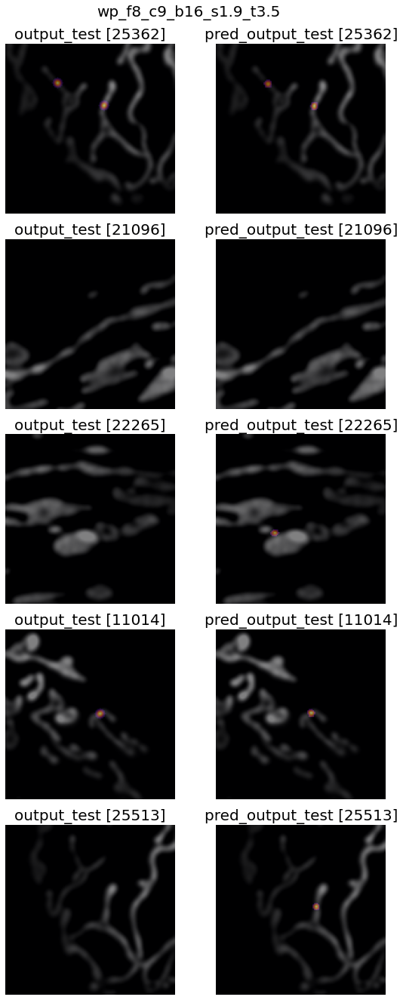

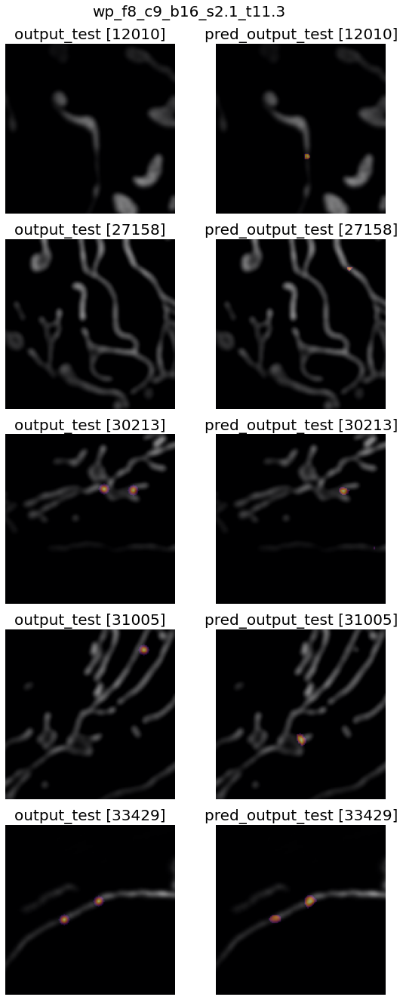

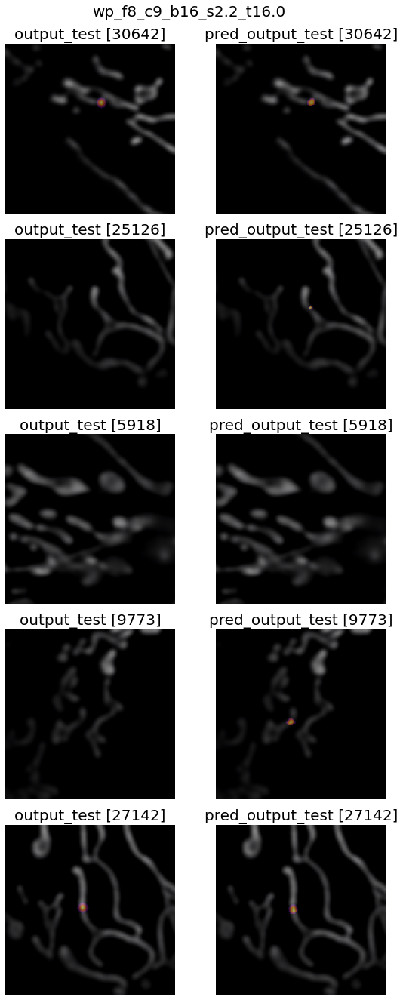

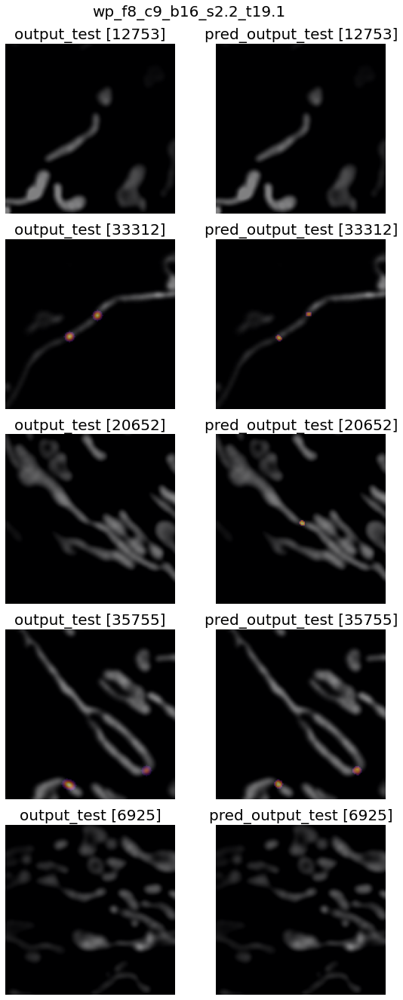

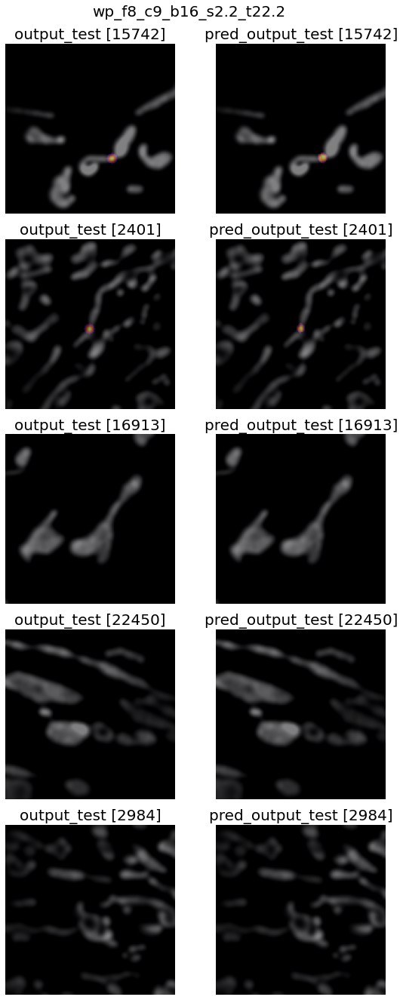

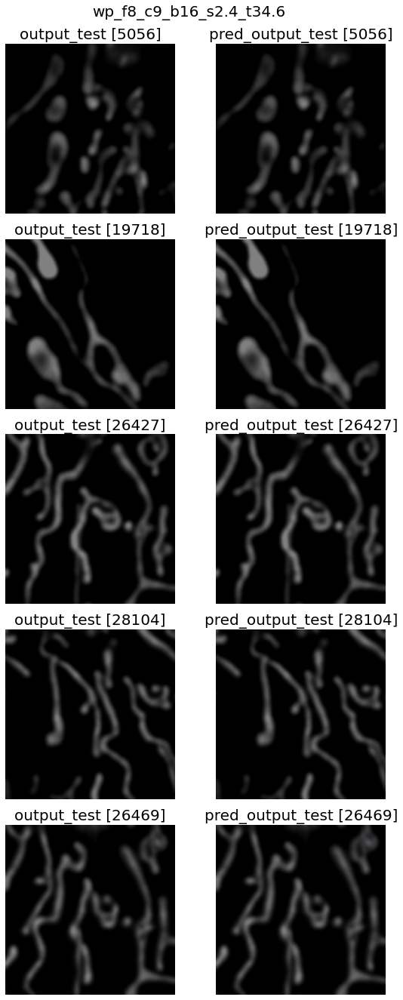

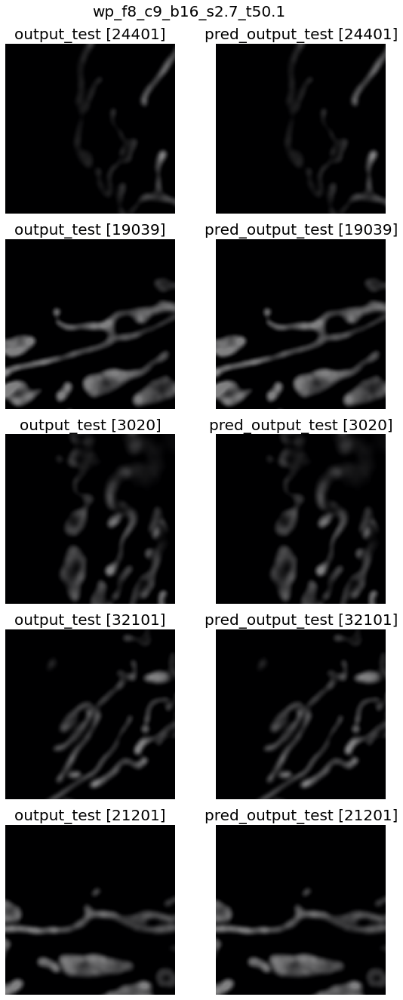

In [70]:
for model_name in folder_name:
  mask = pred_output_test[model_name]>otsu_threshold[model_name]
  plotting.plot_outputs(input_test[model_name], output_test[model_name], 
                        pred_output_test[model_name]*mask, frames_test[model_name], 
                        nb_examples=5, title=model_name, cmap=['gray', 'inferno'])
  plt.show()
  print('\n')

In [71]:
thresholds = np.linspace(0, 1, 50, endpoint=True)
metrics = util.load_pkl(model_path, ['metrics']*len(folder_name), folder_name, as_type=dict)


Loading H:/Santi/Models/wp_f8_c9_b16_s1.9_t3.5/metrics

Loading H:/Santi/Models/wp_f8_c9_b16_s2.1_t11.3/metrics

Loading H:/Santi/Models/wp_f8_c9_b16_s2.2_t16.0/metrics

Loading H:/Santi/Models/wp_f8_c9_b16_s2.2_t19.1/metrics

Loading H:/Santi/Models/wp_f8_c9_b16_s2.2_t22.2/metrics

Loading H:/Santi/Models/wp_f8_c9_b16_s2.4_t34.6/metrics

Loading H:/Santi/Models/wp_f8_c9_b16_s2.7_t50.1/metrics
Done.


#### All metrics

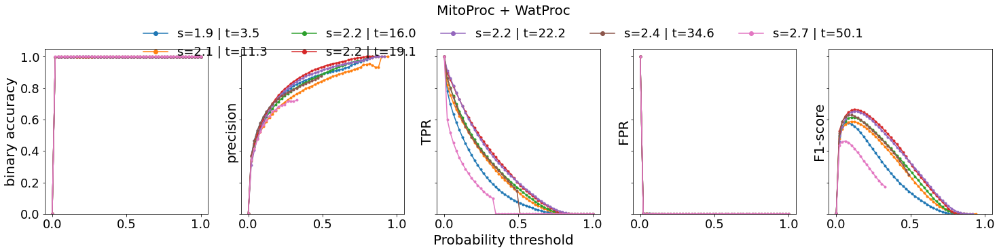

In [72]:
nb_models = len(metrics)
nb_metrics = len(metrics[folder_name[0]])
colors = plt.cm.get_cmap('tab10')(range(nb_models))

fig, axes = plt.subplots(1, nb_metrics, figsize=(5*nb_metrics, 5), sharex=True, sharey=True)
fig.suptitle('MitoProc + WatProc', size=20, va='top')
for model_name, color in zip(folder_name, colors):
  for metric_name, ax in zip(metrics[model_name], axes):
    ax.plot(thresholds, metrics[model_name][metric_name], 'o-', markersize=3, color=color)
    ax.set_ylabel(metric_name)
    ax.set_ylim([0, 1.05])
fig.text(0.5, 0, 'Probability threshold', fontsize=20, ha='center')
fig.legend([plt.plot([], 'o-', color=color)[0] for color in colors], ['s=%.1f | t=%.1f'%(s, t) for s, t in zip(optimal_sigma, threshold)],
           loc='upper center', bbox_to_anchor=(0.5, 0.93), ncol=5, framealpha=0)
fig.subplots_adjust(top=0.8)
plt.show()

#### metricAtMaxF1

In [73]:
metricsAtMaxThreshold = pd.DataFrame({model_name: {metric_name: metrics[model_name][metric_name][metrics[model_name]['F1-score']==np.nanmax(metrics[model_name]['F1-score'])][0]  for metric_name in metrics[model_name]} \
                                      for model_name in folder_name})
metricsAtMaxThreshold

,wp_f8_c9_b16_s1.9_t3.5,wp_f8_c9_b16_s2.1_t11.3,wp_f8_c9_b16_s2.2_t16.0,wp_f8_c9_b16_s2.2_t19.1,wp_f8_c9_b16_s2.2_t22.2,wp_f8_c9_b16_s2.4_t34.6,wp_f8_c9_b16_s2.7_t50.1
binary accuracy,0.997765,0.998642,0.999016,0.999312,0.999396,0.999654,0.999974
precision,0.577389,0.555876,0.580738,0.639982,0.624166,0.578411,0.472889
TPR,0.581862,0.623002,0.652996,0.688096,0.684617,0.687120,0.452843
FPR,0.001131,0.000774,0.000568,0.000381,0.000342,0.000213,0.000013
F1-score,0.579617,0.587528,0.614751,0.663167,0.652996,0.628097,0.462649


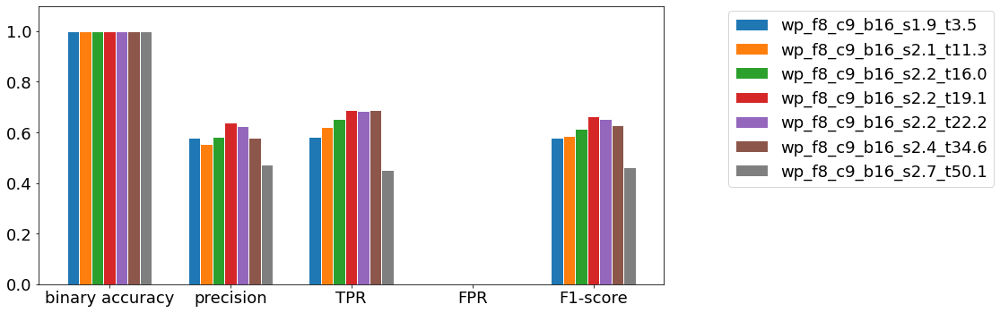

In [74]:
ax = plotting.plot_metrics_comparison(metricsAtMaxThreshold, xscale=2.5, yscale=1.1)
plt.show()

#### ROC and Precision-Recall curves


Fraction of positives
{'wp_f8_c9_b16_s1.9_t3.5': 0.002648150469805743, 'wp_f8_c9_b16_s2.1_t11.3': 0.0015525116791596284, 'wp_f8_c9_b16_s2.2_t16.0': 0.0012026235219594595, 'wp_f8_c9_b16_s2.2_t19.1': 0.0009844063423775338, 'wp_f8_c9_b16_s2.2_t22.2': 0.0008299956450591216, 'wp_f8_c9_b16_s2.4_t34.6': 0.0004250273833403716, 'wp_f8_c9_b16_s2.7_t50.1': 2.509864600929054e-05}


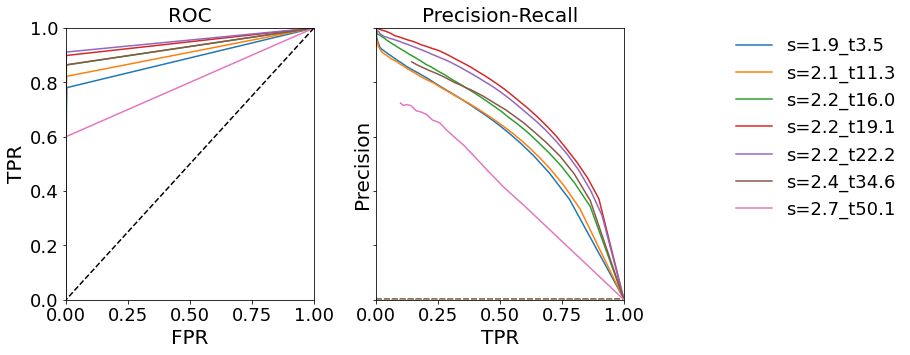

In [75]:
plotting.plot_performance_curves(metrics, output_test, colors=colors)
plt.show()

#### Precision-Recall AUC

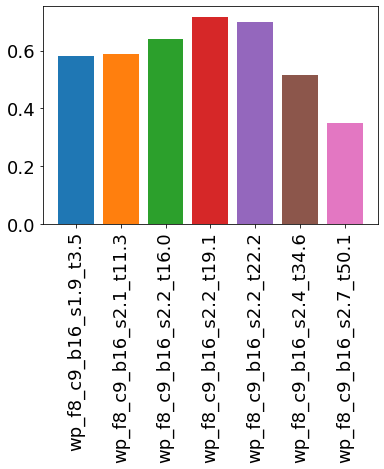

In [76]:
AUC = evaluation.get_AUC(metrics)
xticks = range(len(AUC))

fig, ax = plt.subplots()
ax.bar(xticks, list(AUC.values()), color=colors)
ax.set_xticks(xticks)
ax.set_xticklabels(list(AUC.keys()), rotation=90)
plt.show()

#### Labels binary overlap

In [30]:
folder_name = util.get_filename(model_path, 'wp_f8')
excluded_models = ['mp', 'aug', 'mean_wp']
folder_name = [model_name for model_name in folder_name if all(keyword not in model_name for keyword in excluded_models)] 
nb_models = len(folder_name)

colors = plt.cm.get_cmap('tab10')(range(nb_models))

In [77]:
fissionStats = util.load_pkl(model_path, 'wp_fissionStats')


Loading H:/Santi/Models/wp_fissionStats


H:/Santi/Figures/wp_fissionStats.png


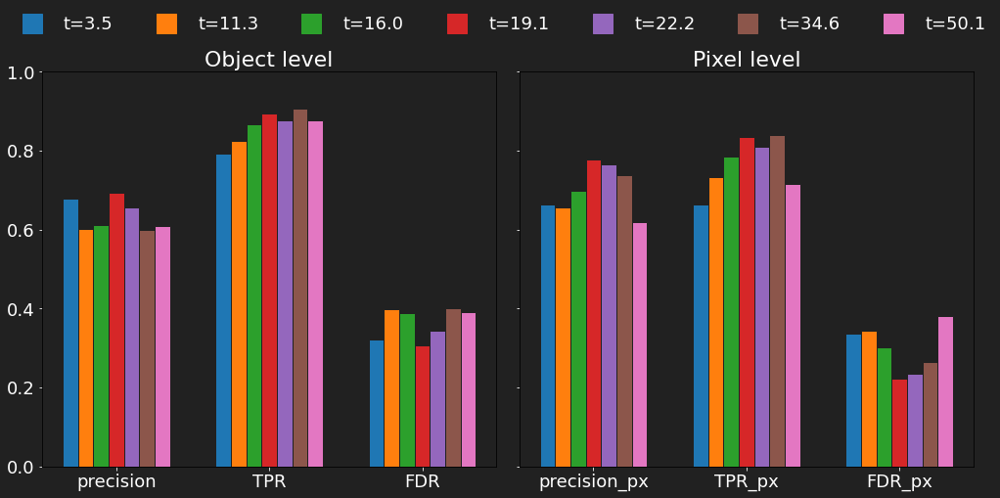

In [79]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'wp_fissionStats'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

colors = plt.cm.get_cmap('tab10')(range(nb_models))
fig, axes = plt.subplots(1, 2, figsize=(7*2, 7), sharey=True)

fig.set_facecolor(facecolor)  

plotting.plot_metrics_comparison(fissionStats.loc[['precision', 'TPR', 'FDR']], xscale=2, color=colors, ax=axes[0], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)  
plotting.plot_metrics_comparison(fissionStats.loc[['precision_px', 'TPR_px', 'FDR_px']], xscale=2, color=colors, ax=axes[1], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)

for ax, title in zip(axes, ['Object level', 'Pixel level']):
  ax.set_title(title, size=22, color='white')
  ax.set_facecolor(facecolor)
  ax.tick_params(axis='x', colors='white')
  ax.tick_params(axis='y', colors='white')

legend = fig.legend([plt.plot([], marker='s', ls='none', markersize=20, color=color)[0] for color in colors], ['t='+model_name.split('_t')[-1] for model_name in folder_name],
                    loc='upper center', facecolor=facecolor, labelcolor='white', framealpha=1, ncol=nb_models)
frame = legend.get_frame()
frame.set_color(facecolor)

plt.tight_layout(pad=0)
fig.subplots_adjust(wspace=0.05, top=0.85, right=0.98)

plt.show()
#fig.savefig(filename)

In [44]:
fissionStats

,wp_f8_c9_b16_s1.9_t3.5,wp_f8_c9_b16_s2.1_t11.3,wp_f8_c9_b16_s2.2_t16.0,wp_f8_c9_b16_s2.2_t19.1,wp_f8_c9_b16_s2.2_t22.2,wp_f8_c9_b16_s2.4_t34.6,wp_f8_c9_b16_s2.7_t50.1
TP,5357.000000,3263.000000,2640.000000,2223.000000,1831.000000,596.000000,36.000000
FP,2529.000000,2152.000000,1683.000000,978.000000,955.000000,397.000000,23.000000
FN,1397.000000,691.000000,404.000000,262.000000,256.000000,61.000000,5.000000
TP_px,132105.000000,89347.000000,69775.000000,64324.000000,52739.000000,25586.000000,1021.000000
FP_px,66725.000000,46748.000000,30262.000000,18334.000000,16127.000000,9132.000000,626.000000
FN_px,66896.000000,32641.000000,19230.000000,12617.000000,12366.000000,4880.000000,405.000000
precision,0.679305,0.602585,0.610687,0.694470,0.657215,0.600201,0.610169
TPR,0.793160,0.825240,0.867280,0.894567,0.877336,0.907154,0.878049
FDR,0.320695,0.397415,0.389313,0.305530,0.342785,0.399799,0.389831
precision_px,0.664412,0.656505,0.697492,0.778194,0.765821,0.736966,0.619915


#### Detection match

In [31]:
det_match = util.load_pkl(model_path, 'wp_det_match')


Loading H:/Santi/Models/wp_det_match


H:/Santi/Figures/wp_det_match.png


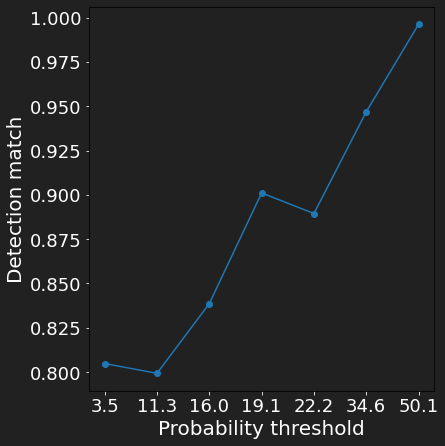

In [32]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'wp_det_match'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

fig, ax = plt.subplots(figsize=(6, 6))
fig.set_facecolor(facecolor)
ax.set_facecolor(facecolor)

ax.plot(det_match, 'o-')
ax.set_xticks(range(len(det_match)))
ax.set_xticklabels([model_name.split('_t')[-1] for model_name in folder_name])
ax.set_xlabel('Probability threshold', color='white')
ax.set_ylabel('Detection match', color='white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

plt.tight_layout(pad=0)
#plt.show()
fig.savefig(filename)

### Mode: mean

Precision-Recall AUC is 10 times bigger after dilating fissions with a disk-shaped gaussian kernel. The highest mean intensity threshold of 22.2 had the best performance.

In [89]:
#Inputs
input_data = util.load_h5(data_path, 'Mito')
print('Inputs'+':', input_data.shape)

optimal_sigma = util.load_pkl(data_path, 'optimal_sigma')
threshold = util.load_pkl(data_path, 'mean_intensity_threshold')
nb_sigmas = optimal_sigma.shape[0]


Loading H:/Santi/Data/Mito.h5
Converting to array
Inputs: (37000, 128, 128)

Loading H:/Santi/Data/optimal_sigma

Loading H:/Santi/Data/mean_intensity_threshold


In [90]:
#Outputs
folder_name = util.get_filename(model_path, 'mean_wp')
nb_models = len(folder_name)

model = util.load_model(model_path, ['model']*nb_models, folder_name, as_type=dict)
history = util.load_pkl(model_path, ['history']*nb_models, folder_name, as_type=dict)
frames_test = util.load_pkl(model_path, ['frames_test']*nb_models, folder_name, as_type=dict)


Loading H:/Santi/Models/mwp_f8_c9_b16_s1.9_t3.5/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.1_t11.3/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t16.0/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t19.1/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t22.2/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.4_t34.6/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.7_t50.1/model.h5
Done.

Loading H:/Santi/Models/mwp_f8_c9_b16_s1.9_t3.5/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.1_t11.3/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t16.0/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t19.1/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t22.2/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.4_t34.6/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.7_t50.1/history
Done.

Loading H:/Santi/Models/mwp_f8_c9_b16_s1.9_t3.5/frames_test

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.1_t11.3/frames_test

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t16.

In [91]:
input_test, output_test, pred_output_test = {}, {}, {}
labels_test, pred_labels_test = {}, {}
otsu_threshold = {}

for model_name, s, t in zip(folder_name, optimal_sigma, threshold):
  print('\nModel: %s'%model_name)
  #Outputs
  output_data = util.load_h5(data_path, 'mWatProc_s%.1f_t%.1f'%(s, t))
  print('Outputs:', output_data.shape)
  output_test[model_name] = output_data[frames_test[model_name]]
  del output_data

  #Labels
  labels = util.load_h5(data_path, 'proc_labels_s%.1f_t%.1f'%(s, t))
  print('Labels:', labels.shape)
  labels_test[model_name] = labels[frames_test[model_name]]
  del labels

  input_test[model_name] = input_data[frames_test[model_name]]
  pred_output_test[model_name] = evaluation.predict(input_test[model_name], model[model_name])
  otsu_threshold[model_name] = filters.threshold_otsu(pred_output_test[model_name])
  pred_labels_test[model_name] = evaluation.label(pred_output_test[model_name], threshold=otsu_threshold[model_name]) 

del input_data


Model: mwp_f8_c9_b16_s1.9_t3.5

Loading H:/Santi/Data/mWatProc_s1.9_t3.5.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s1.9_t3.5.h5
Converting to array
Labels: (37000, 128, 128)

Model: mwp_f8_c9_b16_s2.1_t11.3

Loading H:/Santi/Data/mWatProc_s2.1_t11.3.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.1_t11.3.h5
Converting to array
Labels: (37000, 128, 128)

Model: mwp_f8_c9_b16_s2.2_t16.0

Loading H:/Santi/Data/mWatProc_s2.2_t16.0.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.2_t16.0.h5
Converting to array
Labels: (37000, 128, 128)

Model: mwp_f8_c9_b16_s2.2_t19.1

Loading H:/Santi/Data/mWatProc_s2.2_t19.1.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.2_t19.1.h5
Converting to array
Labels: (37000, 128, 128)

Model: mwp_f8_c9_b16_s2.2_t22.2

Loading H:/Santi/Data/mWatProc_s2.2_t22.2.h5
Converting to array
Outputs: (37000, 128

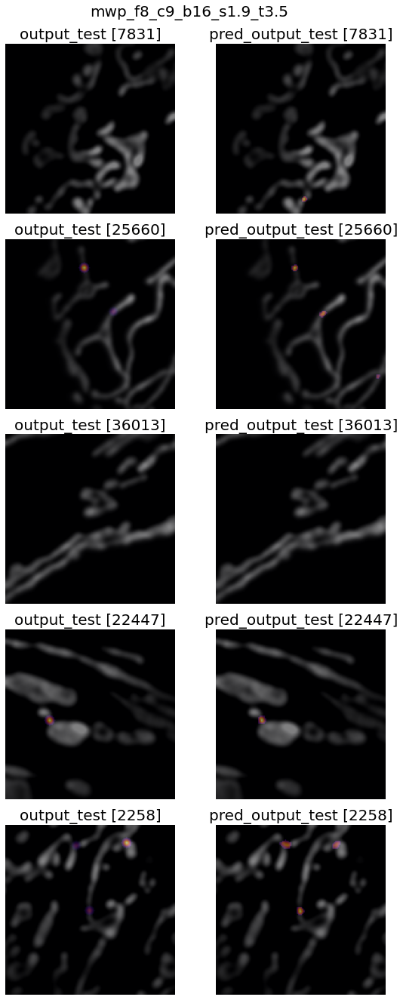

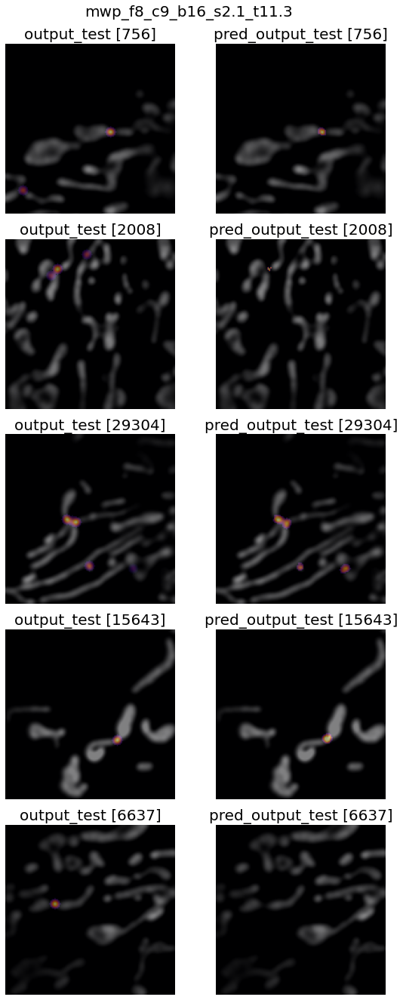

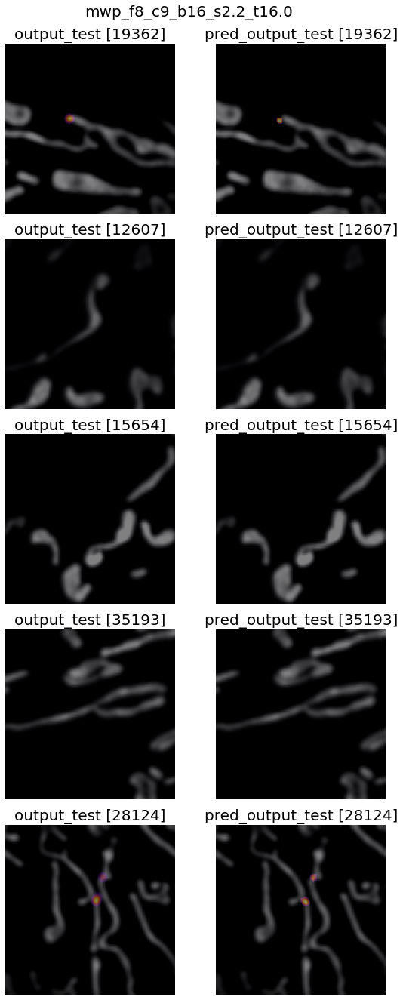

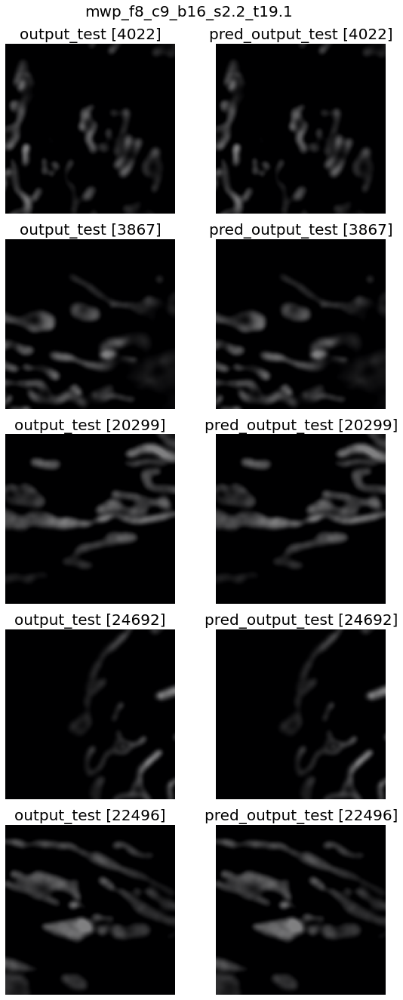

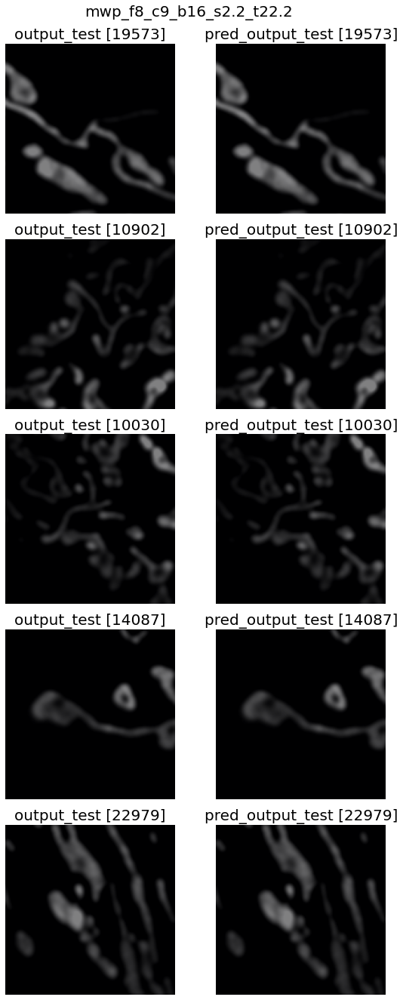

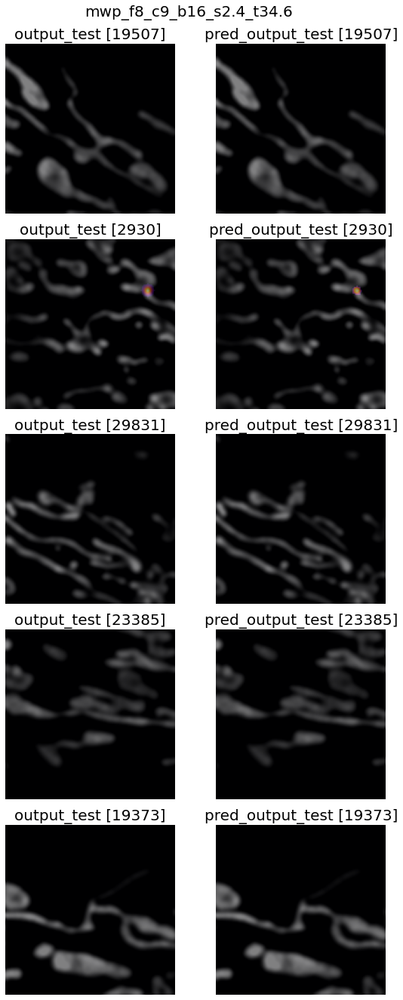

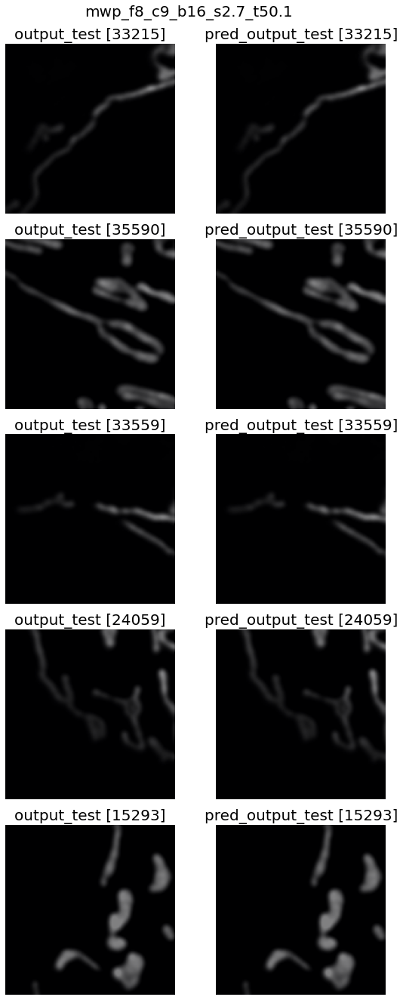

In [92]:
for model_name in folder_name:
  mask = pred_output_test[model_name]>otsu_threshold[model_name]
  plotting.plot_outputs(input_test[model_name], output_test[model_name], 
                        pred_output_test[model_name]*mask, frames_test[model_name], 
                        nb_examples=5, title=model_name, cmap=['gray', 'inferno'])
  plt.show()
  print('\n')

In [93]:
thresholds = np.linspace(0, 1, 50, endpoint=True)
metrics = util.load_pkl(model_path, ['metrics']*len(folder_name), folder_name, as_type=dict)


Loading H:/Santi/Models/mwp_f8_c9_b16_s1.9_t3.5/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.1_t11.3/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t16.0/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t19.1/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t22.2/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.4_t34.6/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.7_t50.1/metrics
Done.


#### All metrics

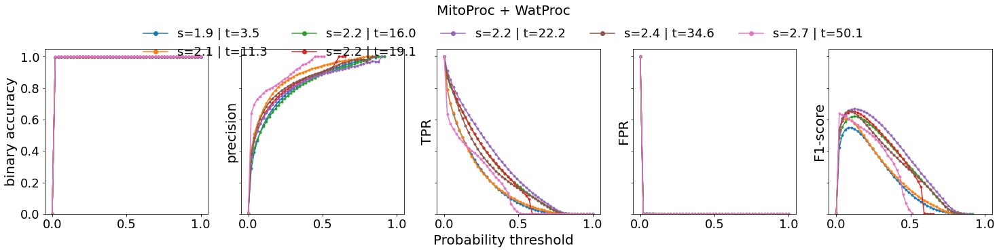

In [94]:
nb_models = len(metrics)
nb_metrics = len(metrics[folder_name[0]])
colors = plt.cm.get_cmap('tab10')(range(nb_models))

fig, axes = plt.subplots(1, nb_metrics, figsize=(5*nb_metrics, 5), sharex=True, sharey=True)
fig.suptitle('MitoProc + WatProc', size=20, va='top')
for model_name, color in zip(folder_name, colors):
  for metric_name, ax in zip(metrics[model_name], axes):
    ax.plot(thresholds, metrics[model_name][metric_name], 'o-', markersize=3, color=color)
    ax.set_ylabel(metric_name)
    ax.set_ylim([0, 1.05])
fig.text(0.5, 0, 'Probability threshold', fontsize=20, ha='center')
fig.legend([plt.plot([], 'o-', color=color)[0] for color in colors], ['s=%.1f | t=%.1f'%(s, t) for s, t in zip(optimal_sigma, threshold)],
           loc='upper center', bbox_to_anchor=(0.5, 0.93), ncol=5, framealpha=0)
fig.subplots_adjust(top=0.8)
plt.show()

#### metricAtMaxF1

In [95]:
metricsAtMaxThreshold = pd.DataFrame({model_name: {metric_name: metrics[model_name][metric_name][metrics[model_name]['F1-score']==np.nanmax(metrics[model_name]['F1-score'])][0]  for metric_name in metrics[model_name]} \
                                      for model_name in folder_name})
metricsAtMaxThreshold

,mwp_f8_c9_b16_s1.9_t3.5,mwp_f8_c9_b16_s2.1_t11.3,mwp_f8_c9_b16_s2.2_t16.0,mwp_f8_c9_b16_s2.2_t19.1,mwp_f8_c9_b16_s2.2_t22.2,mwp_f8_c9_b16_s2.4_t34.6,mwp_f8_c9_b16_s2.7_t50.1
binary accuracy,0.997449,0.998615,0.999029,0.999223,0.999412,0.999670,0.999977
precision,0.521425,0.571363,0.588866,0.617770,0.641792,0.606095,0.639587
TPR,0.578693,0.642156,0.653584,0.689904,0.695789,0.712234,0.633718
FPR,0.001427,0.000796,0.000552,0.000450,0.000330,0.000204,0.000011
F1-score,0.548569,0.604694,0.619540,0.651847,0.667701,0.654892,0.636639


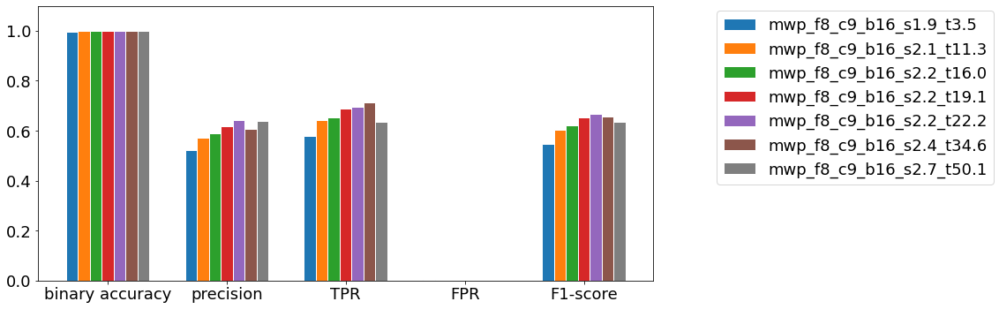

In [96]:
ax = plotting.plot_metrics_comparison(metricsAtMaxThreshold, xscale=2.5, yscale=1.1)
plt.show()

#### ROC and Precision-Recall curves


Fraction of positives
{'mwp_f8_c9_b16_s1.9_t3.5': 0.002678882495777027, 'mwp_f8_c9_b16_s2.1_t11.3': 0.0016491864178631757, 'mwp_f8_c9_b16_s2.2_t16.0': 0.0012090239653716217, 'mwp_f8_c9_b16_s2.2_t19.1': 0.0010538462046030404, 'mwp_f8_c9_b16_s2.2_t22.2': 0.0008497413429054055, 'mwp_f8_c9_b16_s2.4_t34.6': 0.0004399067646748311, 'mwp_f8_c9_b16_s2.7_t50.1': 3.145784945101351e-05}


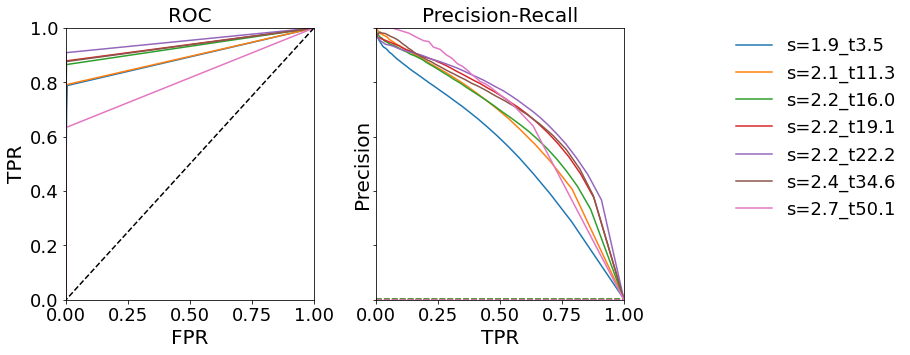

In [97]:
plotting.plot_performance_curves(metrics, output_test, colors=colors)
plt.show()

#### Precision-Recall AUC

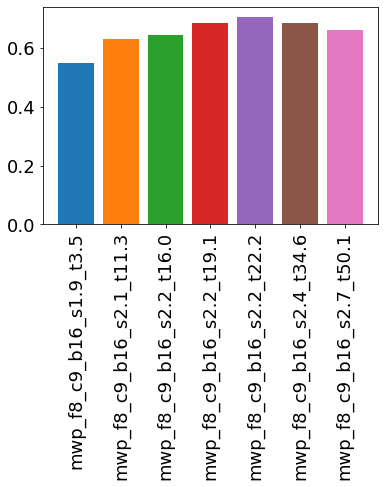

In [98]:
AUC = evaluation.get_AUC(metrics)
xticks = range(len(AUC))

fig, ax = plt.subplots()
ax.bar(xticks, list(AUC.values()), color=colors)
ax.set_xticks(xticks)
ax.set_xticklabels(list(AUC.keys()), rotation=90)
plt.show()

#### Labels binary overlap

In [99]:
fissionStats = {}
for model_name in labels_test:
  print('\nModel name:', model_name)
  fissionStats[model_name] = evaluation.fissionStatsStack(labels_test[model_name], pred_labels_test[model_name])


Model name: mwp_f8_c9_b16_s1.9_t3.5


100%|████████████████████████████████████████████████████████| 7400/7400 [00:02<00:00, 3133.33it/s]



Model name: mwp_f8_c9_b16_s2.1_t11.3


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 4309.19it/s]



Model name: mwp_f8_c9_b16_s2.2_t16.0


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 4996.38it/s]



Model name: mwp_f8_c9_b16_s2.2_t19.1


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 5572.43it/s]



Model name: mwp_f8_c9_b16_s2.2_t22.2


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 6198.34it/s]



Model name: mwp_f8_c9_b16_s2.4_t34.6


100%|███████████████████████████████████████████████████████| 7400/7400 [00:00<00:00, 10213.28it/s]



Model name: mwp_f8_c9_b16_s2.7_t50.1


100%|███████████████████████████████████████████████████████| 7400/7400 [00:00<00:00, 15279.35it/s]


In [100]:
fissionStats = pd.DataFrame(fissionStats, index=['TP', 'FP', 'FN', 'TP_px', 'FP_px', 'FN_px']).T
fissionStats['precision'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FP'])
fissionStats['TPR'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FN'])
fissionStats['FDR'] = fissionStats['FP']/(fissionStats['TP']+fissionStats['FP'])

fissionStats['precision_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])
fissionStats['TPR_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FN_px'])
fissionStats['FDR_px'] = fissionStats['FP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])

fissionStats = fissionStats.T

H:/Santi/Figures/wp_fissionStats.png


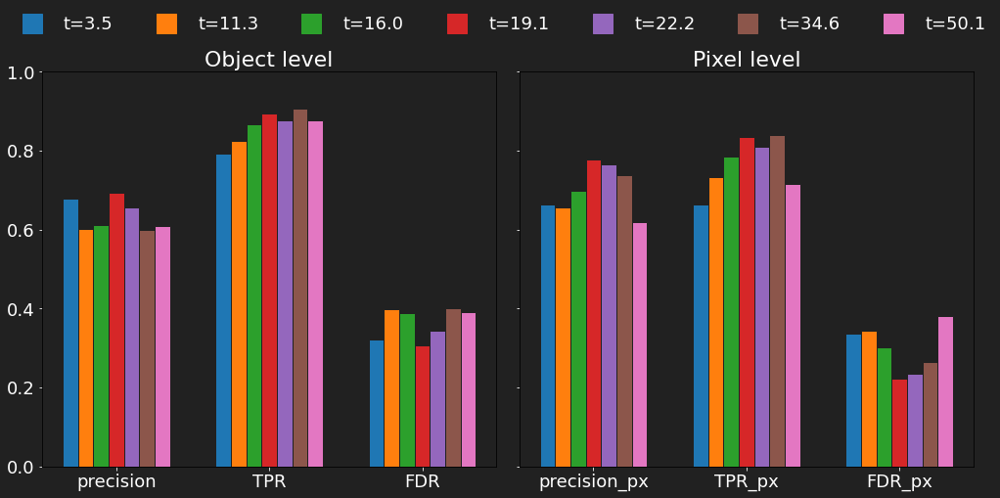

In [79]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'mean_wp_fissionStats'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

colors = plt.cm.get_cmap('tab10')(range(nb_models))
fig, axes = plt.subplots(1, 2, figsize=(7*2, 7), sharey=True)

fig.set_facecolor(facecolor)  

plotting.plot_metrics_comparison(fissionStats.loc[['precision', 'TPR', 'FDR']], xscale=2, color=colors, ax=axes[0], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)  
plotting.plot_metrics_comparison(fissionStats.loc[['precision_px', 'TPR_px', 'FDR_px']], xscale=2, color=colors, ax=axes[1], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)

for ax, title in zip(axes, ['Object level', 'Pixel level']):
  ax.set_title(title, size=22, color='white')
  ax.set_facecolor(facecolor)
  ax.tick_params(axis='x', colors='white')
  ax.tick_params(axis='y', colors='white')

legend = fig.legend([plt.plot([], marker='s', ls='none', markersize=20, color=color)[0] for color in colors], ['t='+model_name.split('_t')[-1] for model_name in folder_name],
                    loc='upper center', facecolor=facecolor, labelcolor='white', framealpha=1, ncol=nb_models)
frame = legend.get_frame()
frame.set_color(facecolor)

plt.tight_layout(pad=0)
fig.subplots_adjust(wspace=0.05, top=0.85, right=0.98)

plt.show()
#fig.savefig(filename)

#### Detection match

In [103]:
det_match = [evaluation.detection_match(output_test[model_name], pred_output_test[model_name]) for model_name in folder_name]

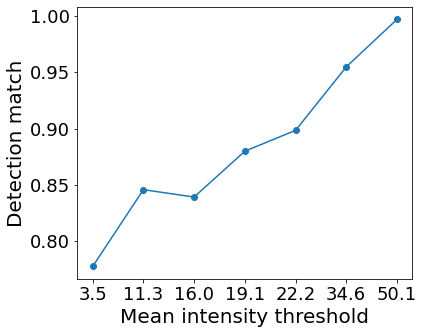

In [104]:
fig, ax = plt.subplots(figsize=(6, 5))
ax.plot(det_match, 'o-')
ax.set_xticks(range(len(det_match)))
ax.set_xticklabels(threshold.round(1))
ax.set(xlabel='Mean intensity threshold', ylabel='Detection match')
plt.show(9)

### Mode: max

Precision-Recall AUC is 10 times bigger after dilating fissions with a disk-shaped gaussian kernel. The highest mean intensity threshold of 22.2 had the best performance.

In [89]:
#Inputs
input_data = util.load_h5(data_path, 'Mito')
print('Inputs'+':', input_data.shape)

optimal_sigma = util.load_pkl(data_path, 'optimal_sigma')
threshold = util.load_pkl(data_path, 'mean_intensity_threshold')
nb_sigmas = optimal_sigma.shape[0]


Loading H:/Santi/Data/Mito.h5
Converting to array
Inputs: (37000, 128, 128)

Loading H:/Santi/Data/optimal_sigma

Loading H:/Santi/Data/mean_intensity_threshold


In [90]:
#Outputs
folder_name = util.get_filename(model_path, 'mean_wp')
nb_models = len(folder_name)

model = util.load_model(model_path, ['model']*nb_models, folder_name, as_type=dict)
history = util.load_pkl(model_path, ['history']*nb_models, folder_name, as_type=dict)
frames_test = util.load_pkl(model_path, ['frames_test']*nb_models, folder_name, as_type=dict)


Loading H:/Santi/Models/mwp_f8_c9_b16_s1.9_t3.5/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.1_t11.3/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t16.0/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t19.1/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t22.2/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.4_t34.6/model.h5

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.7_t50.1/model.h5
Done.

Loading H:/Santi/Models/mwp_f8_c9_b16_s1.9_t3.5/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.1_t11.3/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t16.0/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t19.1/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t22.2/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.4_t34.6/history

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.7_t50.1/history
Done.

Loading H:/Santi/Models/mwp_f8_c9_b16_s1.9_t3.5/frames_test

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.1_t11.3/frames_test

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t16.

In [91]:
input_test, output_test, pred_output_test = {}, {}, {}
labels_test, pred_labels_test = {}, {}
otsu_threshold = {}

for model_name, s, t in zip(folder_name, optimal_sigma, threshold):
  print('\nModel: %s'%model_name)
  #Outputs
  output_data = util.load_h5(data_path, 'mWatProc_s%.1f_t%.1f'%(s, t))
  print('Outputs:', output_data.shape)
  output_test[model_name] = output_data[frames_test[model_name]]
  del output_data

  #Labels
  labels = util.load_h5(data_path, 'proc_labels_s%.1f_t%.1f'%(s, t))
  print('Labels:', labels.shape)
  labels_test[model_name] = labels[frames_test[model_name]]
  del labels

  input_test[model_name] = input_data[frames_test[model_name]]
  pred_output_test[model_name] = evaluation.predict(input_test[model_name], model[model_name])
  otsu_threshold[model_name] = filters.threshold_otsu(pred_output_test[model_name])
  pred_labels_test[model_name] = evaluation.label(pred_output_test[model_name], threshold=otsu_threshold[model_name]) 

del input_data


Model: mwp_f8_c9_b16_s1.9_t3.5

Loading H:/Santi/Data/mWatProc_s1.9_t3.5.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s1.9_t3.5.h5
Converting to array
Labels: (37000, 128, 128)

Model: mwp_f8_c9_b16_s2.1_t11.3

Loading H:/Santi/Data/mWatProc_s2.1_t11.3.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.1_t11.3.h5
Converting to array
Labels: (37000, 128, 128)

Model: mwp_f8_c9_b16_s2.2_t16.0

Loading H:/Santi/Data/mWatProc_s2.2_t16.0.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.2_t16.0.h5
Converting to array
Labels: (37000, 128, 128)

Model: mwp_f8_c9_b16_s2.2_t19.1

Loading H:/Santi/Data/mWatProc_s2.2_t19.1.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.2_t19.1.h5
Converting to array
Labels: (37000, 128, 128)

Model: mwp_f8_c9_b16_s2.2_t22.2

Loading H:/Santi/Data/mWatProc_s2.2_t22.2.h5
Converting to array
Outputs: (37000, 128

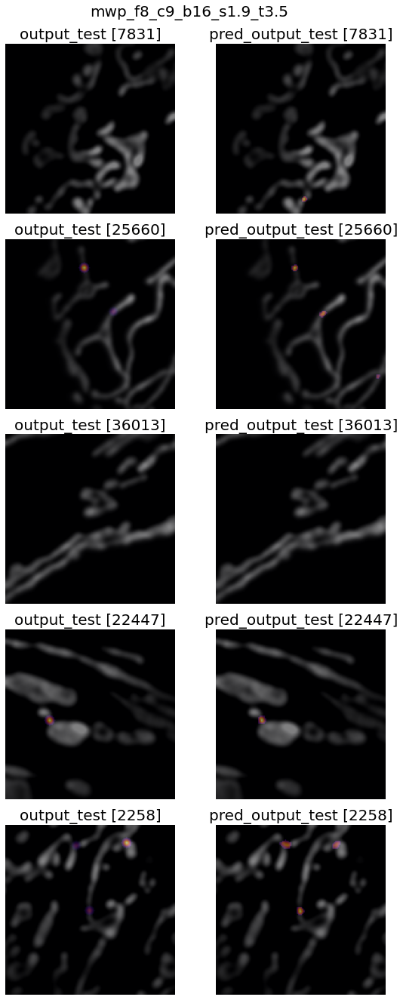

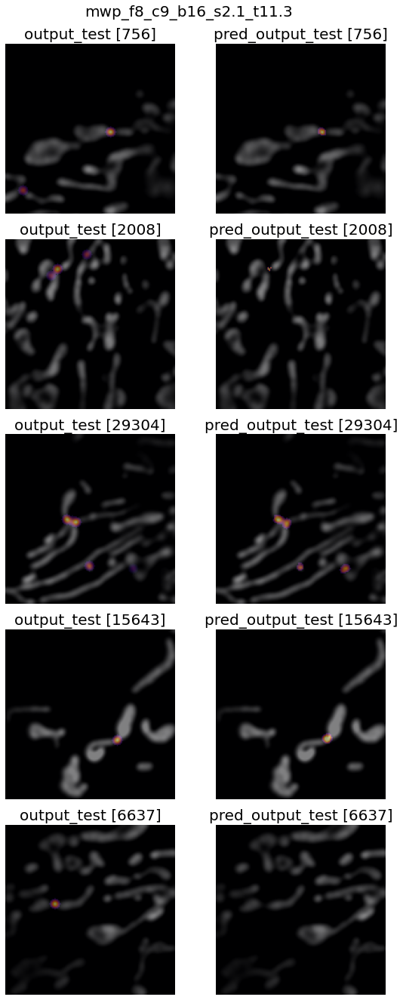

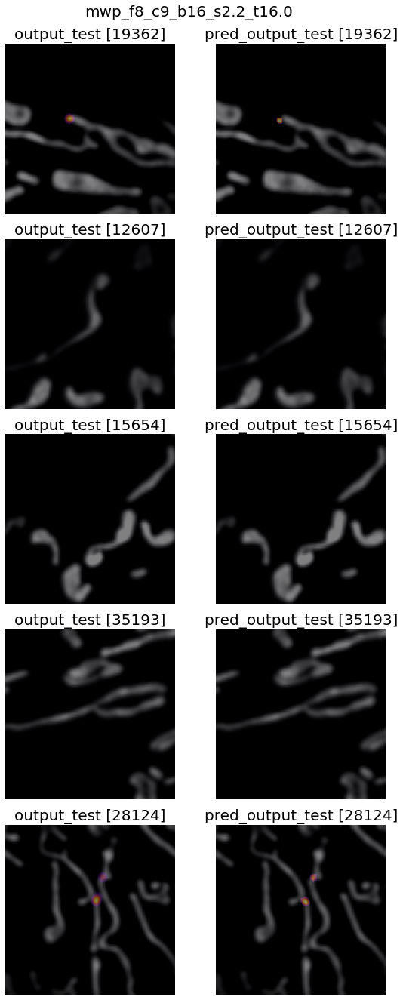

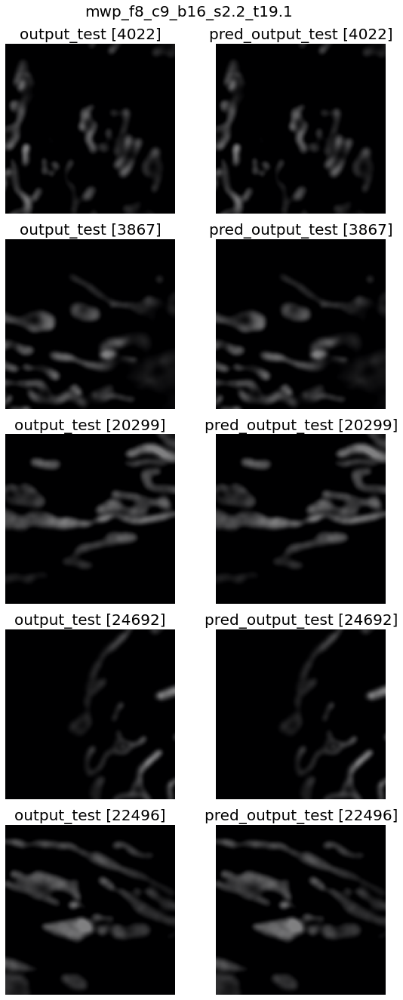

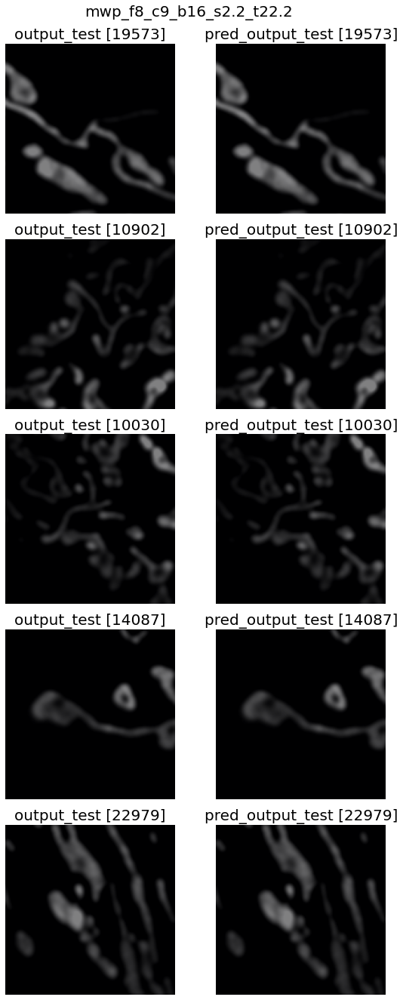

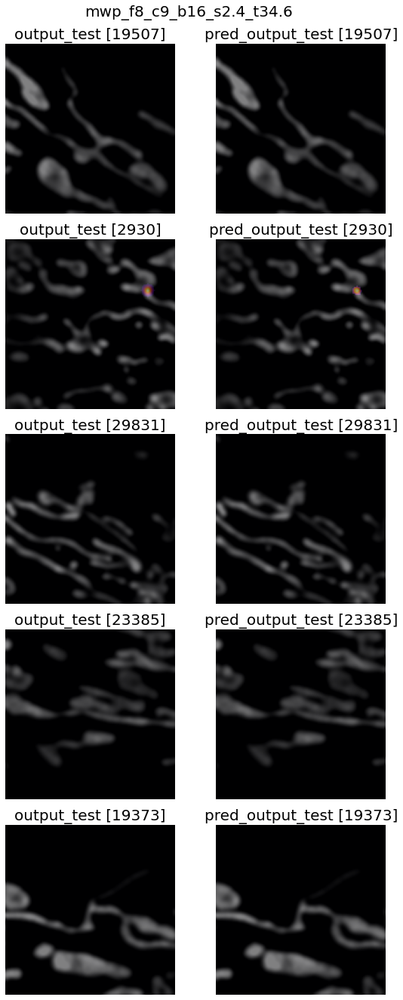

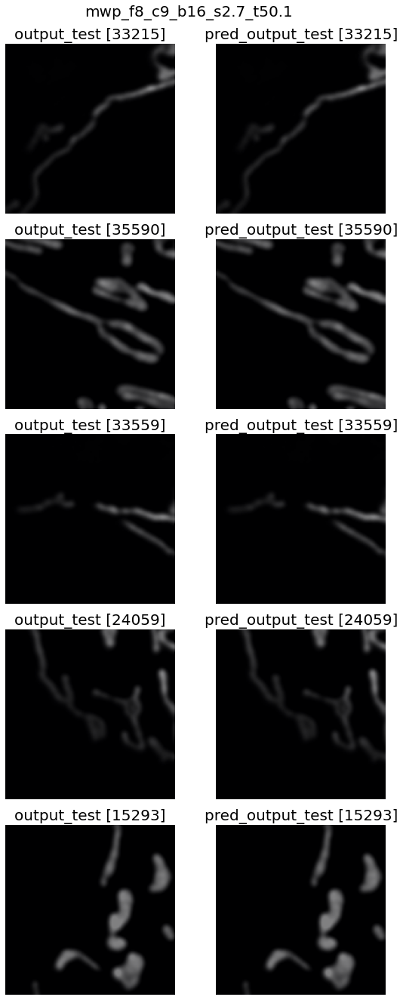

In [92]:
for model_name in folder_name:
  mask = pred_output_test[model_name]>otsu_threshold[model_name]
  plotting.plot_outputs(input_test[model_name], output_test[model_name], 
                        pred_output_test[model_name]*mask, frames_test[model_name], 
                        nb_examples=5, title=model_name, cmap=['gray', 'inferno'])
  plt.show()
  print('\n')

In [93]:
thresholds = np.linspace(0, 1, 50, endpoint=True)
metrics = util.load_pkl(model_path, ['metrics']*len(folder_name), folder_name, as_type=dict)


Loading H:/Santi/Models/mwp_f8_c9_b16_s1.9_t3.5/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.1_t11.3/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t16.0/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t19.1/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.2_t22.2/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.4_t34.6/metrics

Loading H:/Santi/Models/mwp_f8_c9_b16_s2.7_t50.1/metrics
Done.


#### All metrics

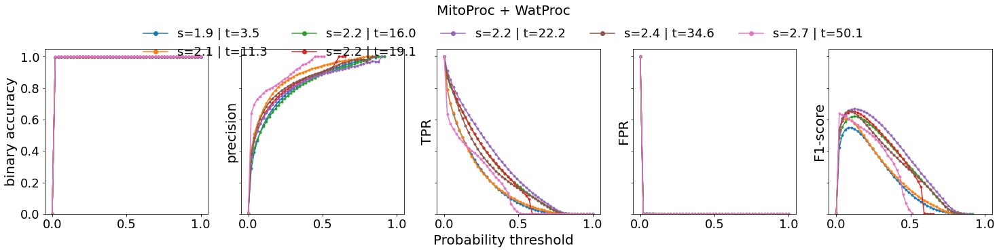

In [94]:
nb_models = len(metrics)
nb_metrics = len(metrics[folder_name[0]])
colors = plt.cm.get_cmap('tab10')(range(nb_models))

fig, axes = plt.subplots(1, nb_metrics, figsize=(5*nb_metrics, 5), sharex=True, sharey=True)
fig.suptitle('MitoProc + WatProc', size=20, va='top')
for model_name, color in zip(folder_name, colors):
  for metric_name, ax in zip(metrics[model_name], axes):
    ax.plot(thresholds, metrics[model_name][metric_name], 'o-', markersize=3, color=color)
    ax.set_ylabel(metric_name)
    ax.set_ylim([0, 1.05])
fig.text(0.5, 0, 'Probability threshold', fontsize=20, ha='center')
fig.legend([plt.plot([], 'o-', color=color)[0] for color in colors], ['s=%.1f | t=%.1f'%(s, t) for s, t in zip(optimal_sigma, threshold)],
           loc='upper center', bbox_to_anchor=(0.5, 0.93), ncol=5, framealpha=0)
fig.subplots_adjust(top=0.8)
plt.show()

#### metricAtMaxF1

In [95]:
metricsAtMaxThreshold = pd.DataFrame({model_name: {metric_name: metrics[model_name][metric_name][metrics[model_name]['F1-score']==np.nanmax(metrics[model_name]['F1-score'])][0]  for metric_name in metrics[model_name]} \
                                      for model_name in folder_name})
metricsAtMaxThreshold

,mwp_f8_c9_b16_s1.9_t3.5,mwp_f8_c9_b16_s2.1_t11.3,mwp_f8_c9_b16_s2.2_t16.0,mwp_f8_c9_b16_s2.2_t19.1,mwp_f8_c9_b16_s2.2_t22.2,mwp_f8_c9_b16_s2.4_t34.6,mwp_f8_c9_b16_s2.7_t50.1
binary accuracy,0.997449,0.998615,0.999029,0.999223,0.999412,0.999670,0.999977
precision,0.521425,0.571363,0.588866,0.617770,0.641792,0.606095,0.639587
TPR,0.578693,0.642156,0.653584,0.689904,0.695789,0.712234,0.633718
FPR,0.001427,0.000796,0.000552,0.000450,0.000330,0.000204,0.000011
F1-score,0.548569,0.604694,0.619540,0.651847,0.667701,0.654892,0.636639


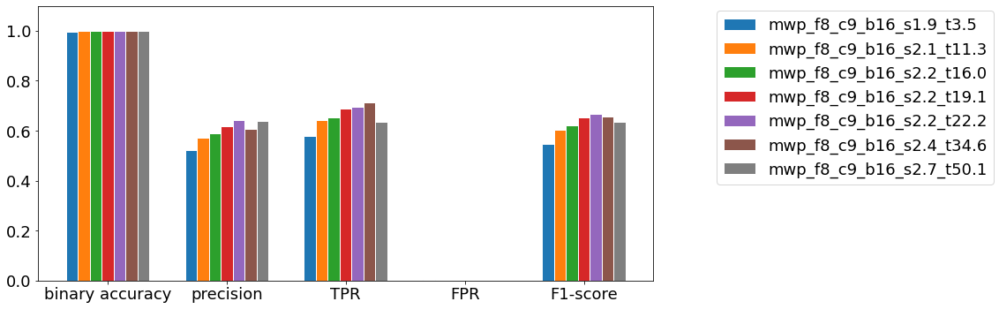

In [96]:
ax = plotting.plot_metrics_comparison(metricsAtMaxThreshold, xscale=2.5, yscale=1.1)
plt.show()

#### ROC and Precision-Recall curves


Fraction of positives
{'mwp_f8_c9_b16_s1.9_t3.5': 0.002678882495777027, 'mwp_f8_c9_b16_s2.1_t11.3': 0.0016491864178631757, 'mwp_f8_c9_b16_s2.2_t16.0': 0.0012090239653716217, 'mwp_f8_c9_b16_s2.2_t19.1': 0.0010538462046030404, 'mwp_f8_c9_b16_s2.2_t22.2': 0.0008497413429054055, 'mwp_f8_c9_b16_s2.4_t34.6': 0.0004399067646748311, 'mwp_f8_c9_b16_s2.7_t50.1': 3.145784945101351e-05}


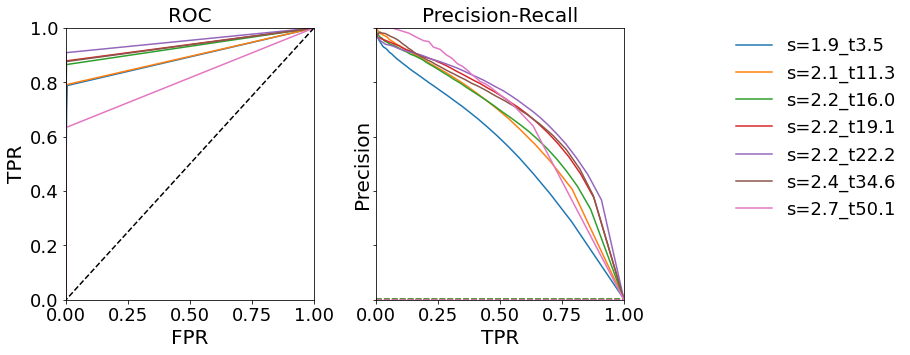

In [97]:
plotting.plot_performance_curves(metrics, output_test, colors=colors)
plt.show()

#### Precision-Recall AUC

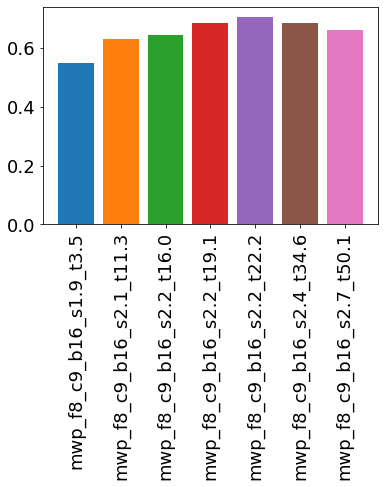

In [98]:
AUC = evaluation.get_AUC(metrics)
xticks = range(len(AUC))

fig, ax = plt.subplots()
ax.bar(xticks, list(AUC.values()), color=colors)
ax.set_xticks(xticks)
ax.set_xticklabels(list(AUC.keys()), rotation=90)
plt.show()

#### Labels binary overlap

In [99]:
fissionStats = {}
for model_name in labels_test:
  print('\nModel name:', model_name)
  fissionStats[model_name] = evaluation.fissionStatsStack(labels_test[model_name], pred_labels_test[model_name])


Model name: mwp_f8_c9_b16_s1.9_t3.5


100%|████████████████████████████████████████████████████████| 7400/7400 [00:02<00:00, 3133.33it/s]



Model name: mwp_f8_c9_b16_s2.1_t11.3


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 4309.19it/s]



Model name: mwp_f8_c9_b16_s2.2_t16.0


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 4996.38it/s]



Model name: mwp_f8_c9_b16_s2.2_t19.1


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 5572.43it/s]



Model name: mwp_f8_c9_b16_s2.2_t22.2


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 6198.34it/s]



Model name: mwp_f8_c9_b16_s2.4_t34.6


100%|███████████████████████████████████████████████████████| 7400/7400 [00:00<00:00, 10213.28it/s]



Model name: mwp_f8_c9_b16_s2.7_t50.1


100%|███████████████████████████████████████████████████████| 7400/7400 [00:00<00:00, 15279.35it/s]


In [100]:
fissionStats = pd.DataFrame(fissionStats, index=['TP', 'FP', 'FN', 'TP_px', 'FP_px', 'FN_px']).T
fissionStats['precision'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FP'])
fissionStats['TPR'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FN'])
fissionStats['FDR'] = fissionStats['FP']/(fissionStats['TP']+fissionStats['FP'])

fissionStats['precision_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])
fissionStats['TPR_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FN_px'])
fissionStats['FDR_px'] = fissionStats['FP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])

fissionStats = fissionStats.T

H:/Santi/Figures/wp_fissionStats.png


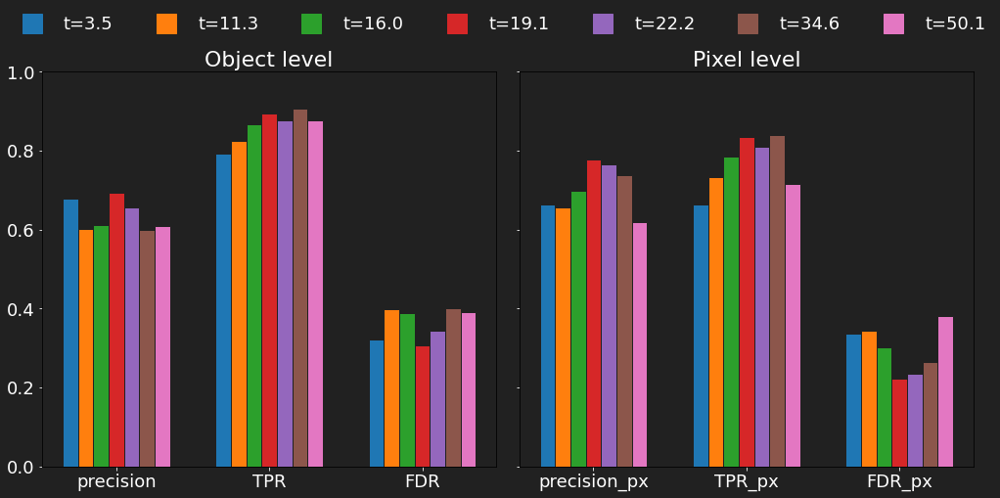

In [79]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'mean_wp_fissionStats'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

colors = plt.cm.get_cmap('tab10')(range(nb_models))
fig, axes = plt.subplots(1, 2, figsize=(7*2, 7), sharey=True)

fig.set_facecolor(facecolor)  

plotting.plot_metrics_comparison(fissionStats.loc[['precision', 'TPR', 'FDR']], xscale=2, color=colors, ax=axes[0], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)  
plotting.plot_metrics_comparison(fissionStats.loc[['precision_px', 'TPR_px', 'FDR_px']], xscale=2, color=colors, ax=axes[1], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)

for ax, title in zip(axes, ['Object level', 'Pixel level']):
  ax.set_title(title, size=22, color='white')
  ax.set_facecolor(facecolor)
  ax.tick_params(axis='x', colors='white')
  ax.tick_params(axis='y', colors='white')

legend = fig.legend([plt.plot([], marker='s', ls='none', markersize=20, color=color)[0] for color in colors], ['t='+model_name.split('_t')[-1] for model_name in folder_name],
                    loc='upper center', facecolor=facecolor, labelcolor='white', framealpha=1, ncol=nb_models)
frame = legend.get_frame()
frame.set_color(facecolor)

plt.tight_layout(pad=0)
fig.subplots_adjust(wspace=0.05, top=0.85, right=0.98)

plt.show()
#fig.savefig(filename)

#### Detection match

In [103]:
det_match = [evaluation.detection_match(output_test[model_name], pred_output_test[model_name]) for model_name in folder_name]

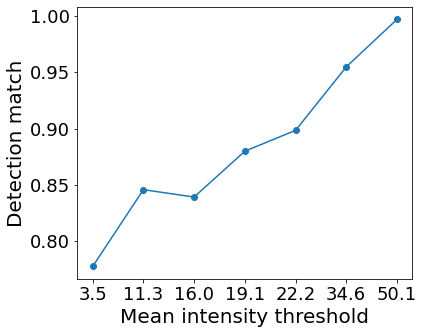

In [104]:
fig, ax = plt.subplots(figsize=(6, 5))
ax.plot(det_match, 'o-')
ax.set_xticks(range(len(det_match)))
ax.set_xticklabels(threshold.round(1))
ax.set(xlabel='Mean intensity threshold', ylabel='Detection match')
plt.show(9)

## MitoProc & WatProc, different spot sizes

Contrast enhancement of input data does not improve the performance

In [105]:
#Inputs
input_data = util.load_h5(data_path, 'MitoProc')
print('Inputs'+':', input_data.shape)

optimal_sigma = util.load_pkl(data_path, 'optimal_sigma')
threshold = util.load_pkl(data_path, 'mean_intensity_threshold')
nb_sigmas = optimal_sigma.shape[0]

#Outputs
folder_name = util.get_filename(model_path, 'wp_mp')


Loading H:/Santi/Data/MitoProc.h5
Converting to array
Inputs: (37000, 128, 128)

Loading H:/Santi/Data/optimal_sigma

Loading H:/Santi/Data/mean_intensity_threshold


In [106]:
nb_models = len(folder_name)

model = util.load_model(model_path, ['model']*nb_models, folder_name, as_type=dict)
history = util.load_pkl(model_path, ['history']*nb_models, folder_name, as_type=dict)
frames_test = util.load_pkl(model_path, ['frames_test']*nb_models, folder_name, as_type=dict)


Loading H:/Santi/Models/wp_mp_f8_c9_b16_s1.9_t3.5/model.h5

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.1_t11.3/model.h5

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t16.0/model.h5

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t19.1/model.h5

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t22.2/model.h5
Done.

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s1.9_t3.5/history

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.1_t11.3/history

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t16.0/history

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t19.1/history

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t22.2/history
Done.

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s1.9_t3.5/frames_test

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.1_t11.3/frames_test

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t16.0/frames_test

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t19.1/frames_test

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t22.2/frames_test
Done.


In [107]:
input_test, output_test, pred_output_test = {}, {}, {}
labels_test, pred_labels_test = {}, {}
otsu_threshold = {}

for model_name, s, t in zip(folder_name, optimal_sigma, threshold):
  print('\nModel: %s'%model_name)
  #Outputs
  output_data = util.load_h5(data_path, 'WatProc_s%.1f_t%.1f'%(s, t))
  print('Outputs:', output_data.shape)
  output_test[model_name] = output_data[frames_test[model_name]]
  del output_data

  #Labels
  labels = util.load_h5(data_path, 'proc_labels_s%.1f_t%.1f'%(s, t))
  print('Labels:', labels.shape)
  labels_test[model_name] = labels[frames_test[model_name]]
  del labels

  input_test[model_name] = input_data[frames_test[model_name]]
  pred_output_test[model_name] = evaluation.predict(input_test[model_name], model[model_name])
  otsu_threshold[model_name] = filters.threshold_otsu(pred_output_test[model_name])
  pred_labels_test[model_name] = evaluation.label(pred_output_test[model_name], threshold=otsu_threshold[model_name]) 

del input_data


Model: wp_mp_f8_c9_b16_s1.9_t3.5

Loading H:/Santi/Data/WatProc_s1.9_t3.5.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s1.9_t3.5.h5
Converting to array
Labels: (37000, 128, 128)

Model: wp_mp_f8_c9_b16_s2.1_t11.3

Loading H:/Santi/Data/WatProc_s2.1_t11.3.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.1_t11.3.h5
Converting to array
Labels: (37000, 128, 128)

Model: wp_mp_f8_c9_b16_s2.2_t16.0

Loading H:/Santi/Data/WatProc_s2.2_t16.0.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.2_t16.0.h5
Converting to array
Labels: (37000, 128, 128)

Model: wp_mp_f8_c9_b16_s2.2_t19.1

Loading H:/Santi/Data/WatProc_s2.2_t19.1.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.2_t19.1.h5
Converting to array
Labels: (37000, 128, 128)

Model: wp_mp_f8_c9_b16_s2.2_t22.2

Loading H:/Santi/Data/WatProc_s2.2_t22.2.h5
Converting to array
Outputs: (37000

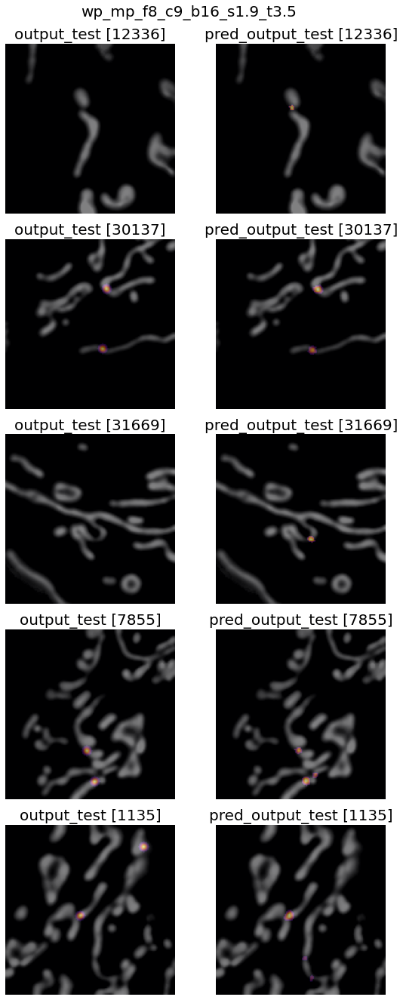

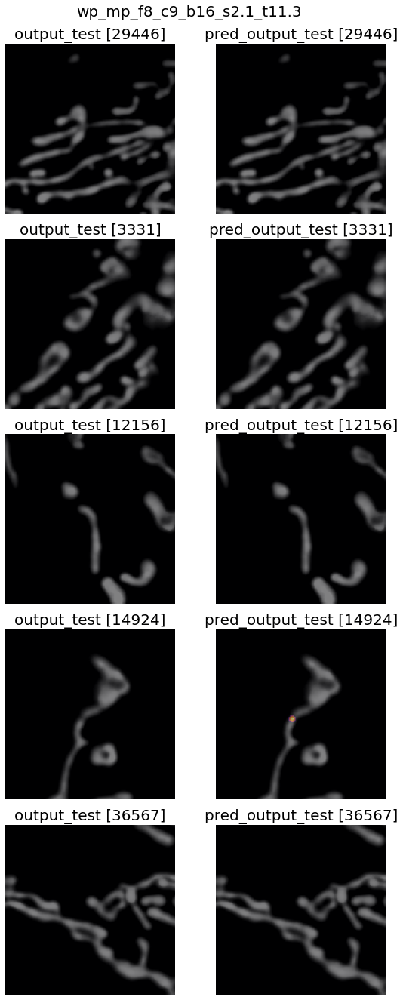

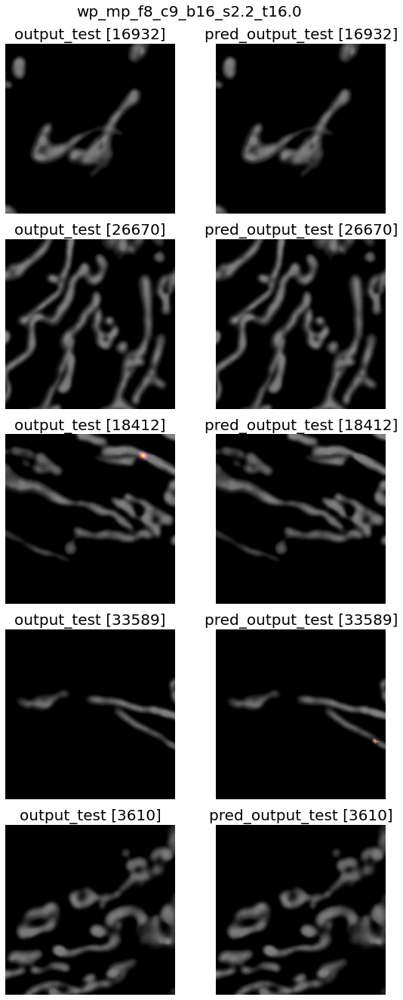

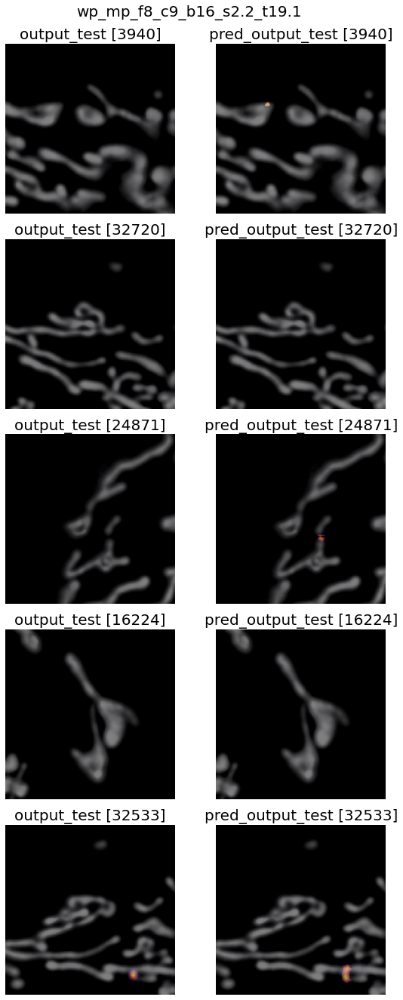

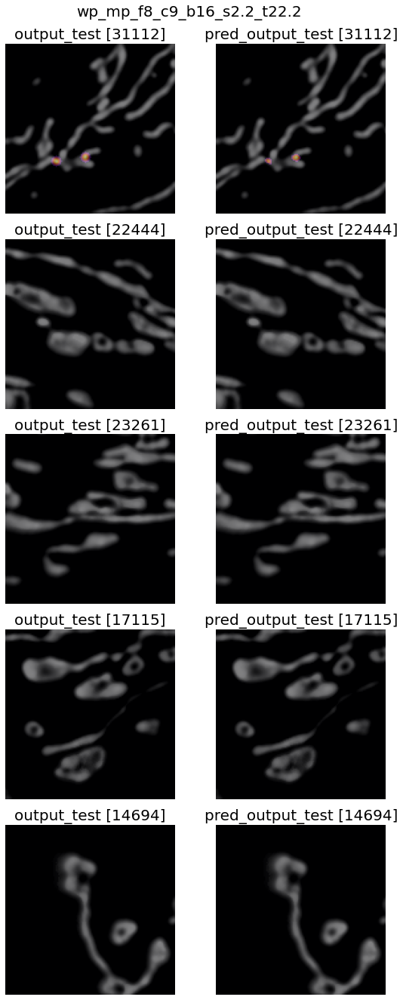

In [108]:
for model_name in folder_name:
  mask = pred_output_test[model_name]>otsu_threshold[model_name]
  plotting.plot_outputs(input_test[model_name], output_test[model_name], 
                        pred_output_test[model_name]*mask, frames_test[model_name], 
                        nb_examples=5, title=model_name, cmap=['gray', 'inferno'])
  plt.show()
  print('\n')

In [109]:
thresholds = np.linspace(0, 1, 50, endpoint=True)
metrics = util.load_pkl(model_path, ['metrics']*len(folder_name), folder_name, as_type=dict)


Loading H:/Santi/Models/wp_mp_f8_c9_b16_s1.9_t3.5/metrics

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.1_t11.3/metrics

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t16.0/metrics

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t19.1/metrics

Loading H:/Santi/Models/wp_mp_f8_c9_b16_s2.2_t22.2/metrics
Done.


### All metrics

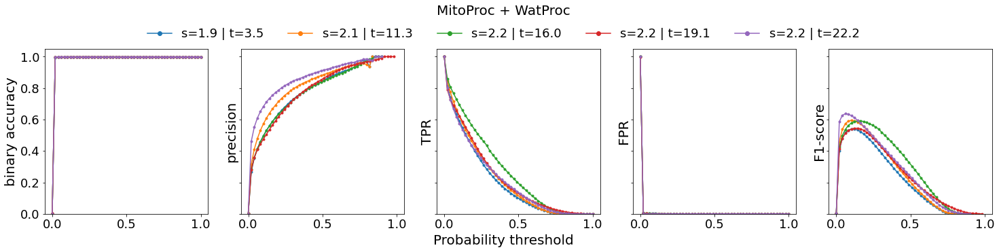

In [110]:
nb_models = len(metrics)
nb_metrics = len(metrics[folder_name[0]])
colors = plt.cm.get_cmap('tab10')(range(nb_models))

fig, axes = plt.subplots(1, nb_metrics, figsize=(5*nb_metrics, 5), sharex=True, sharey=True)
fig.suptitle('MitoProc + WatProc', size=20, va='top')
for model_name, color in zip(folder_name, colors):
  for metric_name, ax in zip(metrics[model_name], axes):
    ax.plot(thresholds, metrics[model_name][metric_name], 'o-', markersize=3, color=color)
    ax.set_ylabel(metric_name)
    ax.set_ylim([0, 1.05])
fig.text(0.5, 0, 'Probability threshold', fontsize=20, ha='center')
fig.legend([plt.plot([], 'o-', color=color)[0] for color in colors], ['s=%.1f | t=%.1f'%(s, t) for s, t in zip(optimal_sigma, threshold)],
           loc='upper center', bbox_to_anchor=(0.5, 0.93), ncol=5, framealpha=0)
fig.subplots_adjust(top=0.8)
plt.show()

### metricAtMaxF1

In [111]:
metricsAtMaxThreshold = pd.DataFrame({model_name: {metric_name: metrics[model_name][metric_name][metrics[model_name]['F1-score']==np.nanmax(metrics[model_name]['F1-score'])][0]  for metric_name in metrics[model_name]} \
                                      for model_name in folder_name})
metricsAtMaxThreshold

,wp_mp_f8_c9_b16_s1.9_t3.5,wp_mp_f8_c9_b16_s2.1_t11.3,wp_mp_f8_c9_b16_s2.2_t16.0,wp_mp_f8_c9_b16_s2.2_t19.1,wp_mp_f8_c9_b16_s2.2_t22.2
binary accuracy,0.997340,0.998611,0.998938,0.999083,0.999349
precision,0.496127,0.572585,0.560177,0.535637,0.608412
TPR,0.590897,0.619432,0.625857,0.553856,0.667272
FPR,0.001586,0.000763,0.000603,0.000476,0.000367
F1-score,0.539381,0.595088,0.591199,0.544594,0.636484


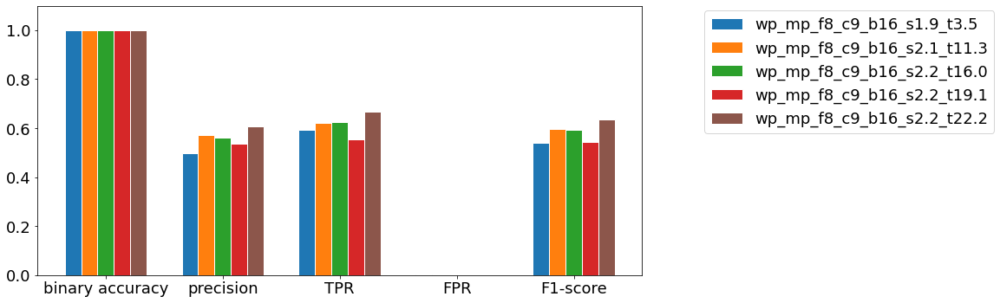

In [112]:
ax = plotting.plot_metrics_comparison(metricsAtMaxThreshold, xscale=2.5, yscale=1.1)
plt.show()

### ROC and Precision-Recall curves


Fraction of positives
{'wp_mp_f8_c9_b16_s1.9_t3.5': 0.00261455638988598, 'wp_mp_f8_c9_b16_s2.1_t11.3': 0.001633045093433277, 'wp_mp_f8_c9_b16_s2.2_t16.0': 0.001216282200168919, 'wp_mp_f8_c9_b16_s2.2_t19.1': 0.000982468063766892, 'wp_mp_f8_c9_b16_s2.2_t22.2': 0.0008479680241765203}


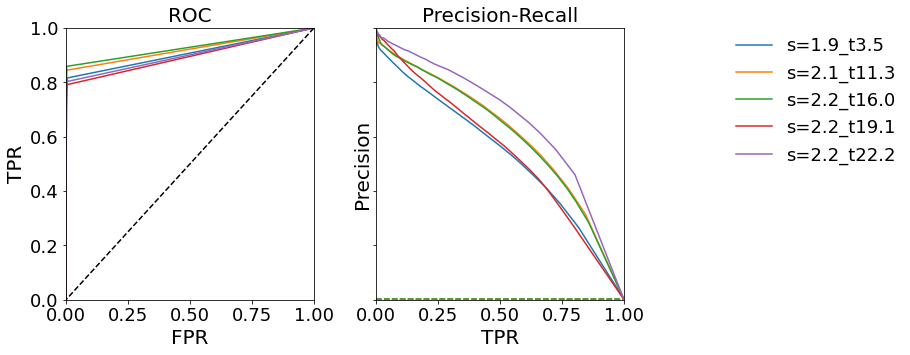

In [113]:
plotting.plot_performance_curves(metrics, output_test, colors=colors)
plt.show()

### Precision-Recall AUC

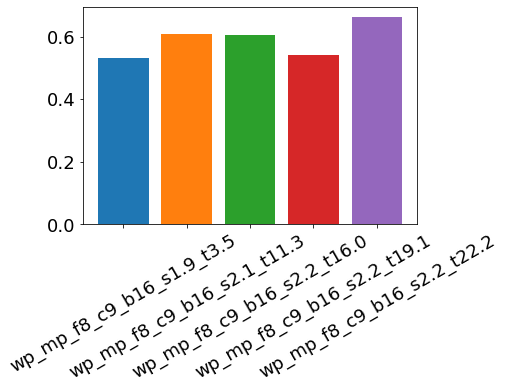

In [114]:
AUC = evaluation.get_AUC(metrics)
xticks = range(len(AUC))

fig, ax = plt.subplots()
ax.bar(xticks, list(AUC.values()), color=colors)
ax.set_xticks(xticks)
ax.set_xticklabels(list(AUC.keys()), rotation=30)
plt.show()

### Labels binary overlap

In [115]:
fissionStats = {}
for model_name in labels_test:
  print('\nModel name:', model_name)
  fissionStats[model_name] = evaluation.fissionStatsStack(labels_test[model_name], pred_labels_test[model_name])


Model name: wp_mp_f8_c9_b16_s1.9_t3.5


100%|████████████████████████████████████████████████████████| 7400/7400 [00:02<00:00, 3201.15it/s]



Model name: wp_mp_f8_c9_b16_s2.1_t11.3


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 4406.86it/s]



Model name: wp_mp_f8_c9_b16_s2.2_t16.0


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 5167.42it/s]



Model name: wp_mp_f8_c9_b16_s2.2_t19.1


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 5864.11it/s]



Model name: wp_mp_f8_c9_b16_s2.2_t22.2


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 6429.99it/s]


In [116]:
fissionStats = pd.DataFrame(fissionStats, index=['TP', 'FP', 'FN', 'TP_px', 'FP_px', 'FN_px']).T
fissionStats['precision'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FP'])
fissionStats['TPR'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FN'])
fissionStats['FDR'] = fissionStats['FP']/(fissionStats['TP']+fissionStats['FP'])

fissionStats['precision_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])
fissionStats['TPR_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FN_px'])
fissionStats['FDR_px'] = fissionStats['FP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])

fissionStats = fissionStats.T

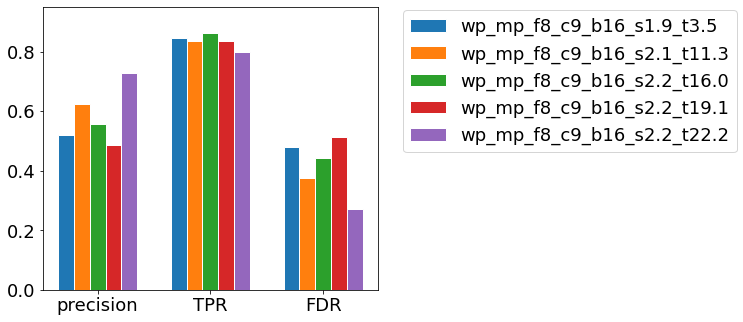

In [117]:
plotting.plot_metrics_comparison(fissionStats.loc[['precision', 'TPR', 'FDR']], xscale=2, color=colors)
plt.show()

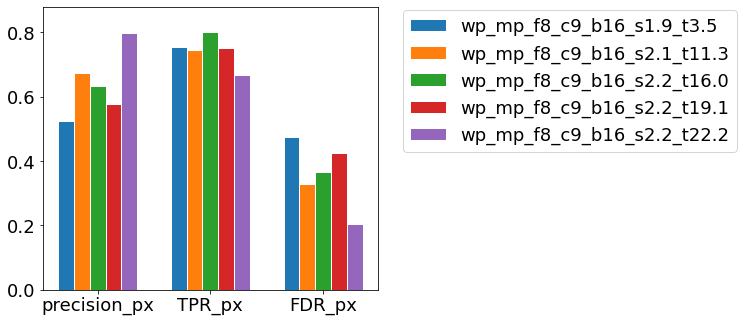

In [118]:
plotting.plot_metrics_comparison(fissionStats.loc[['precision_px', 'TPR_px', 'FDR_px']], xscale=2, color=colors)
plt.show()

### Detection match

In [119]:
det_match = [evaluation.detection_match(output_test[model_name], pred_output_test[model_name], otsu_threshold[model_name]) for model_name in folder_name]

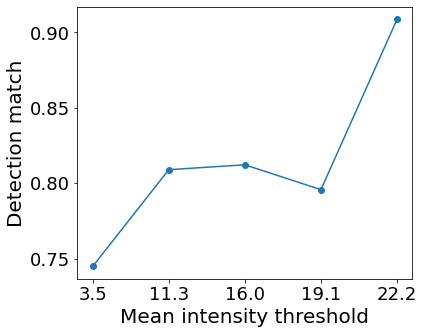

In [121]:
fig, ax = plt.subplots(figsize=(6, 5))
ax.plot(det_match, 'o-')
ax.set_xticks(range(len(det_match)))
ax.set_xticklabels(threshold[:5].round(1))
ax.set(xlabel='Mean intensity threshold', ylabel='Detection match')
plt.show(9)

## Augmented Mito and WatProc with ElasticTransform

Adding elastic deformations makes performance even worse

In [4]:
optimal_sigma = util.load_pkl(data_path, 'optimal_sigma')
threshold = util.load_pkl(data_path, 'mean_intensity_threshold')
nb_sigmas = optimal_sigma.shape[0]

#Inputs
input_data = util.load_h5(data_path, 'Mito')
print('Inputs'+':', input_data.shape)

#Outputs
folder_name = util.get_filename(model_path, 'aug_wp')


Loading H:/Santi/Data/optimal_sigma

Loading H:/Santi/Data/mean_intensity_threshold

Loading H:/Santi/Data/Mito.h5
Converting to array
Inputs: (37000, 128, 128)


In [123]:
nb_models = len(folder_name)

model = util.load_model(model_path, ['model']*nb_models, folder_name, as_type=dict)
history = util.load_pkl(model_path, ['history']*nb_models, folder_name, as_type=dict)
frames_test = util.load_pkl(model_path, ['frames_test']*nb_models, folder_name, as_type=dict)


Loading H:/Santi/Models/aug_wp_f8_c9_b16_s1.9_t3.5/model.h5

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.1_t11.3/model.h5

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.2_t16.0/model.h5

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.2_t19.1/model.h5

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.2_t22.2/model.h5

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.4_t34.6/model.h5

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.7_t50.1/model.h5
Done.

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s1.9_t3.5/history

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.1_t11.3/history

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.2_t16.0/history

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.2_t19.1/history

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.2_t22.2/history

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.4_t34.6/history

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.7_t50.1/history
Done.

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s1.9_t3.5/frames_test

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.1_t11.3/frames_test


In [124]:
input_test, output_test, pred_output_test = {}, {}, {}
labels_test, pred_labels_test = {}, {}
otsu_threshold = {}

for model_name, s, t in zip(folder_name, optimal_sigma, threshold):
  print('\nModel: %s'%model_name)
  #Outputs
  output_data = util.load_h5(data_path, 'aug_WatProc_s%.1f_t%.1f'%(s, t))
  print('Outputs:', output_data.shape)
  output_test[model_name] = output_data[frames_test[model_name]]
  del output_data

  #Labels
  labels = util.load_h5(data_path, 'aug_labels_s%.1f_t%.1f'%(s, t))
  print('Labels:', labels.shape)
  labels_test[model_name] = labels[frames_test[model_name]]
  del labels

  input_test[model_name] = input_data[frames_test[model_name]]
  pred_output_test[model_name] = evaluation.predict(input_test[model_name], model[model_name])
  otsu_threshold[model_name] = filters.threshold_otsu(pred_output_test[model_name])
  pred_labels_test[model_name] = evaluation.label(pred_output_test[model_name], threshold=otsu_threshold[model_name])

del input_data


Model: aug_wp_f8_c9_b16_s1.9_t3.5

Loading H:/Santi/Data/aug_WatProc_s1.9_t3.5.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/aug_labels_s1.9_t3.5.h5
Converting to array
Labels: (37000, 128, 128)

Model: aug_wp_f8_c9_b16_s2.1_t11.3

Loading H:/Santi/Data/aug_WatProc_s2.1_t11.3.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/aug_labels_s2.1_t11.3.h5
Converting to array
Labels: (37000, 128, 128)

Model: aug_wp_f8_c9_b16_s2.2_t16.0

Loading H:/Santi/Data/aug_WatProc_s2.2_t16.0.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/aug_labels_s2.2_t16.0.h5
Converting to array
Labels: (37000, 128, 128)

Model: aug_wp_f8_c9_b16_s2.2_t19.1

Loading H:/Santi/Data/aug_WatProc_s2.2_t19.1.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/aug_labels_s2.2_t19.1.h5
Converting to array
Labels: (37000, 128, 128)

Model: aug_wp_f8_c9_b16_s2.2_t22.2

Loading H:/Santi/Data/aug_WatProc_s2.2_t22.2.h5
Converting to 

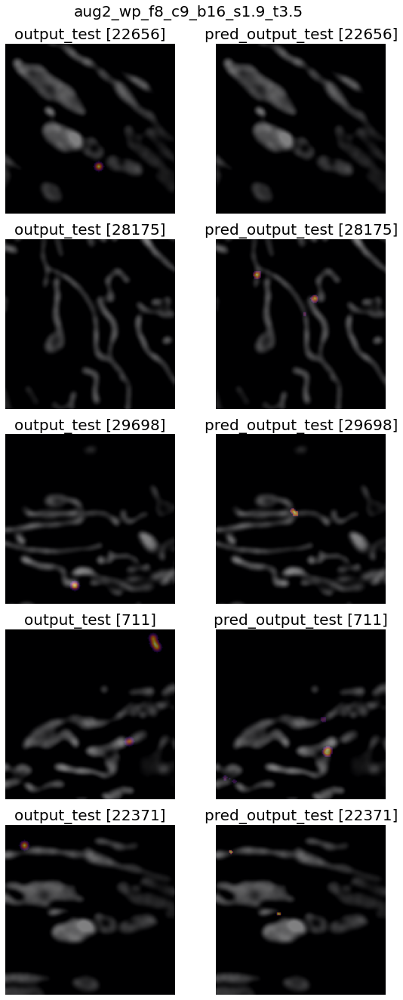

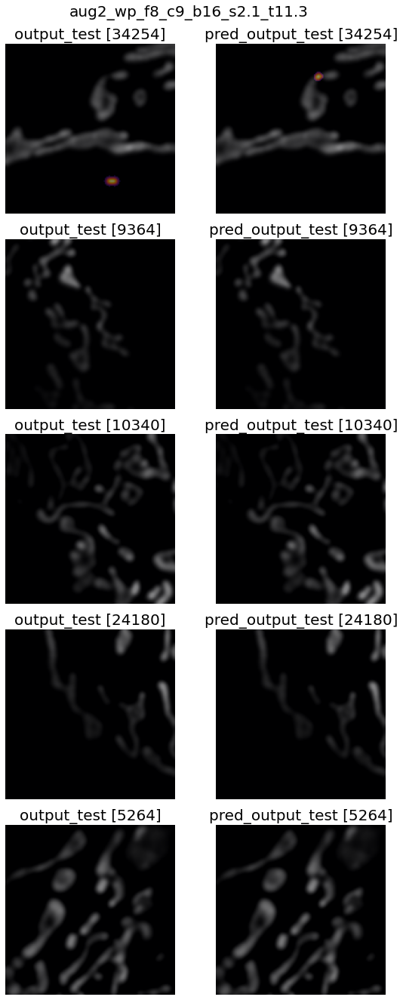

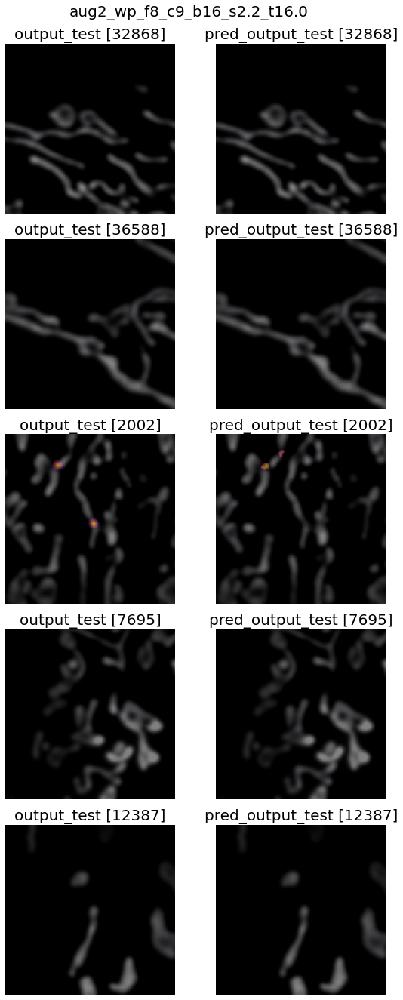

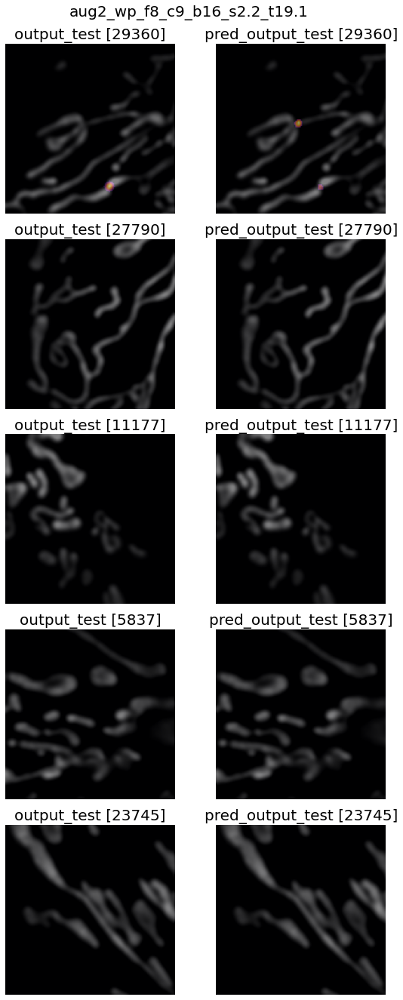

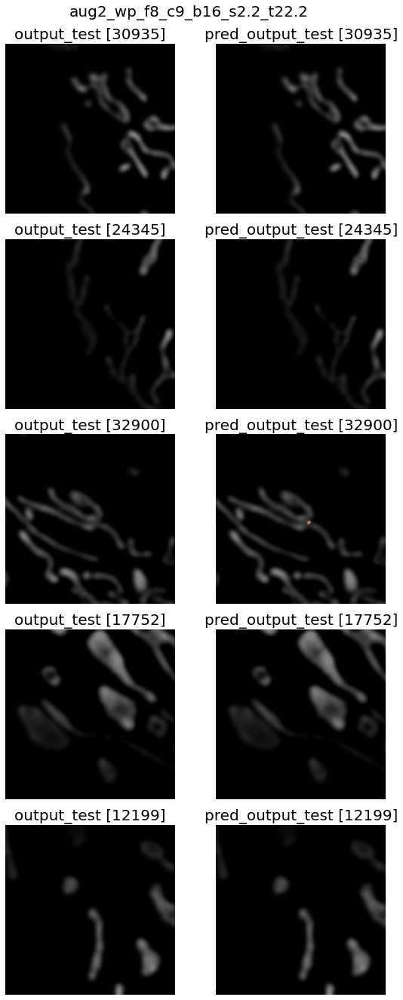

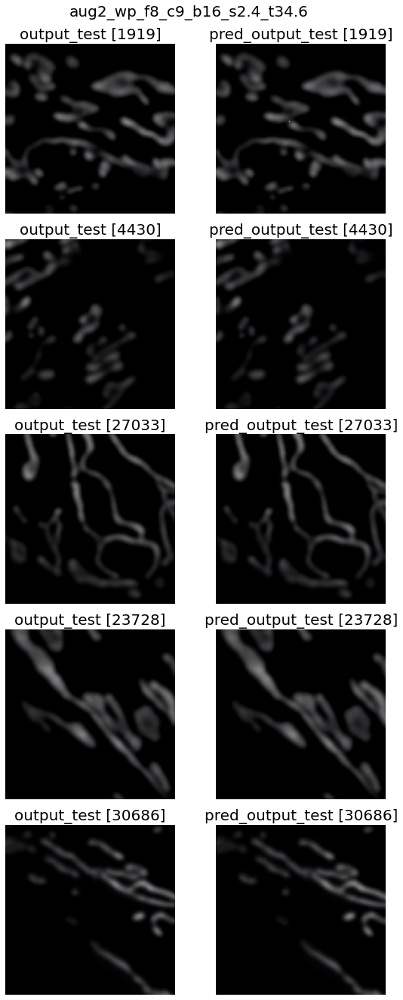

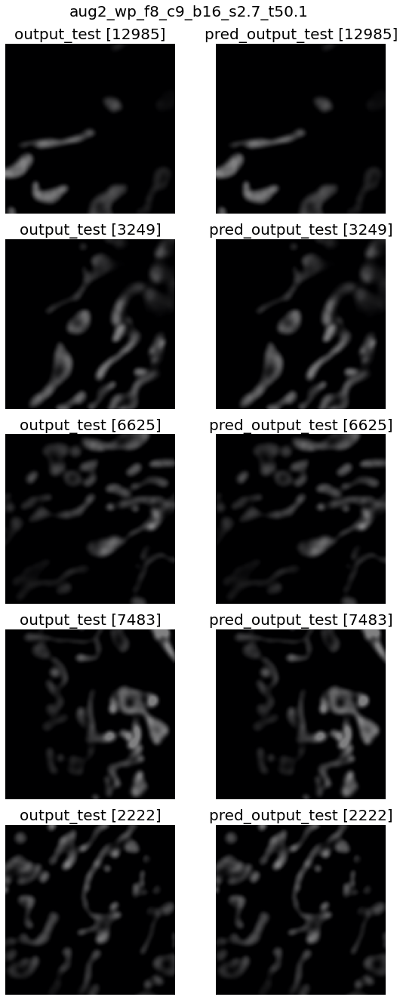

In [9]:
for model_name in folder_name:
  mask = pred_output_test[model_name]>otsu_threshold[model_name]
  plotting.plot_outputs(input_test[model_name], output_test[model_name], 
                        pred_output_test[model_name]*mask, frames_test[model_name], 
                        nb_examples=5, title=model_name, cmap=['gray', 'inferno'])
  plt.show()
  print('\n')

In [126]:
thresholds = np.linspace(0, 1, 50, endpoint=True)
metrics = util.load_pkl(model_path, ['metrics']*len(folder_name), folder_name, as_type=dict)


Loading H:/Santi/Models/aug_wp_f8_c9_b16_s1.9_t3.5/metrics

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.1_t11.3/metrics

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.2_t16.0/metrics

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.2_t19.1/metrics

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.2_t22.2/metrics

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.4_t34.6/metrics

Loading H:/Santi/Models/aug_wp_f8_c9_b16_s2.7_t50.1/metrics
Done.


### All metrics

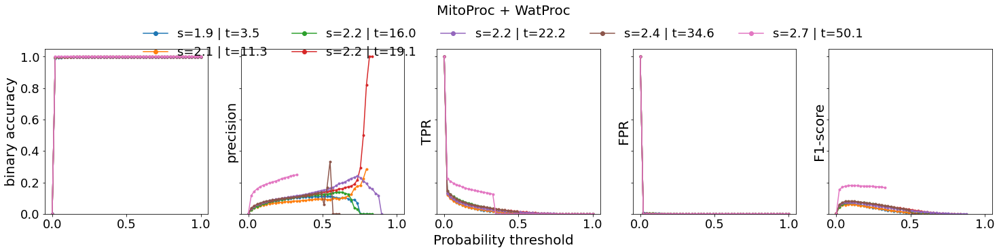

In [127]:
nb_models = len(metrics)
nb_metrics = len(metrics[folder_name[0]])
colors = plt.cm.get_cmap('tab10')(range(nb_models))

fig, axes = plt.subplots(1, nb_metrics, figsize=(5*nb_metrics, 5), sharex=True, sharey=True)
fig.suptitle('MitoProc + WatProc', size=20, va='top')
for model_name, color in zip(folder_name, colors):
  for metric_name, ax in zip(metrics[model_name], axes):
    ax.plot(thresholds, metrics[model_name][metric_name], 'o-', markersize=3, color=color)
    ax.set_ylabel(metric_name)
    ax.set_ylim([0, 1.05])
fig.text(0.5, 0, 'Probability threshold', fontsize=20, ha='center')
fig.legend([plt.plot([], 'o-', color=color)[0] for color in colors], ['s=%.1f | t=%.1f'%(s, t) for s, t in zip(optimal_sigma, threshold)],
           loc='upper center', bbox_to_anchor=(0.5, 0.93), ncol=5, framealpha=0)
fig.subplots_adjust(top=0.8)
plt.show()

### metricAtMaxF1

In [128]:
metricsAtMaxThreshold = pd.DataFrame({model_name: {metric_name: metrics[model_name][metric_name][metrics[model_name]['F1-score']==np.nanmax(metrics[model_name]['F1-score'])][0]  for metric_name in metrics[model_name]} \
                                      for model_name in folder_name})
metricsAtMaxThreshold

,aug_wp_f8_c9_b16_s1.9_t3.5,aug_wp_f8_c9_b16_s2.1_t11.3,aug_wp_f8_c9_b16_s2.2_t16.0,aug_wp_f8_c9_b16_s2.2_t19.1,aug_wp_f8_c9_b16_s2.2_t22.2,aug_wp_f8_c9_b16_s2.4_t34.6,aug_wp_f8_c9_b16_s2.7_t50.1
binary accuracy,0.995792,0.997285,0.998109,0.998527,0.998797,0.999364,0.999960
precision,0.057401,0.050479,0.069567,0.072228,0.072343,0.076427,0.182696
TPR,0.072647,0.070803,0.081295,0.077868,0.073985,0.086922,0.179539
FPR,0.002372,0.001601,0.001026,0.000767,0.000609,0.000340,0.000020
F1-score,0.064131,0.058938,0.074975,0.074942,0.073155,0.081337,0.181104


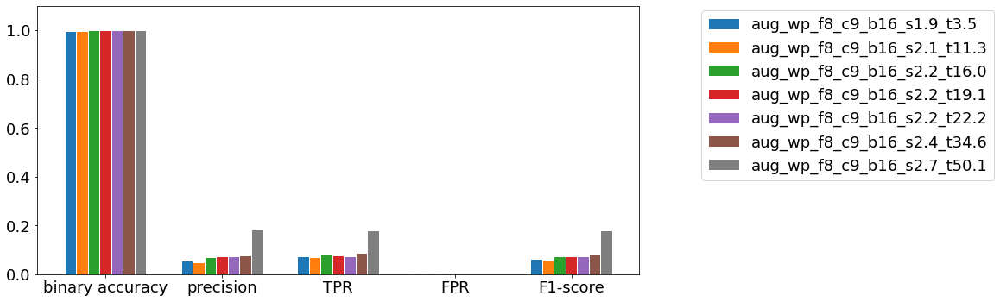

In [129]:
ax = plotting.plot_metrics_comparison(metricsAtMaxThreshold, xscale=2.5, yscale=1.1)
plt.show()

### ROC and Precision-Recall curves


Fraction of positives
{'aug_wp_f8_c9_b16_s1.9_t3.5': 0.0019846983213682432, 'aug_wp_f8_c9_b16_s2.1_t11.3': 0.0012008007152660473, 'aug_wp_f8_c9_b16_s2.2_t16.0': 0.000942539524387669, 'aug_wp_f8_c9_b16_s2.2_t19.1': 0.0007661396748310811, 'aug_wp_f8_c9_b16_s2.2_t22.2': 0.0006416939400337838, 'aug_wp_f8_c9_b16_s2.4_t34.6': 0.0003238574878589527, 'aug_wp_f8_c9_b16_s2.7_t50.1': 2.4348078547297296e-05}


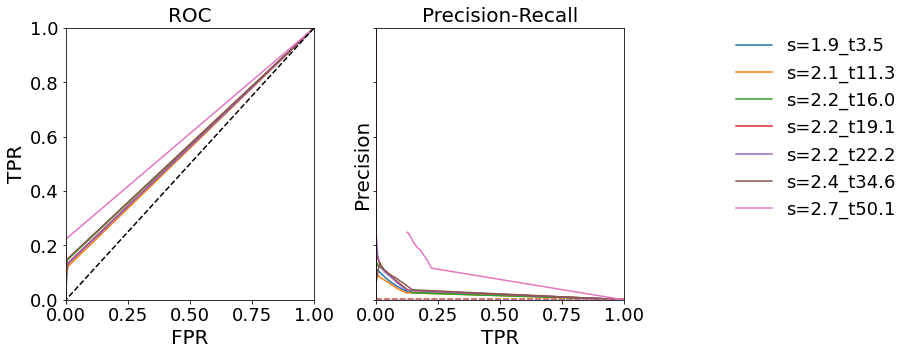

In [130]:
plotting.plot_performance_curves(metrics, output_test, colors=colors)
plt.show()

### Precision-Recall AUC

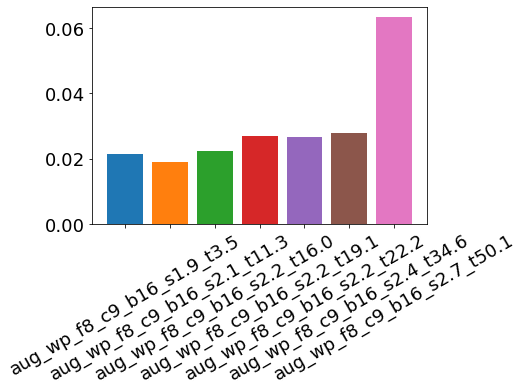

In [131]:
AUC = evaluation.get_AUC(metrics)
xticks = range(len(AUC))

fig, ax = plt.subplots()
ax.bar(xticks, list(AUC.values()), color=colors)
ax.set_xticks(xticks)
ax.set_xticklabels(list(AUC.keys()), rotation=30)
plt.show()

### Labels binary overlap

In [132]:
fissionStats = {}
for model_name in labels_test:
  print('\nModel name:', model_name)
  fissionStats[model_name] = evaluation.fissionStatsStack(labels_test[model_name], pred_labels_test[model_name])


Model name: aug_wp_f8_c9_b16_s1.9_t3.5


100%|████████████████████████████████████████████████████████| 7400/7400 [00:02<00:00, 3558.54it/s]



Model name: aug_wp_f8_c9_b16_s2.1_t11.3


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 5003.16it/s]



Model name: aug_wp_f8_c9_b16_s2.2_t16.0


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 5683.82it/s]



Model name: aug_wp_f8_c9_b16_s2.2_t19.1


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 6497.94it/s]



Model name: aug_wp_f8_c9_b16_s2.2_t22.2


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 6956.40it/s]



Model name: aug_wp_f8_c9_b16_s2.4_t34.6


100%|███████████████████████████████████████████████████████| 7400/7400 [00:00<00:00, 11119.78it/s]



Model name: aug_wp_f8_c9_b16_s2.7_t50.1


100%|███████████████████████████████████████████████████████| 7400/7400 [00:00<00:00, 15868.37it/s]


In [133]:
fissionStats = pd.DataFrame(fissionStats, index=['TP', 'FP', 'FN', 'TP_px', 'FP_px', 'FN_px']).T
fissionStats['precision'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FP'])
fissionStats['TPR'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FN'])
fissionStats['FDR'] = fissionStats['FP']/(fissionStats['TP']+fissionStats['FP'])

fissionStats['precision_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])
fissionStats['TPR_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FN_px'])
fissionStats['FDR_px'] = fissionStats['FP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])

fissionStats = fissionStats.T

H:/Santi/Figures/temp_wp_fissionStats.png


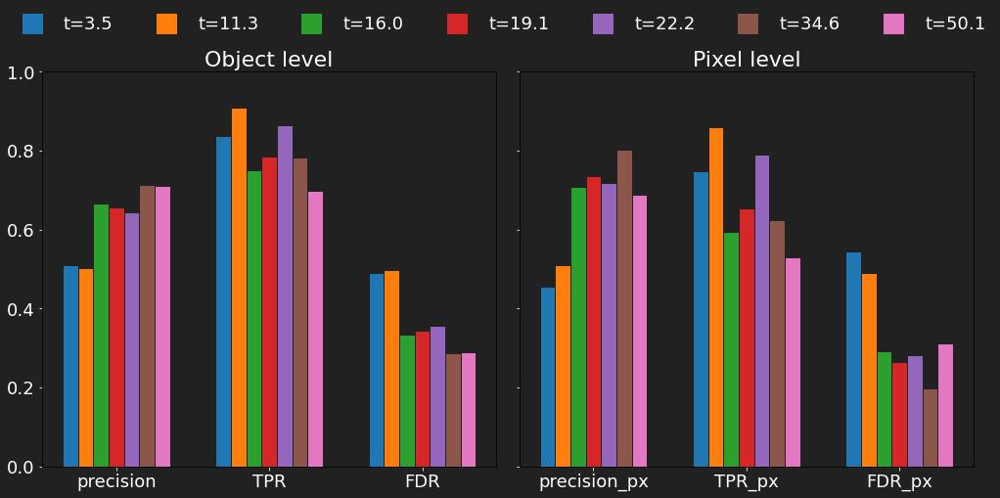

In [75]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'aug_wp_fissionStats'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

colors = plt.cm.get_cmap('tab10')(range(nb_models))
fig, axes = plt.subplots(1, 2, figsize=(7*2, 7), sharey=True)

fig.set_facecolor(facecolor)  

plotting.plot_metrics_comparison(fissionStats.loc[['precision', 'TPR', 'FDR']], xscale=2, color=colors, ax=axes[0], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)  
plotting.plot_metrics_comparison(fissionStats.loc[['precision_px', 'TPR_px', 'FDR_px']], xscale=2, color=colors, ax=axes[1], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)

for ax, title in zip(axes, ['Object level', 'Pixel level']):
  ax.set_title(title, size=22, color='white')
  ax.set_facecolor(facecolor)
  ax.tick_params(axis='x', colors='white')
  ax.tick_params(axis='y', colors='white')

legend = fig.legend([plt.plot([], marker='s', ls='none', markersize=20, color=color)[0] for color in colors], ['t='+model_name.split('_t')[-1] for model_name in folder_name],
                    loc='upper center', facecolor=facecolor, labelcolor='white', framealpha=1, ncol=nb_models)
frame = legend.get_frame()
frame.set_color(facecolor)

plt.tight_layout(pad=0)
fig.subplots_adjust(wspace=0.05, top=0.85, right=0.98)

plt.show()
#fig.savefig(filename)

### Detection match

In [136]:
det_match = [evaluation.detection_match(output_test[model_name], pred_output_test[model_name], otsu_threshold[model_name]) for model_name in folder_name]

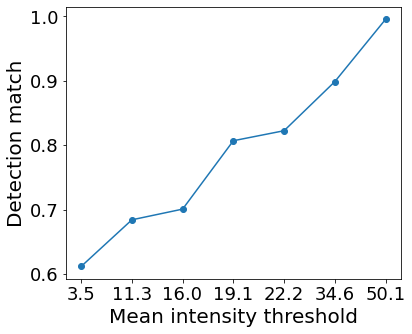

In [137]:
fig, ax = plt.subplots(figsize=(6, 5))
ax.plot(det_match, 'o-')
ax.set_xticks(range(len(det_match)))
ax.set_xticklabels(threshold.round(1))
ax.set(xlabel='Mean intensity threshold', ylabel='Detection match')
plt.show(9)

## Augmented Mito and WatProc without ElasticTransform



Training preexisting model on an augmented dataset worsened its performance.

In [4]:
optimal_sigma = util.load_pkl(data_path, 'optimal_sigma')
threshold = util.load_pkl(data_path, 'mean_intensity_threshold')
nb_sigmas = optimal_sigma.shape[0]

#Inputs
input_data = util.load_h5(data_path, 'Mito')
print('Inputs'+':', input_data.shape)

#Outputs
folder_name = util.get_filename(model_path, 'aug2_wp')


Loading H:/Santi/Data/optimal_sigma

Loading H:/Santi/Data/mean_intensity_threshold

Loading H:/Santi/Data/Mito.h5
Converting to array
Inputs: (37000, 128, 128)


In [5]:
nb_models = len(folder_name)

model = util.load_model(model_path, ['model']*nb_models, folder_name, as_type=dict)
history = util.load_pkl(model_path, ['history']*nb_models, folder_name, as_type=dict)
frames_test = util.load_pkl(model_path, ['frames_test']*nb_models, folder_name, as_type=dict)


Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s1.9_t3.5/model.h5

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.1_t11.3/model.h5

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.2_t16.0/model.h5

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.2_t19.1/model.h5

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.2_t22.2/model.h5

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.4_t34.6/model.h5

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.7_t50.1/model.h5
Done.

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s1.9_t3.5/history

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.1_t11.3/history

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.2_t16.0/history

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.2_t19.1/history

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.2_t22.2/history

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.4_t34.6/history

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.7_t50.1/history
Done.

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s1.9_t3.5/frames_test

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.1_t1

In [6]:
input_test, output_test, pred_output_test = {}, {}, {}
labels_test, pred_labels_test = {}, {}
otsu_threshold = {}

for model_name, s, t in zip(folder_name, optimal_sigma, threshold):
  print('\nModel: %s'%model_name)
  #Outputs
  output_data = util.load_h5(data_path, 'aug2_WatProc_s%.1f_t%.1f'%(s, t))
  print('Outputs:', output_data.shape)
  output_test[model_name] = output_data[frames_test[model_name]]
  del output_data

  #Labels
  labels = util.load_h5(data_path, 'aug2_labels_s%.1f_t%.1f'%(s, t))
  print('Labels:', labels.shape)
  labels_test[model_name] = labels[frames_test[model_name]]
  del labels

  input_test[model_name] = input_data[frames_test[model_name]]
  pred_output_test[model_name] = evaluation.predict(input_test[model_name], model[model_name])
  otsu_threshold[model_name] = filters.threshold_otsu(pred_output_test[model_name])
  pred_labels_test[model_name] = evaluation.label(pred_output_test[model_name], threshold=otsu_threshold[model_name]) 

del input_data


Model: aug2_wp_f8_c9_b16_s1.9_t3.5

Loading H:/Santi/Data/aug2_WatProc_s1.9_t3.5.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/aug2_labels_s1.9_t3.5.h5
Converting to array
Labels: (37000, 128, 128)

Model: aug2_wp_f8_c9_b16_s2.1_t11.3

Loading H:/Santi/Data/aug2_WatProc_s2.1_t11.3.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/aug2_labels_s2.1_t11.3.h5
Converting to array
Labels: (37000, 128, 128)

Model: aug2_wp_f8_c9_b16_s2.2_t16.0

Loading H:/Santi/Data/aug2_WatProc_s2.2_t16.0.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/aug2_labels_s2.2_t16.0.h5
Converting to array
Labels: (37000, 128, 128)

Model: aug2_wp_f8_c9_b16_s2.2_t19.1

Loading H:/Santi/Data/aug2_WatProc_s2.2_t19.1.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/aug2_labels_s2.2_t19.1.h5
Converting to array
Labels: (37000, 128, 128)

Model: aug2_wp_f8_c9_b16_s2.2_t22.2

Loading H:/Santi/Data/aug2_WatProc_s2.2_t22.2.h5


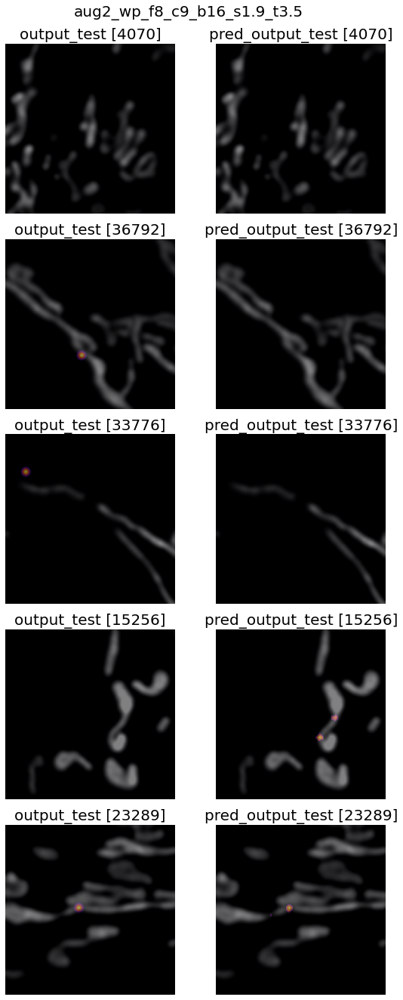

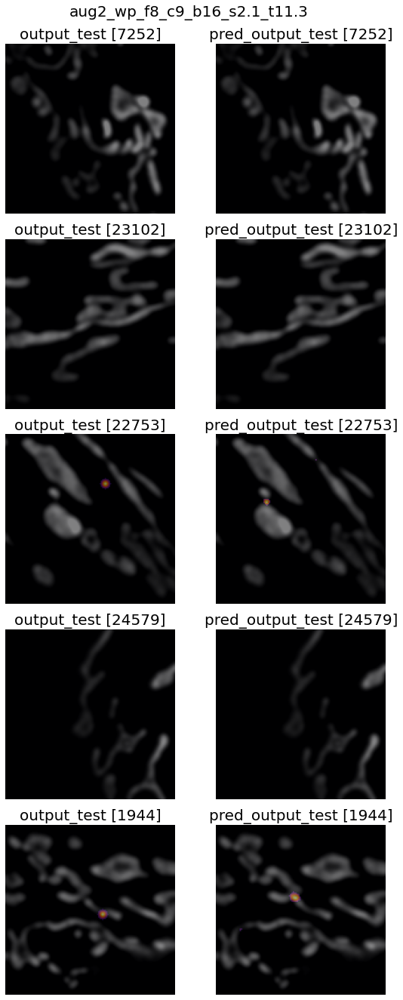

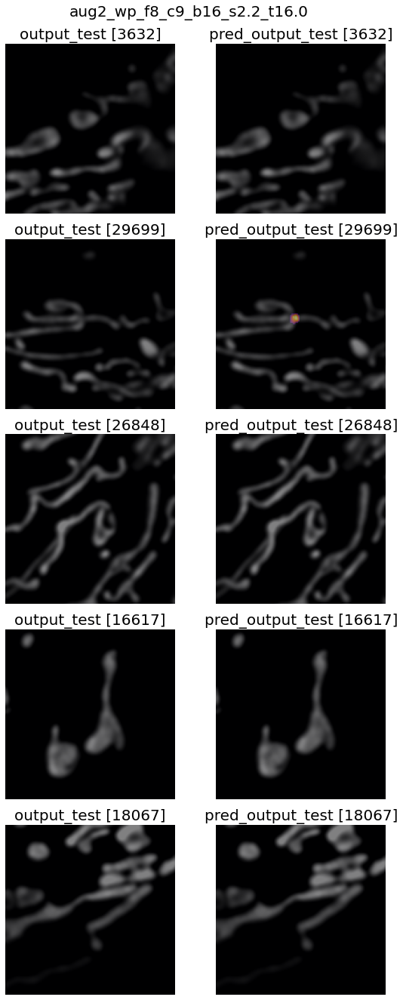

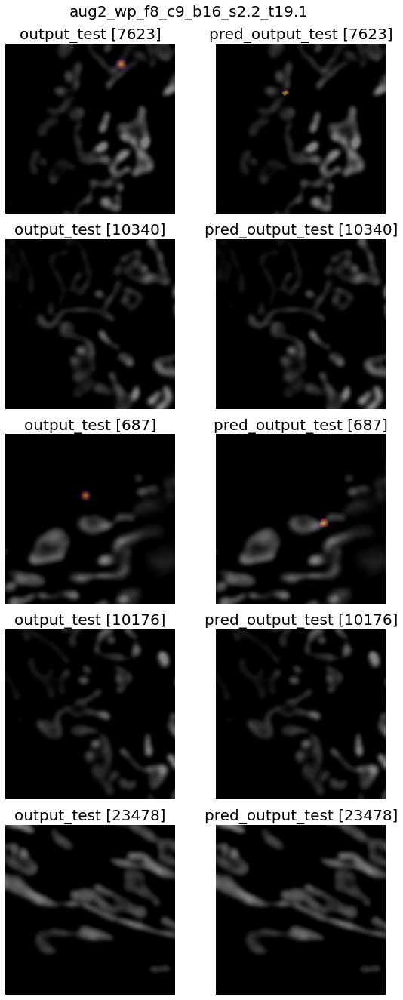

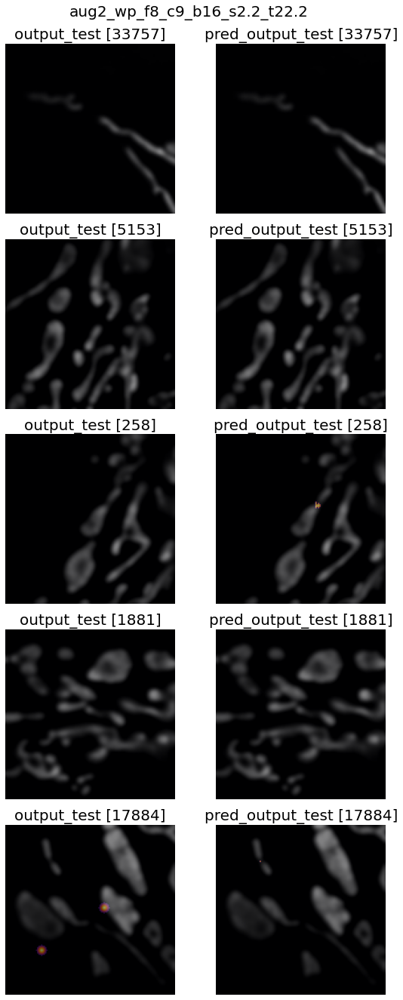

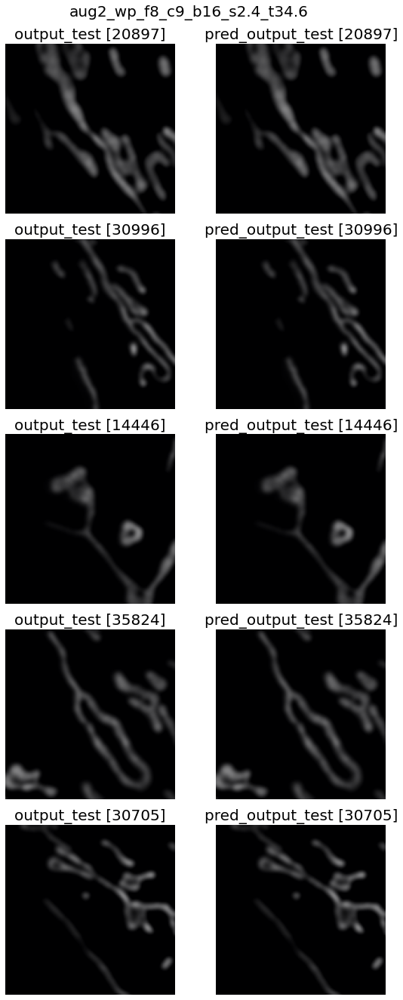

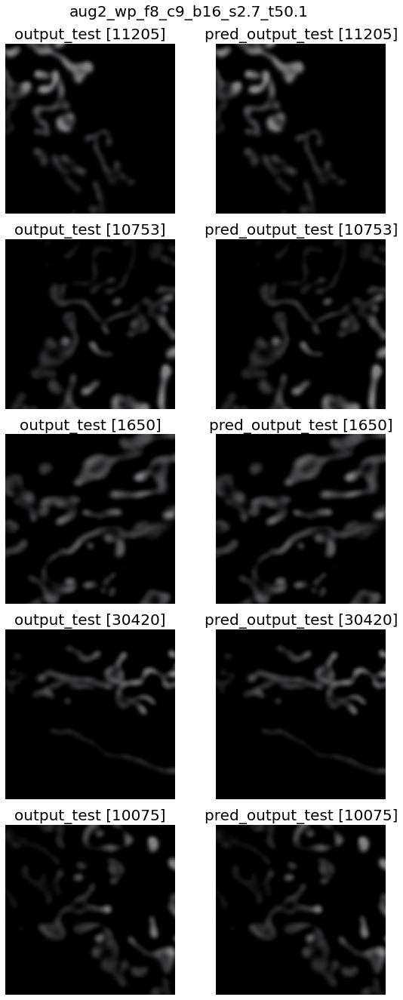

In [141]:
for model_name in folder_name:
  mask = pred_output_test[model_name]>otsu_threshold[model_name]
  plotting.plot_outputs(input_test[model_name], output_test[model_name], 
                        pred_output_test[model_name]*mask, frames_test[model_name], 
                        nb_examples=5, title=model_name, cmap=['gray', 'inferno'])
  plt.show()
  print('\n')

In [142]:
thresholds = np.linspace(0, 1, 50, endpoint=True)
metrics = util.load_pkl(model_path, ['metrics']*len(folder_name), folder_name, as_type=dict)


Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s1.9_t3.5/metrics

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.1_t11.3/metrics

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.2_t16.0/metrics

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.2_t19.1/metrics

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.2_t22.2/metrics

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.4_t34.6/metrics

Loading H:/Santi/Models/aug2_wp_f8_c9_b16_s2.7_t50.1/metrics
Done.


### All metrics

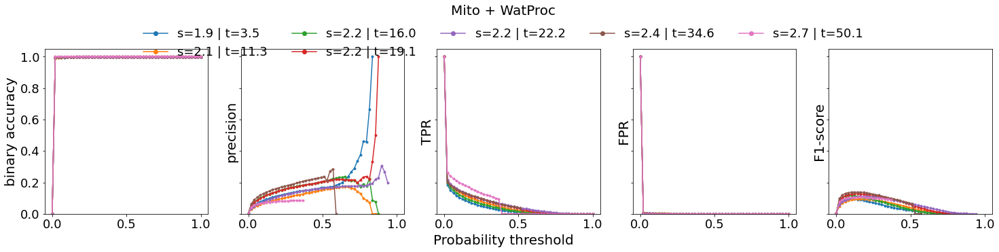

In [143]:
nb_models = len(metrics)
nb_metrics = len(metrics[folder_name[0]])
colors = plt.cm.get_cmap('tab10')(range(nb_models))

fig, axes = plt.subplots(1, nb_metrics, figsize=(5*nb_metrics, 5), sharex=True, sharey=True)
fig.suptitle('Mito + WatProc', size=20, va='top')
for model_name, color in zip(folder_name, colors):
  for metric_name, ax in zip(metrics[model_name], axes):
    ax.plot(thresholds, metrics[model_name][metric_name], 'o-', markersize=3, color=color)
    ax.set_ylabel(metric_name)
    ax.set_ylim([0, 1.05])
fig.text(0.5, 0, 'Probability threshold', fontsize=20, ha='center')
fig.legend([plt.plot([], 'o-', color=color)[0] for color in colors], ['s=%.1f | t=%.1f'%(s, t) for s, t in zip(optimal_sigma, threshold)],
           loc='upper center', bbox_to_anchor=(0.5, 0.93), ncol=5, framealpha=0)
fig.subplots_adjust(top=0.8)
plt.show()

### metricAtMaxF1

In [144]:
metricsAtMaxThreshold = pd.DataFrame({model_name: {metric_name: metrics[model_name][metric_name][metrics[model_name]['F1-score']==np.nanmax(metrics[model_name]['F1-score'])][0]  for metric_name in metrics[model_name]} \
                                      for model_name in folder_name})
metricsAtMaxThreshold

,aug2_wp_f8_c9_b16_s1.9_t3.5,aug2_wp_f8_c9_b16_s2.1_t11.3,aug2_wp_f8_c9_b16_s2.2_t16.0,aug2_wp_f8_c9_b16_s2.2_t19.1,aug2_wp_f8_c9_b16_s2.2_t22.2,aug2_wp_f8_c9_b16_s2.4_t34.6,aug2_wp_f8_c9_b16_s2.7_t50.1
binary accuracy,0.995646,0.997360,0.998148,0.998574,0.998764,0.999401,0.999929
precision,0.085630,0.084188,0.110784,0.126086,0.110639,0.137535,0.076981
TPR,0.104243,0.107806,0.121083,0.129452,0.109967,0.138964,0.170050
FPR,0.002418,0.001501,0.000973,0.000724,0.000616,0.000302,0.000051
F1-score,0.094024,0.094544,0.115705,0.127747,0.110302,0.138246,0.105984


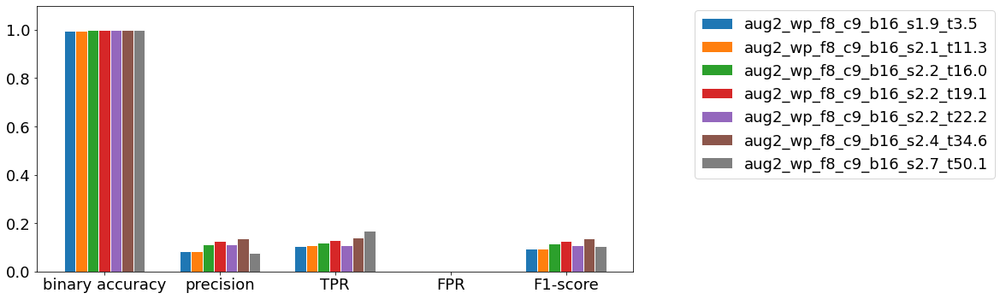

In [145]:
ax = plotting.plot_metrics_comparison(metricsAtMaxThreshold, xscale=2.5, yscale=1.1)
plt.show()

### ROC and Precision-Recall curves


Fraction of positives
{'aug2_wp_f8_c9_b16_s1.9_t3.5': 0.002167416134396115, 'aug2_wp_f8_c9_b16_s2.1_t11.3': 0.0012786700274493243, 'aug2_wp_f8_c9_b16_s2.2_t16.0': 0.0010005889067778717, 'aug2_wp_f8_c9_b16_s2.2_t19.1': 0.0008065630938555743, 'aug2_wp_f8_c9_b16_s2.2_t22.2': 0.00069671630859375, 'aug2_wp_f8_c9_b16_s2.4_t34.6': 0.00034597036000844593, 'aug2_wp_f8_c9_b16_s2.7_t50.1': 2.4785222233952704e-05}


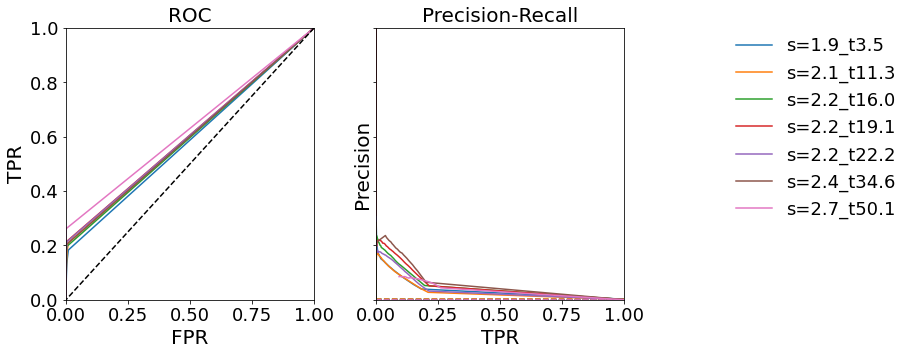

In [146]:
plotting.plot_performance_curves(metrics, output_test, colors=colors)
plt.show()

### Precision-Recall AUC

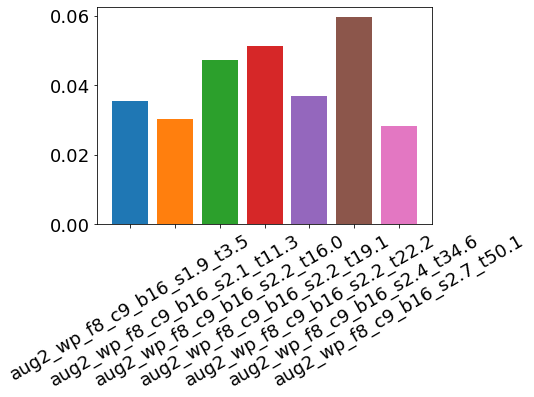

In [147]:
AUC = evaluation.get_AUC(metrics)
xticks = range(len(AUC))

fig, ax = plt.subplots()
ax.bar(xticks, list(AUC.values()), color=colors)
ax.set_xticks(xticks)
ax.set_xticklabels(list(AUC.keys()), rotation=30)
plt.show()

### Labels binary overlap

In [7]:
fissionStats = {}
for model_name in labels_test:
  print('\nModel name:', model_name)
  fissionStats[model_name] = evaluation.fissionStatsStack(labels_test[model_name], pred_labels_test[model_name])


Model name: aug2_wp_f8_c9_b16_s1.9_t3.5


100%|████████████████████████████████████████████████████████| 7400/7400 [00:02<00:00, 2909.11it/s]



Model name: aug2_wp_f8_c9_b16_s2.1_t11.3


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 4639.10it/s]



Model name: aug2_wp_f8_c9_b16_s2.2_t16.0


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 5606.34it/s]



Model name: aug2_wp_f8_c9_b16_s2.2_t19.1


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 6515.01it/s]



Model name: aug2_wp_f8_c9_b16_s2.2_t22.2


100%|████████████████████████████████████████████████████████| 7400/7400 [00:01<00:00, 7029.23it/s]



Model name: aug2_wp_f8_c9_b16_s2.4_t34.6


100%|███████████████████████████████████████████████████████| 7400/7400 [00:00<00:00, 11446.68it/s]



Model name: aug2_wp_f8_c9_b16_s2.7_t50.1


100%|███████████████████████████████████████████████████████| 7400/7400 [00:00<00:00, 16006.92it/s]


In [8]:
fissionStats = pd.DataFrame(fissionStats, index=['TP', 'FP', 'FN', 'TP_px', 'FP_px', 'FN_px']).T
fissionStats['precision'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FP'])
fissionStats['TPR'] = fissionStats['TP']/(fissionStats['TP']+fissionStats['FN'])
fissionStats['FDR'] = fissionStats['FP']/(fissionStats['TP']+fissionStats['FP'])

fissionStats['precision_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])
fissionStats['TPR_px'] = fissionStats['TP_px']/(fissionStats['TP_px']+fissionStats['FN_px'])
fissionStats['FDR_px'] = fissionStats['FP_px']/(fissionStats['TP_px']+fissionStats['FP_px'])

fissionStats = fissionStats.T

H:/Santi/Figures/aug2_wp_fissionStats.png


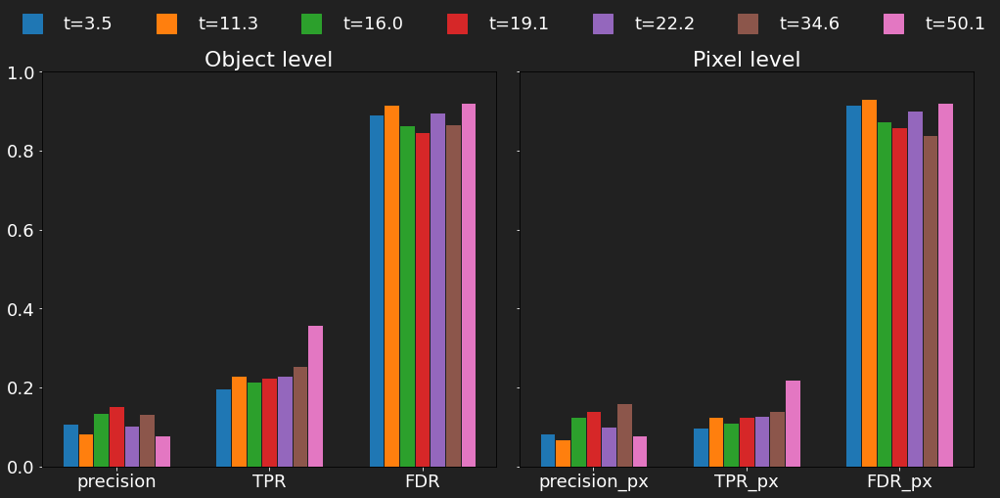

In [14]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'aug2_wp_fissionStats'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

colors = plt.cm.get_cmap('tab10')(range(nb_models))
fig, axes = plt.subplots(1, 2, figsize=(7*2, 7), sharey=True)

fig.set_facecolor(facecolor)  

plotting.plot_metrics_comparison(fissionStats.loc[['precision', 'TPR', 'FDR']], xscale=2, color=colors, ax=axes[0], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)  
plotting.plot_metrics_comparison(fissionStats.loc[['precision_px', 'TPR_px', 'FDR_px']], xscale=2, color=colors, ax=axes[1], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)

for ax, title in zip(axes, ['Object level', 'Pixel level']):
  ax.set_title(title, size=22, color='white')
  ax.set_facecolor(facecolor)
  ax.tick_params(axis='x', colors='white')
  ax.tick_params(axis='y', colors='white')

legend = fig.legend([plt.plot([], marker='s', ls='none', markersize=20, color=color)[0] for color in colors], ['t='+model_name.split('_t')[-1] for model_name in folder_name],
                    loc='upper center', facecolor=facecolor, labelcolor='white', framealpha=1, ncol=nb_models)
frame = legend.get_frame()
frame.set_color(facecolor)

plt.tight_layout(pad=0)
fig.subplots_adjust(wspace=0.05, top=0.85, right=0.98)

#plt.show()
fig.savefig(filename)

### Detection match

In [11]:
det_match = [evaluation.detection_match(output_test[model_name], pred_output_test[model_name], otsu_threshold[model_name]) for model_name in folder_name]

## Temporal filtered Mito & WatProc, different spot sizes

In [6]:
temp_filter = util.load_pkl(data_path, 'temporal_filter')

#Inputs
input_data = util.load_h5(data_path, 'Mito')
print('Inputs'+':', input_data.shape)

optimal_sigma = util.load_pkl(data_path, 'max_optimal_sigma')
threshold = util.load_pkl(data_path, 'max_intensity_threshold')
nb_sigmas = optimal_sigma.shape[0]


Loading H:/Santi/Data/temporal_filter

Loading H:/Santi/Data/Mito.h5
Converting to array
Inputs: (37000, 128, 128)

Loading H:/Santi/Data/max_optimal_sigma

Loading H:/Santi/Data/max_intensity_threshold


In [7]:
#Outputs
folder_name = util.get_filename(model_path, 'max_temp_wp')
nb_models = len(folder_name)

model = util.load_model(model_path, ['model']*nb_models, folder_name, as_type=dict)
history = util.load_pkl(model_path, ['history']*nb_models, folder_name, as_type=dict)
frames_test = util.load_pkl(model_path, ['frames_test']*nb_models, folder_name, as_type=dict)


Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s1.8_t1/model.h5

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s1.9_t6/model.h5

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.0_t21/model.h5

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.1_t33/model.h5

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.1_t48/model.h5

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.2_t68/model.h5

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.2_t98/model.h5
Done.

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s1.8_t1/history

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s1.9_t6/history

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.0_t21/history

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.1_t33/history

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.1_t48/history

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.2_t68/history

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.2_t98/history
Done.

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s1.8_t1/frames_test

Loading H:/Santi/Mode

In [9]:
input_test, output_test, pred_output_test = {}, {}, {}
labels_test, pred_labels_test = {}, {}
otsu_threshold = {}

for model_name, s, t in zip(folder_name, optimal_sigma, threshold):
  print('\nModel: %s'%model_name)
  #Outputs
  output_data = util.load_h5(data_path, 'WatProc_s%.1f_t%i'%(s, t))*temp_filter[:, None, None]
  print('Outputs:', output_data.shape)
  output_test[model_name] = output_data[frames_test[model_name]]
  del output_data

  #Labels
  labels = util.load_h5(data_path, 'proc_labels_s%.1f_t%i'%(s, t))*temp_filter[:, None, None]
  print('Labels:', labels.shape)
  labels_test[model_name] = labels[frames_test[model_name]]
  del labels

  input_test[model_name] = input_data[frames_test[model_name]]
  pred_output_test[model_name] = evaluation.predict(input_test[model_name], model[model_name])
  otsu_threshold[model_name] = filters.threshold_otsu(pred_output_test[model_name])
  pred_labels_test[model_name] = evaluation.label(pred_output_test[model_name], threshold=otsu_threshold[model_name]) 

del input_data


Model: max_temp_wp_f8_c9_b16_s1.8_t1

Loading H:/Santi/Data/WatProc_s1.8_t1.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s1.8_t1.h5
Converting to array
Labels: (37000, 128, 128)

Model: max_temp_wp_f8_c9_b16_s1.9_t6

Loading H:/Santi/Data/WatProc_s1.9_t6.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s1.9_t6.h5
Converting to array
Labels: (37000, 128, 128)

Model: max_temp_wp_f8_c9_b16_s2.0_t21

Loading H:/Santi/Data/WatProc_s2.0_t21.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.0_t21.h5
Converting to array
Labels: (37000, 128, 128)

Model: max_temp_wp_f8_c9_b16_s2.1_t33

Loading H:/Santi/Data/WatProc_s2.1_t33.h5
Converting to array
Outputs: (37000, 128, 128)

Loading H:/Santi/Data/proc_labels_s2.1_t33.h5
Converting to array
Labels: (37000, 128, 128)

Model: max_temp_wp_f8_c9_b16_s2.1_t48

Loading H:/Santi/Data/WatProc_s2.1_t48.h5
Converting to array
Outputs: (37000,

In [98]:
threshold = util.load_pkl(data_path, 'max_intensity_threshold')


Loading H:/Santi/Data/max_intensity_threshold


H:/Santi/Figures/max_temp_wp_examples.png


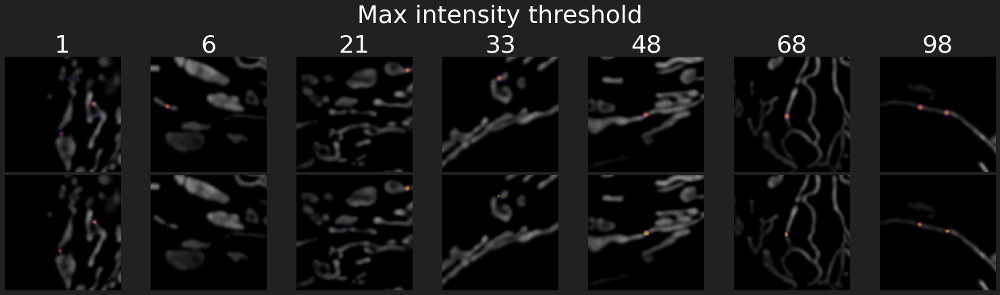

In [111]:
facecolor = (0.13, 0.13, 0.13, 1)

title = 'max_temp_wp_examples'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

title_size = 36

fig, axes = plt.subplots(2, nb_models, figsize=(3*nb_models, 6))
fig.suptitle('Max intensity threshold', size=title_size, color='white')
fig.set_facecolor(facecolor)

for model_name, i in zip(folder_name, range(nb_models)):
  frame = np.random.choice(np.where(np.any(np.any(output_test[model_name]>0, axis=-1), axis=-1))[0])
  mask = pred_output_test[model_name][frame]>otsu_threshold[model_name]
  plotting.plot_merge(input_test[model_name][frame], output_test[model_name][frame], title='', ax=axes[0, i])
  plotting.plot_merge(input_test[model_name][frame], pred_output_test[model_name][frame]*mask, title='', ax=axes[1, i])
  axes[0, i].set_title(threshold[i].round(1), size=title_size, color='white')
  
fig.tight_layout(pad=0)
fig.subplots_adjust(wspace=0, hspace=0.02, top=0.8)
plt.show()
#fig.savefig(filename)

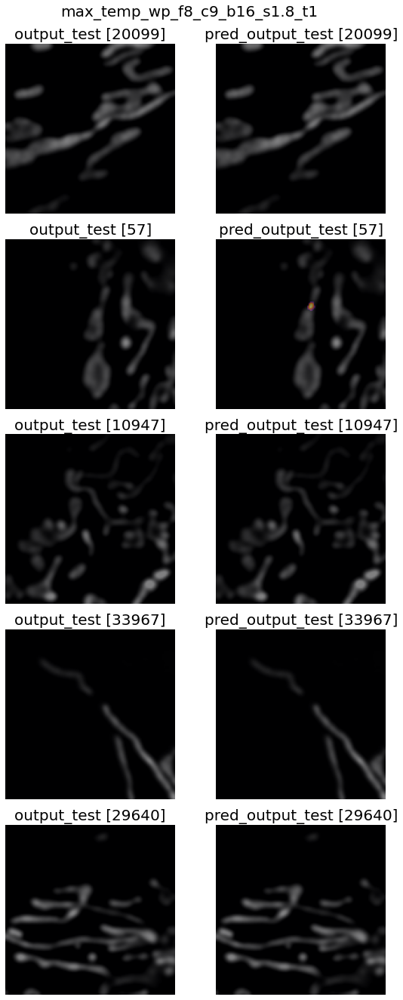

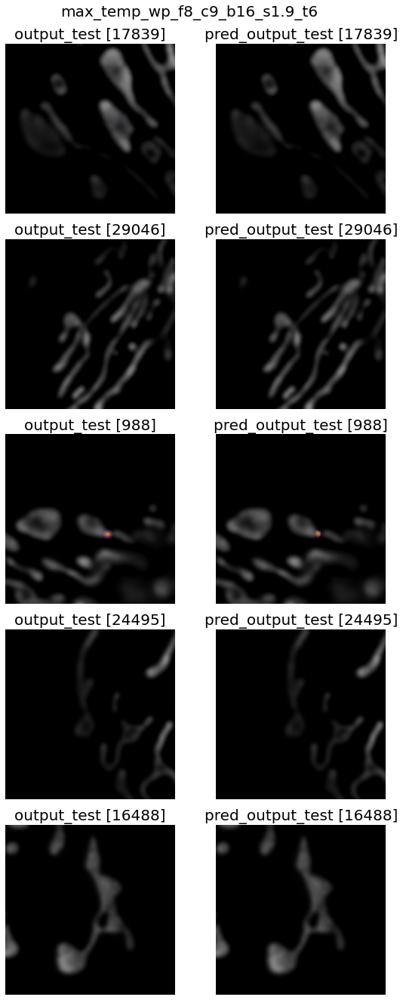

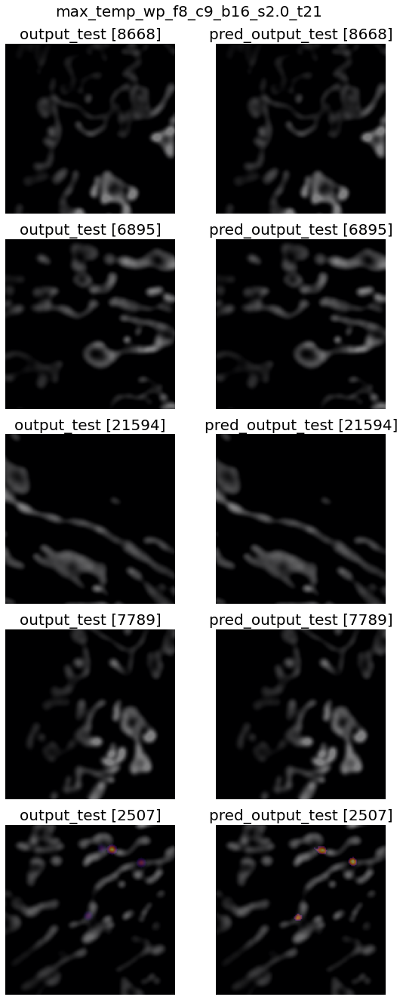

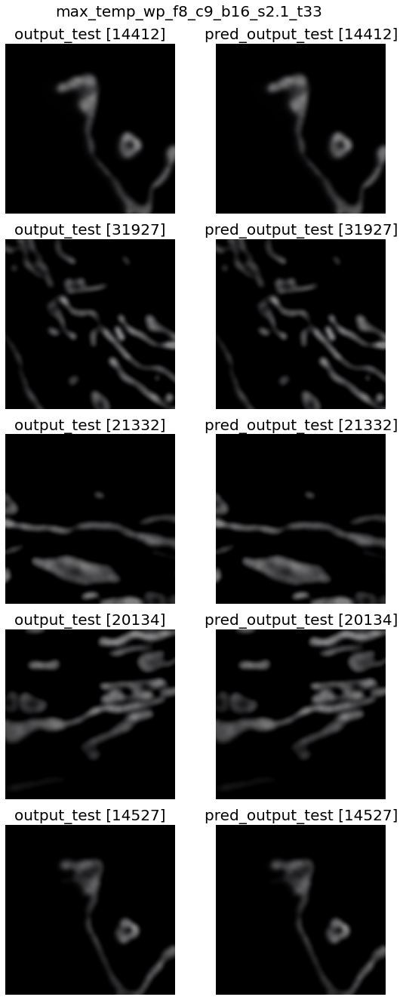

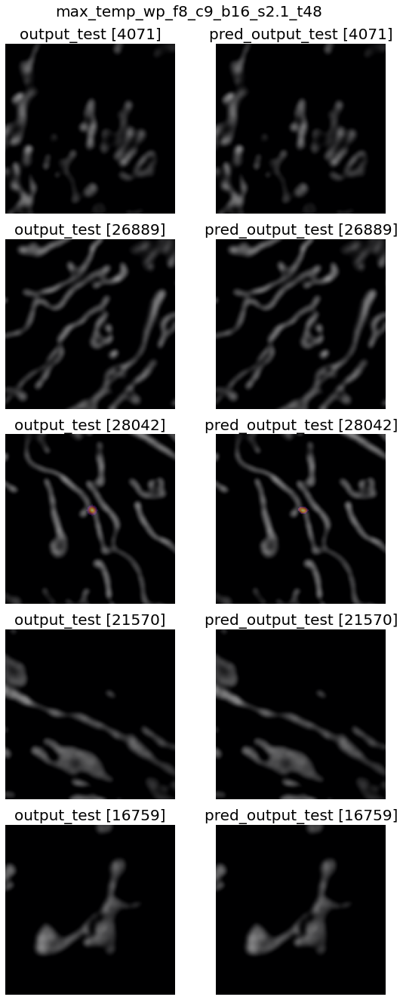

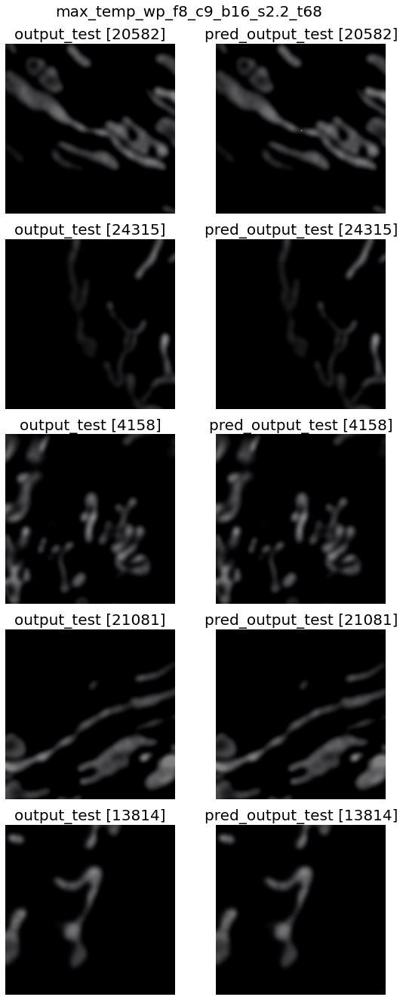

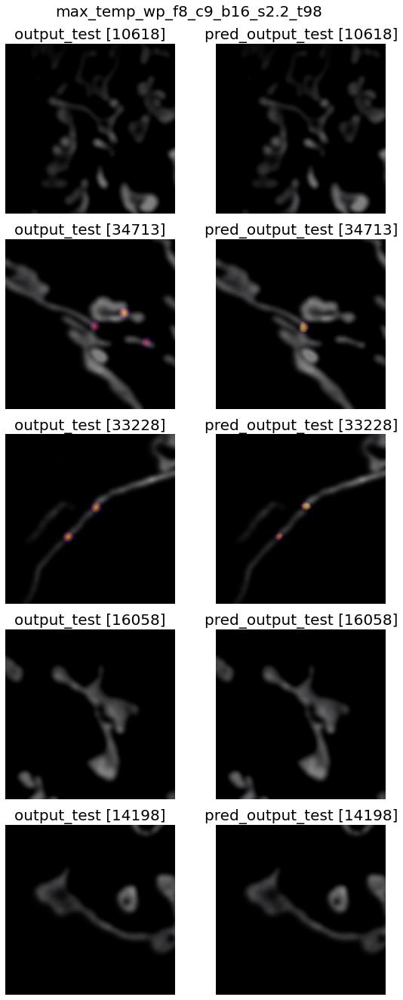

In [12]:
for model_name in folder_name:
  mask = pred_output_test[model_name]>otsu_threshold[model_name]
  plotting.plot_outputs(input_test[model_name], output_test[model_name], 
                        pred_output_test[model_name]*mask, frames_test[model_name], 
                        nb_examples=5, title=model_name, cmap=['gray', 'inferno'])
  plt.show()
  print('\n')

In [17]:
metrics = {}
thresholds = np.linspace(0, 1, 50, endpoint=True)

for model_name in folder_name:
  print('%s'%(model_name))
  metrics[model_name] = evaluation.get_metrics(output_test[model_name], pred_output_test[model_name], thresholds)
util.save_pkl(metrics, model_path, ['metrics']*len(folder_name), folder_name)

max_temp_wp_f8_c9_b16_s1.8_t1


100%|██████████████████████████████████████████████████████████████| 50/50 [00:42<00:00,  1.17it/s]
C:\Users\snrodrig\Documents\GitHub\MitoSplit-Net\mitosplit-net\evaluation.py:127: RuntimeWarning: invalid value encountered in true_divide
  'precision': tp/(tp+fp),


max_temp_wp_f8_c9_b16_s1.9_t6


100%|██████████████████████████████████████████████████████████████| 50/50 [00:41<00:00,  1.19it/s]


max_temp_wp_f8_c9_b16_s2.0_t21


100%|██████████████████████████████████████████████████████████████| 50/50 [00:42<00:00,  1.17it/s]


max_temp_wp_f8_c9_b16_s2.1_t33


100%|██████████████████████████████████████████████████████████████| 50/50 [00:41<00:00,  1.20it/s]


max_temp_wp_f8_c9_b16_s2.1_t48


100%|██████████████████████████████████████████████████████████████| 50/50 [00:41<00:00,  1.20it/s]


max_temp_wp_f8_c9_b16_s2.2_t68


100%|██████████████████████████████████████████████████████████████| 50/50 [00:41<00:00,  1.21it/s]


max_temp_wp_f8_c9_b16_s2.2_t98


100%|██████████████████████████████████████████████████████████████| 50/50 [00:41<00:00,  1.21it/s]


Saving H:/Santi/Models/max_temp_wp_f8_c9_b16_s1.8_t1/metrics

Saving H:/Santi/Models/max_temp_wp_f8_c9_b16_s1.9_t6/metrics

Saving H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.0_t21/metrics

Saving H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.1_t33/metrics

Saving H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.1_t48/metrics

Saving H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.2_t68/metrics

Saving H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.2_t98/metrics
Done.


In [18]:
thresholds = np.linspace(0, 1, 50, endpoint=True)
metrics = util.load_pkl(model_path, ['metrics']*len(folder_name), folder_name, as_type=dict)


Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s1.8_t1/metrics

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s1.9_t6/metrics

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.0_t21/metrics

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.1_t33/metrics

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.1_t48/metrics

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.2_t68/metrics

Loading H:/Santi/Models/max_temp_wp_f8_c9_b16_s2.2_t98/metrics
Done.


### All metrics

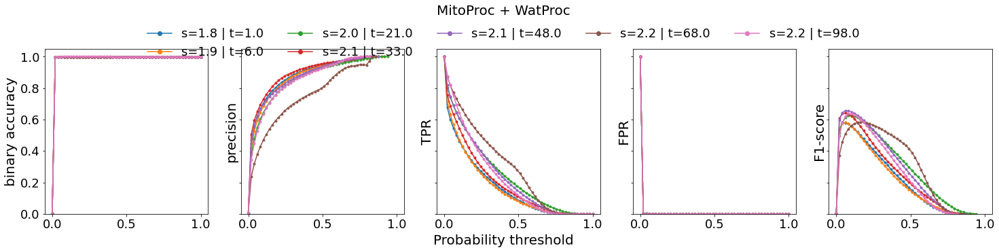

In [19]:
nb_models = len(metrics)
nb_metrics = len(metrics[folder_name[0]])
colors = plt.cm.get_cmap('tab10')(range(nb_models))

fig, axes = plt.subplots(1, nb_metrics, figsize=(5*nb_metrics, 5), sharex=True, sharey=True)
fig.suptitle('MitoProc + WatProc', size=20, va='top')
for model_name, color in zip(folder_name, colors):
  for metric_name, ax in zip(metrics[model_name], axes):
    ax.plot(thresholds, metrics[model_name][metric_name], 'o-', markersize=3, color=color)
    ax.set_ylabel(metric_name)
    ax.set_ylim([0, 1.05])
fig.text(0.5, 0, 'Probability threshold', fontsize=20, ha='center')
fig.legend([plt.plot([], 'o-', color=color)[0] for color in colors], ['s=%.1f | t=%.1f'%(s, t) for s, t in zip(optimal_sigma, threshold)],
           loc='upper center', bbox_to_anchor=(0.5, 0.93), ncol=5, framealpha=0)
fig.subplots_adjust(top=0.8)
plt.show()

### metricAtMaxF1

In [20]:
metricsAtMaxThreshold = pd.DataFrame({model_name: {metric_name: metrics[model_name][metric_name][metrics[model_name]['F1-score']==np.nanmax(metrics[model_name]['F1-score'])][0]  for metric_name in metrics[model_name]} \
                                      for model_name in folder_name})
metricsAtMaxThreshold

,max_temp_wp_f8_c9_b16_s1.8_t1,max_temp_wp_f8_c9_b16_s1.9_t6,max_temp_wp_f8_c9_b16_s2.0_t21,max_temp_wp_f8_c9_b16_s2.1_t33,max_temp_wp_f8_c9_b16_s2.1_t48,max_temp_wp_f8_c9_b16_s2.2_t68,max_temp_wp_f8_c9_b16_s2.2_t98
binary accuracy,0.998937,0.998943,0.999129,0.999283,0.999359,0.999321,0.999513
precision,0.618775,0.594068,0.645035,0.649655,0.624030,0.567178,0.635387
TPR,0.545731,0.569887,0.606674,0.633924,0.691142,0.600784,0.641471
FPR,0.000453,0.000503,0.000400,0.000347,0.000369,0.000363,0.000247
F1-score,0.579962,0.581726,0.625267,0.641693,0.655873,0.583497,0.638415


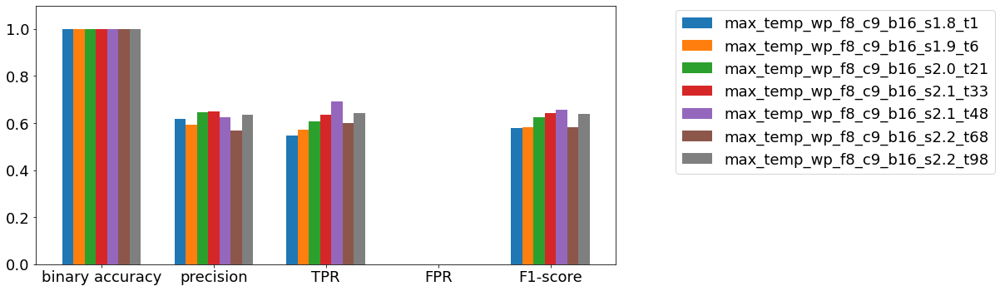

In [21]:
ax = plotting.plot_metrics_comparison(metricsAtMaxThreshold, xscale=2.5, yscale=1.1)
plt.show()

### ROC and Precision-Recall curves


Fraction of positives
{'max_temp_wp_f8_c9_b16_s1.8_t1': 0.0013443900443412162, 'max_temp_wp_f8_c9_b16_s1.9_t6': 0.0012893594277871622, 'max_temp_wp_f8_c9_b16_s2.0_t21': 0.0011979881492820946, 'max_temp_wp_f8_c9_b16_s2.1_t33': 0.0010133238096494933, 'max_temp_wp_f8_c9_b16_s2.1_t48': 0.0008844901419974662, 'max_temp_wp_f8_c9_b16_s2.2_t68': 0.0007913785367398648, 'max_temp_wp_f8_c9_b16_s2.2_t98': 0.0006702072555954392}


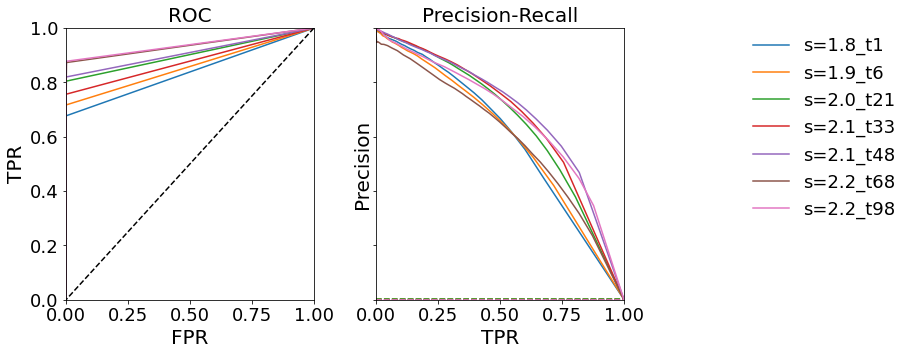

In [22]:
plotting.plot_performance_curves(metrics, output_test, colors=colors)
plt.show()

### Precision-Recall AUC

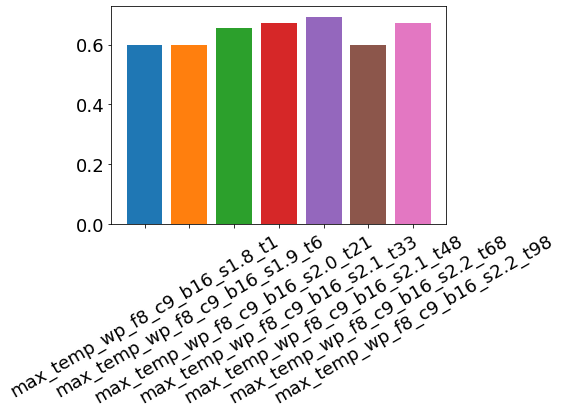

In [23]:
AUC = evaluation.get_AUC(metrics)
xticks = range(len(AUC))

fig, ax = plt.subplots()
ax.bar(xticks, list(AUC.values()), color=colors)
ax.set_xticks(xticks)
ax.set_xticklabels(list(AUC.keys()), rotation=30)
plt.show()

### Labels binary overlap

In [123]:
folder_name = util.get_filename(model_path, 'max_temp_wp')
nb_models = len(folder_name)

colors = plt.cm.get_cmap('tab10')(range(nb_models))

In [124]:
fissionStats = util.load_pkl(model_path, 'max_temp_fissionStats')


Loading H:/Santi/Models/max_temp_fissionStats


In [129]:
fissionStats['max_temp_wp_f8_c9_b16_s2.1_t48'].round(2)

TP               1871.00
FP                608.00
FN                380.00
TP_px           48844.00
FP_px           12283.00
FN_px           18214.00
precision           0.75
TPR                 0.83
FDR                 0.25
precision_px        0.80
TPR_px              0.73
FDR_px              0.20
Name: max_temp_wp_f8_c9_b16_s2.1_t48, dtype: float64

H:/Santi/Figures/max_temp_fissionStats.png


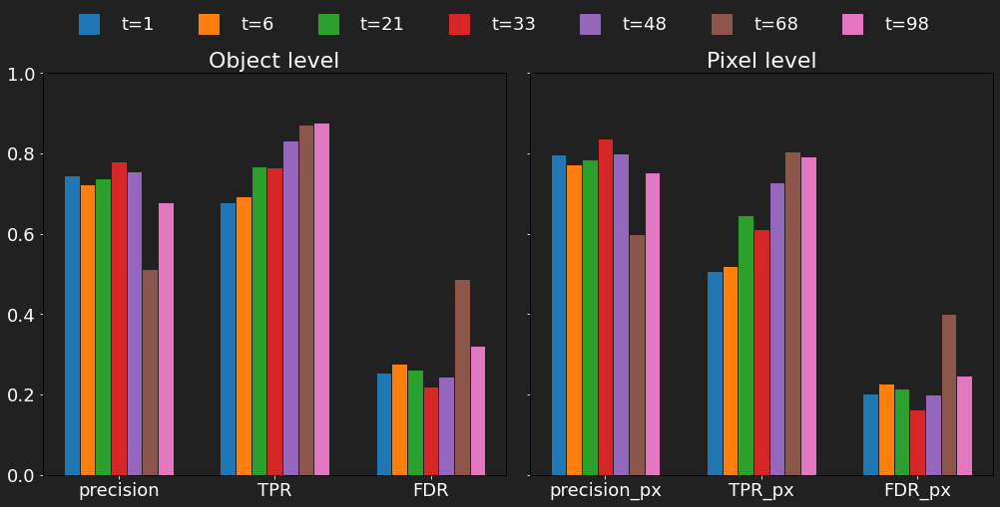

In [91]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'max_temp_fissionStats'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

colors = plt.cm.get_cmap('tab10')(range(nb_models))
fig, axes = plt.subplots(1, 2, figsize=(7*2, 7), sharey=True)

fig.set_facecolor(facecolor)  

plotting.plot_metrics_comparison(fissionStats.loc[['precision', 'TPR', 'FDR']], xscale=2, color=colors, ax=axes[0], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)  
plotting.plot_metrics_comparison(fissionStats.loc[['precision_px', 'TPR_px', 'FDR_px']], xscale=2, color=colors, ax=axes[1], ylim=[0, 1], legend=False,
                                 edgecolor=facecolor)

for ax, title in zip(axes, ['Object level', 'Pixel level']):
  ax.set_title(title, size=22, color='white')
  ax.set_facecolor(facecolor)
  ax.tick_params(axis='x', colors='white')
  ax.tick_params(axis='y', colors='white')

legend = fig.legend([plt.plot([], marker='s', ls='none', markersize=20, color=color)[0] for color in colors], ['t='+model_name.split('_t')[-1] for model_name in folder_name],
                    loc='upper center', facecolor=facecolor, labelcolor='white', framealpha=1, ncol=nb_models)
frame = legend.get_frame()
frame.set_color(facecolor)

plt.tight_layout(pad=0)
fig.subplots_adjust(wspace=0.05, top=0.85, right=0.98)

#plt.show()
fig.savefig(filename)

### Detection match

In [56]:
det_match = util.load_pkl(model_path, 'max_temp_det_match')


Loading H:/Santi/Models/max_temp_det_match


H:/Santi/Figures/max_temp_wp_det_match.png


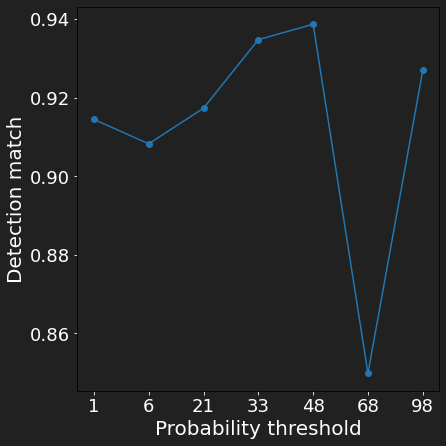

In [58]:
facecolor = (0.13, 0.13, 0.13, 1)
title = 'max_temp_wp_det_match'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

fig, ax = plt.subplots(figsize=(6, 6))
fig.set_facecolor(facecolor)
ax.set_facecolor(facecolor)

ax.plot(det_match, 'o-')
ax.set_xticks(range(len(det_match)))
ax.set_xticklabels([model_name.split('_t')[-1] for model_name in folder_name])
ax.set_xlabel('Probability threshold', color='white')
ax.set_ylabel('Detection match', color='white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

plt.tight_layout(pad=0)
#plt.show()
fig.savefig(filename)

## Model comparison

In [112]:
filename = ['max_temp_det_match']
det_match = [util.load_pkl(model_path, name) for name in filename]
threshold = util.load_pkl(data_path, 'mean_intensity_threshold')
max_threshold = util.load_pkl(data_path, 'max_intensity_threshold')
nb_models = len(filename)+1


Loading H:/Santi/Models/max_temp_det_match

Loading H:/Santi/Data/mean_intensity_threshold

Loading H:/Santi/Data/max_intensity_threshold


H:/Santi/Figures/det_match_comparison.png


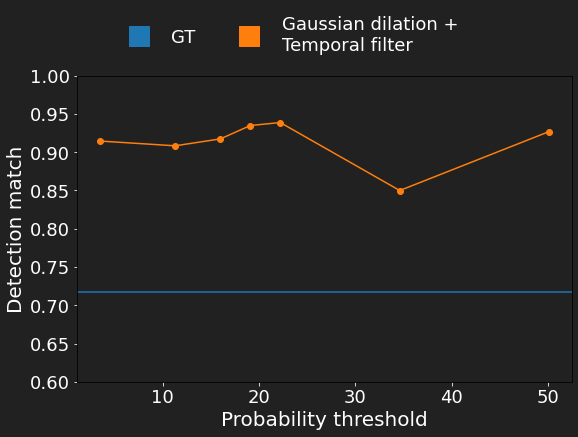

In [113]:
facecolor = (0.13, 0.13, 0.13, 1)
colors = plt.cm.get_cmap('tab10')(range(nb_models))

title = 'det_match_comparison'
filename = base_dir+'Figures/'+title+'.png'
print(filename)

fig, ax = plt.subplots(figsize=(8, 6))
fig.set_facecolor(facecolor)
ax.set_facecolor(facecolor)


ax.axhline(0.7175, color=colors[0])
ax.plot(threshold.round(1), det_match[0], 'o-', color=colors[1])
#ax.plot(max_threshold, det_match[1], 'o-', color=colors[2])
ax.set_ylim([0.6, 1])
#ax.set_xticks(range(len(threshold)))
#ax.set_xticklabels(threshold.round(1))
ax.set_xlabel('Probability threshold', color='white')
ax.set_ylabel('Detection match', color='white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
legend = fig.legend([plt.plot([], marker='s', ls='none', markersize=20, color=color)[0] for color in colors], ['GT', 'Gaussian dilation +\nTemporal filter '],
                    loc='upper center', facecolor=facecolor, labelcolor='white', framealpha=1, ncol=nb_models)
frame = legend.get_frame()
frame.set_color(facecolor)

plt.tight_layout(pad=0)
fig.subplots_adjust(top=0.82, right=0.98)

#plt.show()
fig.savefig(filename)